## Hyperparameter experiments

This contains some experiments I ran to tune the hyperparameters of my model.

In [1]:
# import the model helper module
from model.models import *

In [2]:
# define experiment environment

MODEL_FCN_SIMPLE = 'FCN_SIMPLE'
MODEL_FCN_DEEPER = 'FCN_DEEPER'
MODEL_FCN_VGG_BASED = 'FCN_VGG_BASED'

TRAINING_SIZE = 4131
VALIDATION_SIZE = 1184
WORKERS = 2

class Experiment( object ) :
    
    def __init__( self, learningRate, batchSize, epochs, modeltype ) :
        super( Experiment, self ).__init__()
        # parameters to be tuned
        self.m_lrate = learningRate
        self.m_batchSize = batchSize
        self.m_epochs = epochs
        # create model
        if modeltype == MODEL_FCN_VGG_BASED :
            self.m_model = RFCNvggModel( inWidth = 160, inHeight = 160, 
                                         inDepth = 3, numclasses = 3, lrate = learningRate )
        elif modeltype == MODEL_FCN_DEEPER :
            self.m_model = RFCNdeeperModel( inWidth = 160, inHeight = 160, 
                                            inDepth = 3, numclasses = 3, lrate = learningRate )
        else :
            self.m_model = RFCNsimpleModel( inWidth = 160, inHeight = 160, 
                                            inDepth = 3, numclasses = 3, lrate = learningRate )
    
    def lrate( self ) :
        return self.m_lrate
    
    def batchSize( self ) :
        return self.m_batchSize
    
    def epochs( self ) :
        return self.m_epochs
    
    def model( self ) :
        return self.m_model
    
    def run( self ) :
        # load the data
        _trainingIterator = data_iterator.BatchIteratorSimple( batch_size = self.m_batchSize,
                                                               data_folder = os.path.join('..', 'data', 'train'),
                                                               image_shape = ( 160, 160, 3 ),
                                                               shift_aug = True )

        _validationIterator = data_iterator.BatchIteratorSimple( batch_size = self.m_batchSize,
                                                                 data_folder = os.path.join('..', 'data', 'validation'),
                                                                 image_shape = ( 160, 160, 3 ) )
        
        _stepsPerEpoch = int( TRAINING_SIZE / self.m_batchSize )
        _validationSteps = int( VALIDATION_SIZE / self.m_batchSize )
        
        self.m_model.train( self.m_epochs, _trainingIterator, _validationIterator,
                            _stepsPerEpoch, _validationSteps, WORKERS )


### Learning rate tuning

Here we will tune the learning rate by testing with different starting learning rates ( in decreasing order ) for the Adam optimizer.

TESTING WITH LRATE:  0.25
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.5268

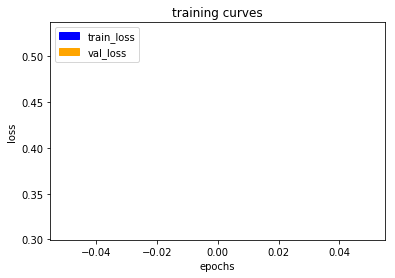

129/129 [==============================] - 51s - loss: 0.5238 - val_loss: 0.3105
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.2971

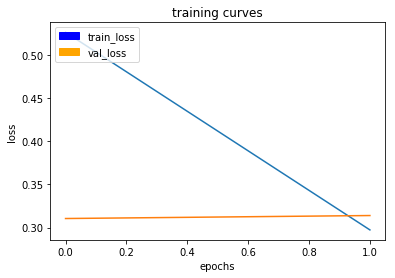

129/129 [==============================] - 49s - loss: 0.2972 - val_loss: 0.3139
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.2958

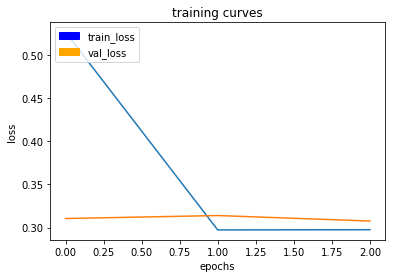

129/129 [==============================] - 49s - loss: 0.2955 - val_loss: 0.3076
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.2952

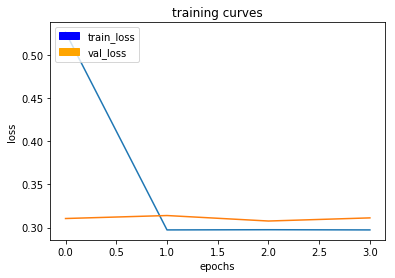

129/129 [==============================] - 49s - loss: 0.2964 - val_loss: 0.3112
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.2946

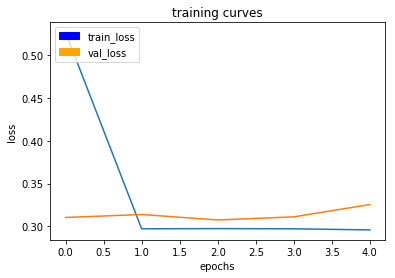

129/129 [==============================] - 49s - loss: 0.2942 - val_loss: 0.3255
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.3001

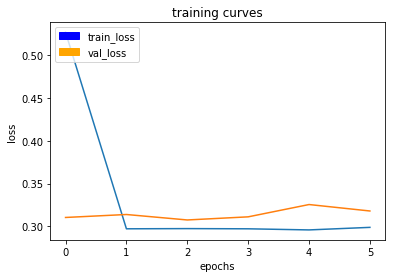

129/129 [==============================] - 49s - loss: 0.2995 - val_loss: 0.3180
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.2951

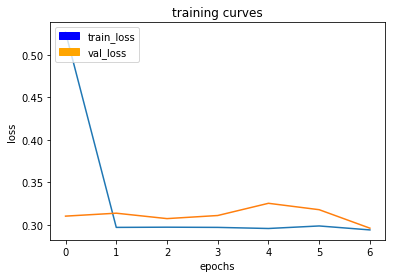

129/129 [==============================] - 49s - loss: 0.2953 - val_loss: 0.2963
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.2989

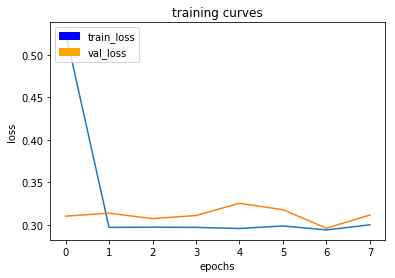

129/129 [==============================] - 49s - loss: 0.2993 - val_loss: 0.3117
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.2989

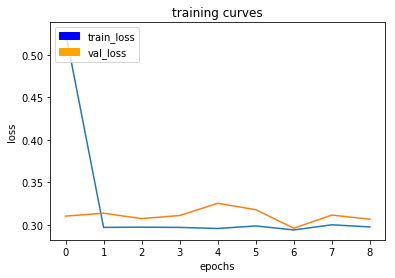

129/129 [==============================] - 49s - loss: 0.2985 - val_loss: 0.3068
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.2957

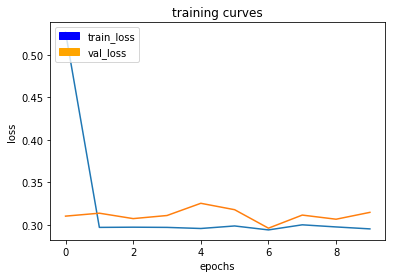

129/129 [==============================] - 49s - loss: 0.2955 - val_loss: 0.3149
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.2985

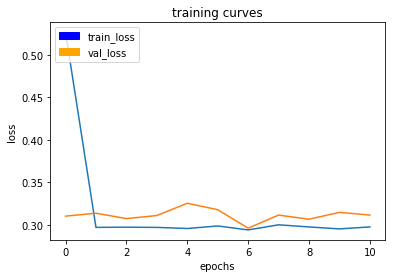

129/129 [==============================] - 49s - loss: 0.2985 - val_loss: 0.3117
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.2970

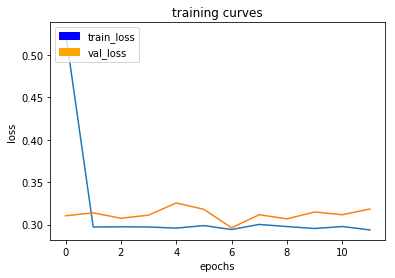

129/129 [==============================] - 49s - loss: 0.2966 - val_loss: 0.3184
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.2997

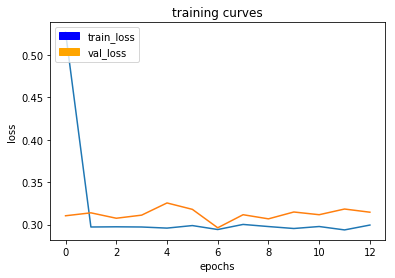

129/129 [==============================] - 49s - loss: 0.2992 - val_loss: 0.3146
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.2957

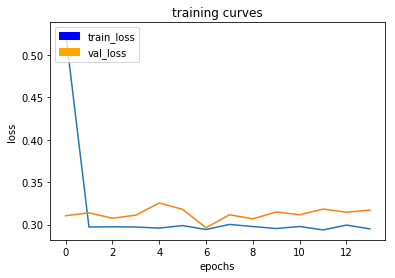

129/129 [==============================] - 49s - loss: 0.2957 - val_loss: 0.3172
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.3014

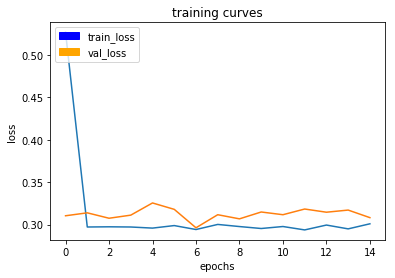

129/129 [==============================] - 49s - loss: 0.3012 - val_loss: 0.3083
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.2959

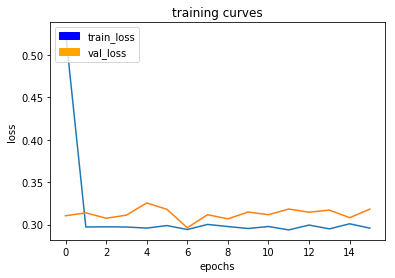

129/129 [==============================] - 49s - loss: 0.2959 - val_loss: 0.3183
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.2914

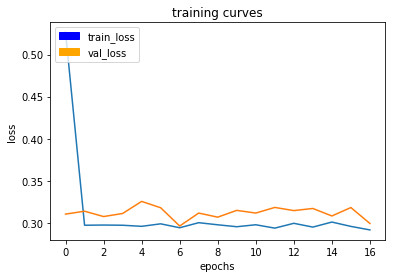

129/129 [==============================] - 49s - loss: 0.2908 - val_loss: 0.2993
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.3051

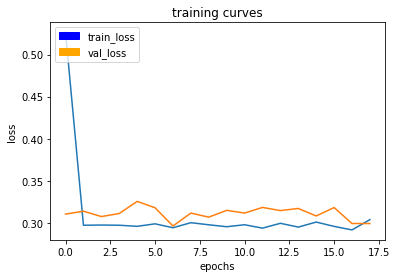

129/129 [==============================] - 49s - loss: 0.3046 - val_loss: 0.2992
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.2938

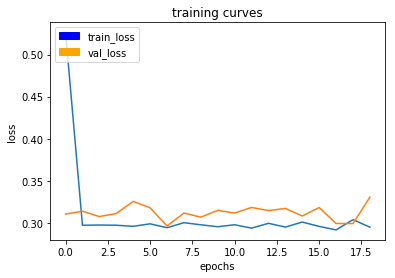

129/129 [==============================] - 49s - loss: 0.2939 - val_loss: 0.3306
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.2997

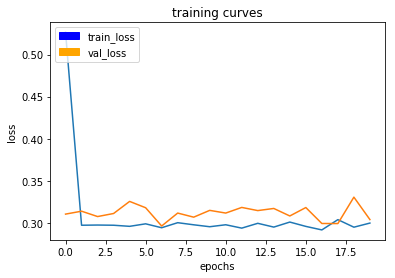

129/129 [==============================] - 49s - loss: 0.2990 - val_loss: 0.3040
TESTING WITH LRATE:  0.125
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.4491

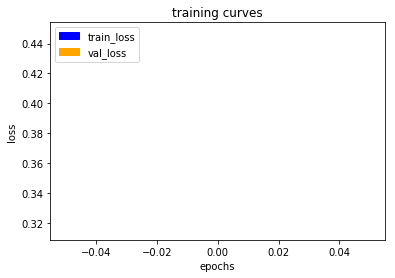

129/129 [==============================] - 49s - loss: 0.4476 - val_loss: 0.3153
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.2991

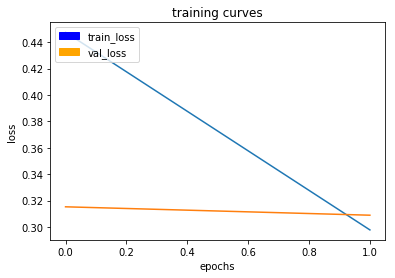

129/129 [==============================] - 48s - loss: 0.2984 - val_loss: 0.3089
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.2962

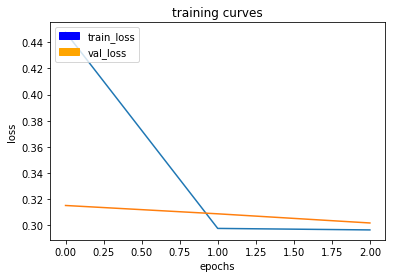

129/129 [==============================] - 48s - loss: 0.2956 - val_loss: 0.3019
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.2954

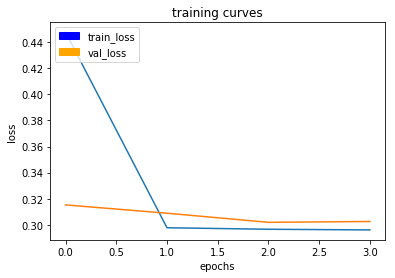

129/129 [==============================] - 48s - loss: 0.2950 - val_loss: 0.3026
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.2991

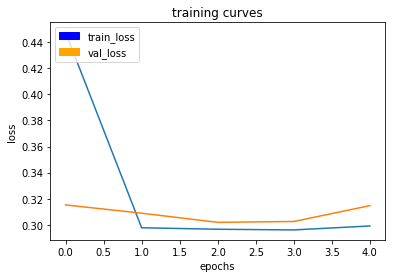

129/129 [==============================] - 48s - loss: 0.2987 - val_loss: 0.3147
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.2953

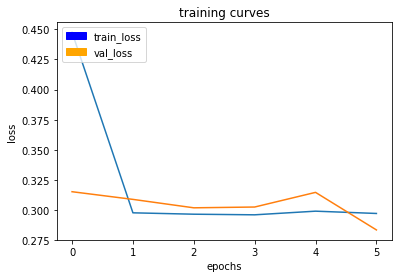

129/129 [==============================] - 48s - loss: 0.2970 - val_loss: 0.2836
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.2964

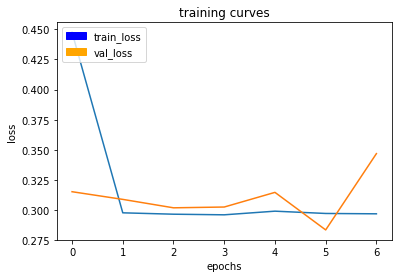

129/129 [==============================] - 48s - loss: 0.2967 - val_loss: 0.3469
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.2960

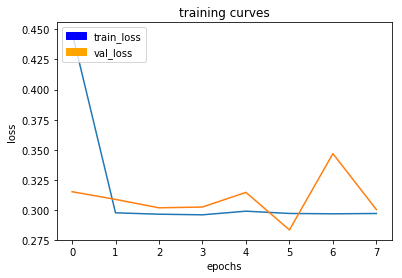

129/129 [==============================] - 48s - loss: 0.2963 - val_loss: 0.3004
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.2938

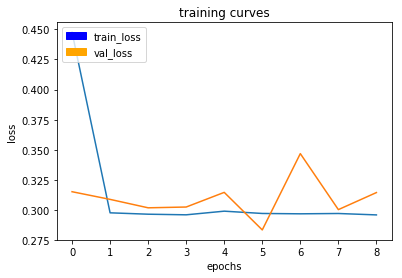

129/129 [==============================] - 48s - loss: 0.2946 - val_loss: 0.3146
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.2985

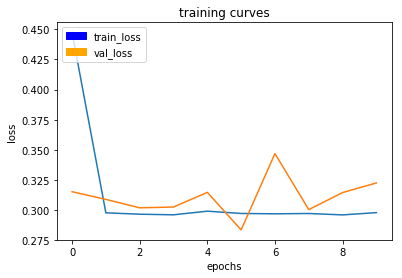

129/129 [==============================] - 48s - loss: 0.2977 - val_loss: 0.3226
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.3007

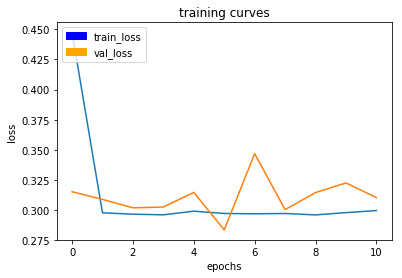

129/129 [==============================] - 48s - loss: 0.3004 - val_loss: 0.3104
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.2989

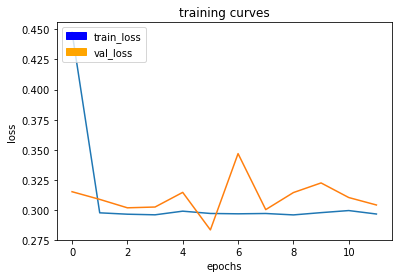

129/129 [==============================] - 48s - loss: 0.2989 - val_loss: 0.3043
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.2949

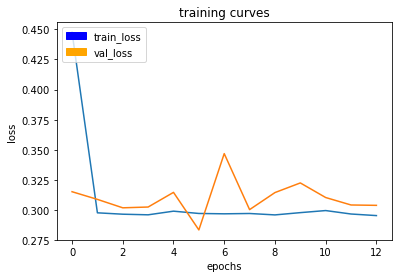

129/129 [==============================] - 48s - loss: 0.2954 - val_loss: 0.3040
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.2941

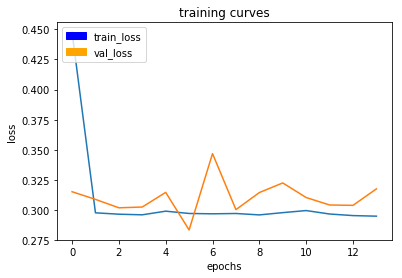

129/129 [==============================] - 48s - loss: 0.2936 - val_loss: 0.3176
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.2968

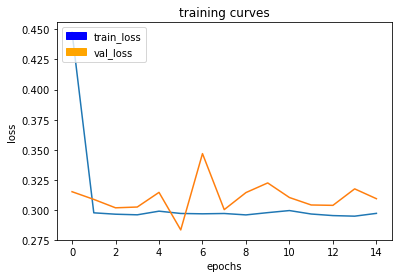

129/129 [==============================] - 48s - loss: 0.2971 - val_loss: 0.3095
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.3003

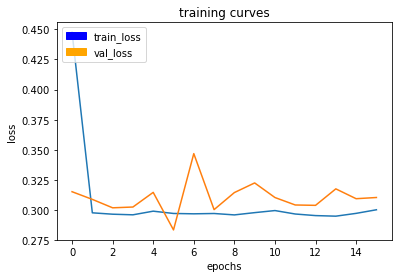

129/129 [==============================] - 48s - loss: 0.2999 - val_loss: 0.3105
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.2967

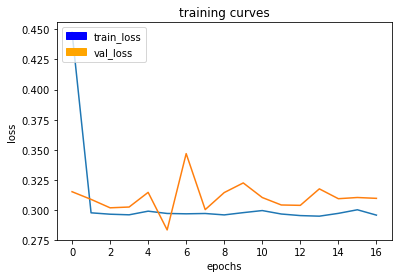

129/129 [==============================] - 48s - loss: 0.2967 - val_loss: 0.3098
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.2945

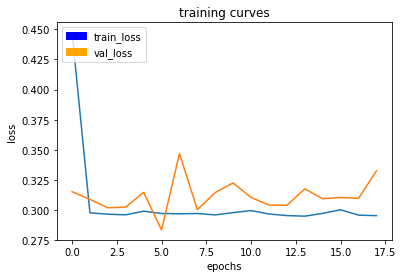

129/129 [==============================] - 48s - loss: 0.2941 - val_loss: 0.3326
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.2993

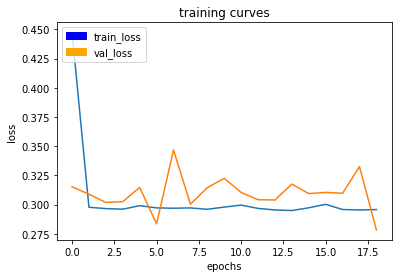

129/129 [==============================] - 48s - loss: 0.2985 - val_loss: 0.2784
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.2996

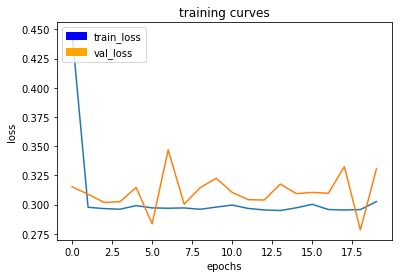

129/129 [==============================] - 48s - loss: 0.3017 - val_loss: 0.3306
TESTING WITH LRATE:  0.0625
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.2319

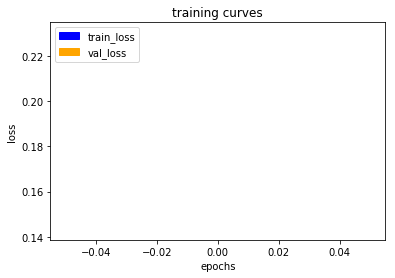

129/129 [==============================] - 50s - loss: 0.2305 - val_loss: 0.1430
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0725

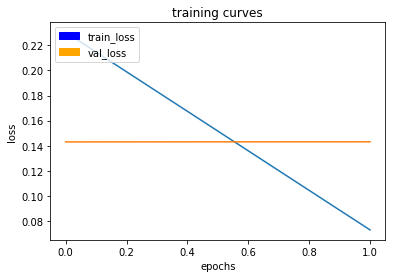

129/129 [==============================] - 49s - loss: 0.0724 - val_loss: 0.1431
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0663

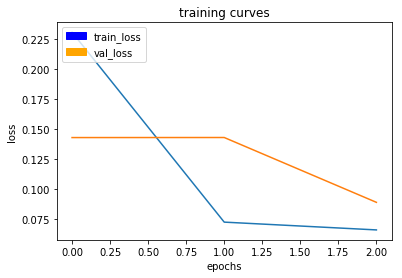

129/129 [==============================] - 49s - loss: 0.0663 - val_loss: 0.0892
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0578

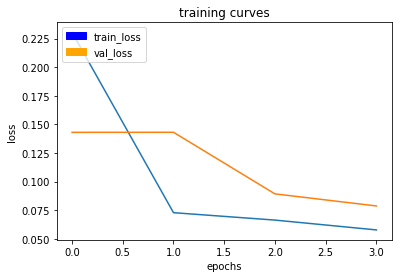

129/129 [==============================] - 49s - loss: 0.0577 - val_loss: 0.0787
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0551

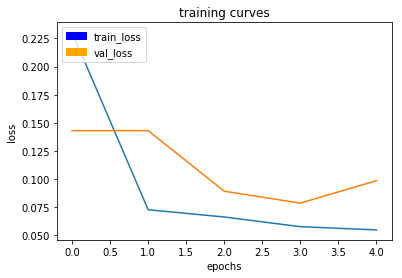

129/129 [==============================] - 49s - loss: 0.0550 - val_loss: 0.0986
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0501

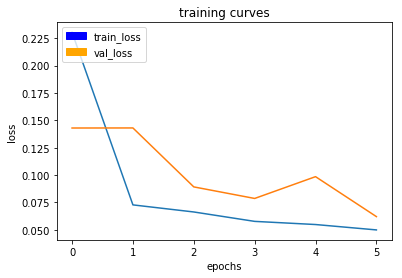

129/129 [==============================] - 49s - loss: 0.0499 - val_loss: 0.0621
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0505

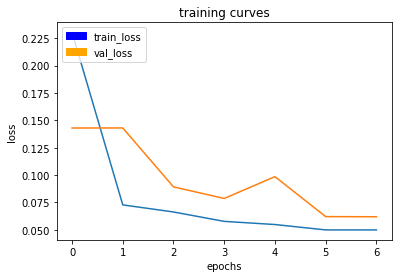

129/129 [==============================] - 49s - loss: 0.0504 - val_loss: 0.0620
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0451

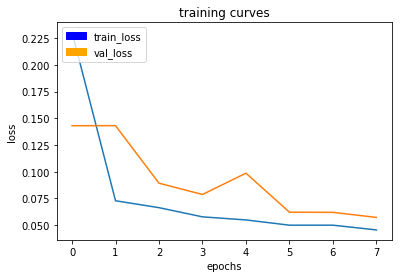

129/129 [==============================] - 49s - loss: 0.0455 - val_loss: 0.0572
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0422

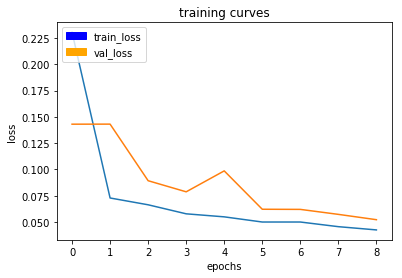

129/129 [==============================] - 49s - loss: 0.0424 - val_loss: 0.0522
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0403

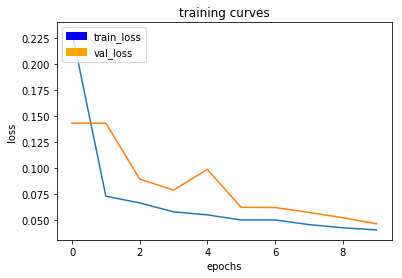

129/129 [==============================] - 49s - loss: 0.0403 - val_loss: 0.0463
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0388

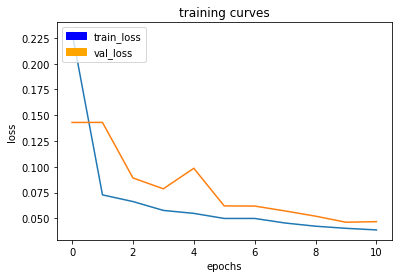

129/129 [==============================] - 49s - loss: 0.0388 - val_loss: 0.0468
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0400

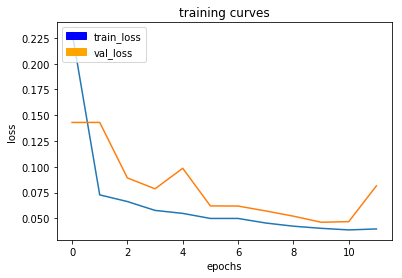

129/129 [==============================] - 49s - loss: 0.0401 - val_loss: 0.0816
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0388

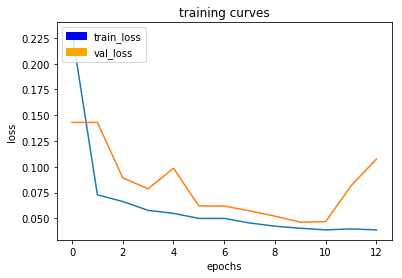

129/129 [==============================] - 49s - loss: 0.0388 - val_loss: 0.1076
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0354

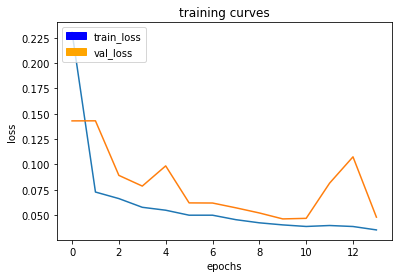

129/129 [==============================] - 49s - loss: 0.0353 - val_loss: 0.0480
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0347

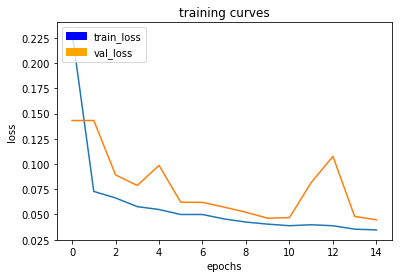

129/129 [==============================] - 49s - loss: 0.0347 - val_loss: 0.0447
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0357

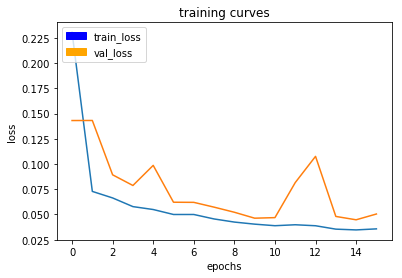

129/129 [==============================] - 49s - loss: 0.0357 - val_loss: 0.0504
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0316

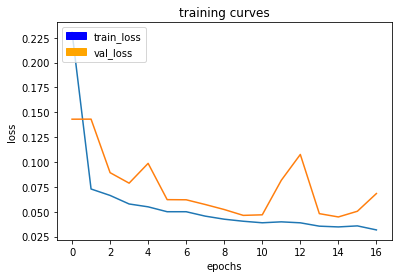

129/129 [==============================] - 49s - loss: 0.0316 - val_loss: 0.0683
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0330

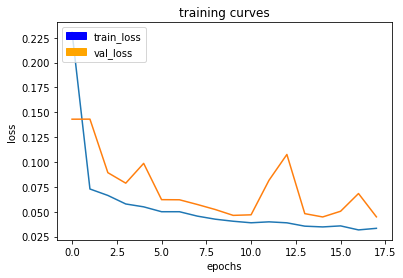

129/129 [==============================] - 49s - loss: 0.0331 - val_loss: 0.0448
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0321

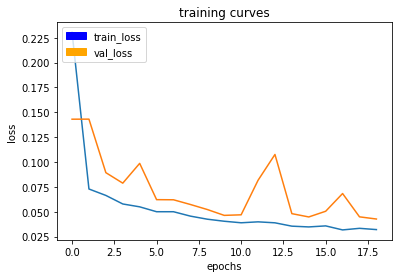

129/129 [==============================] - 49s - loss: 0.0321 - val_loss: 0.0426
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0333

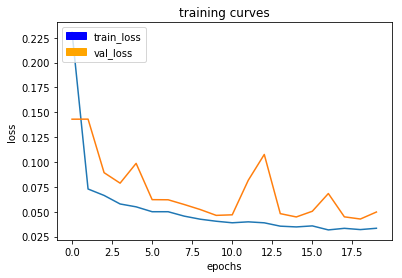

129/129 [==============================] - 49s - loss: 0.0333 - val_loss: 0.0497
TESTING WITH LRATE:  0.03125
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.1563

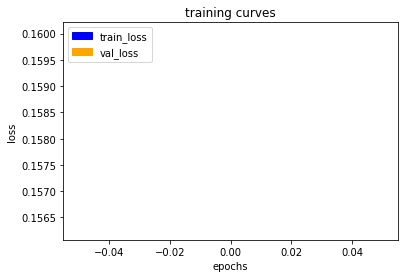

129/129 [==============================] - 50s - loss: 0.1559 - val_loss: 0.1600
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0561

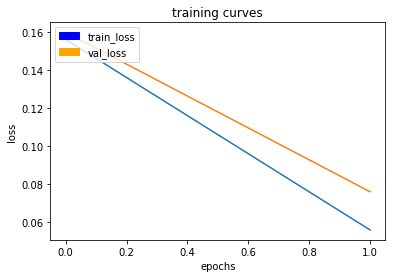

129/129 [==============================] - 50s - loss: 0.0561 - val_loss: 0.0762
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0494

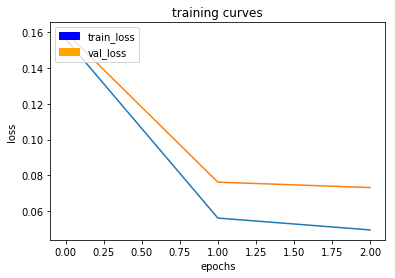

129/129 [==============================] - 49s - loss: 0.0494 - val_loss: 0.0731
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0464

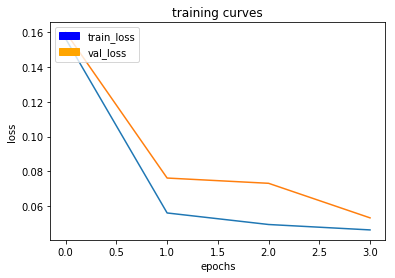

129/129 [==============================] - 49s - loss: 0.0463 - val_loss: 0.0532
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0429

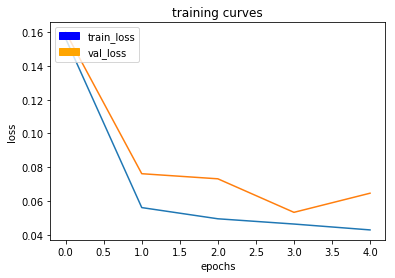

129/129 [==============================] - 49s - loss: 0.0428 - val_loss: 0.0646
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0415

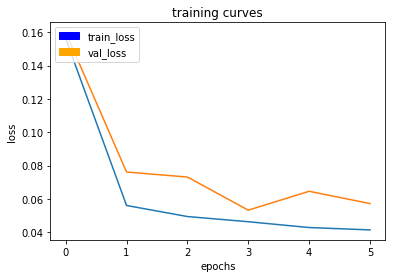

129/129 [==============================] - 49s - loss: 0.0414 - val_loss: 0.0572
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0384

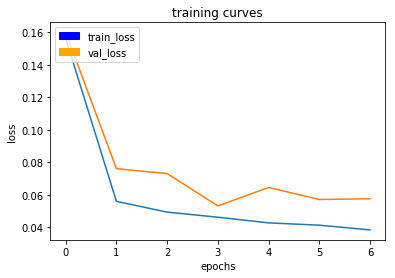

129/129 [==============================] - 50s - loss: 0.0384 - val_loss: 0.0576
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0381

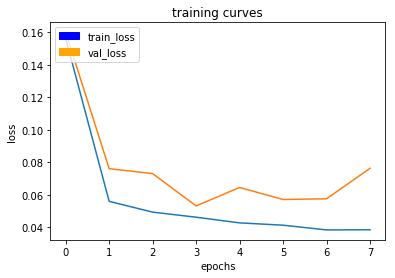

129/129 [==============================] - 49s - loss: 0.0386 - val_loss: 0.0764
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0398

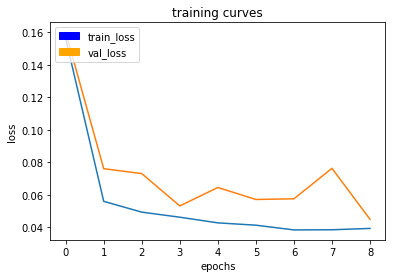

129/129 [==============================] - 49s - loss: 0.0397 - val_loss: 0.0450
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0386

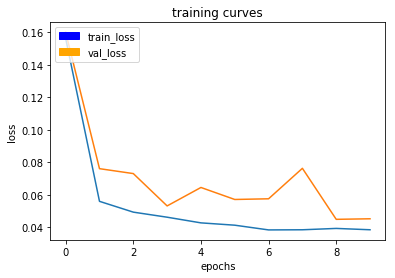

129/129 [==============================] - 49s - loss: 0.0386 - val_loss: 0.0453
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0334

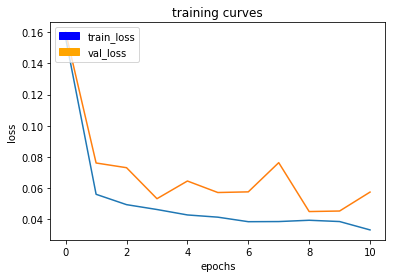

129/129 [==============================] - 49s - loss: 0.0333 - val_loss: 0.0575
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0343

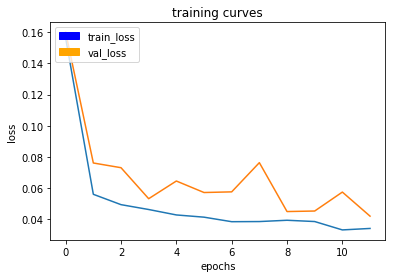

129/129 [==============================] - 49s - loss: 0.0342 - val_loss: 0.0421
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0319

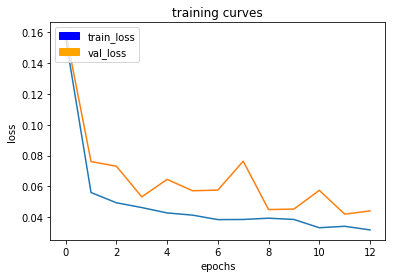

129/129 [==============================] - 49s - loss: 0.0319 - val_loss: 0.0441
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0318

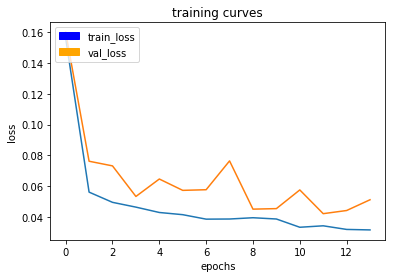

129/129 [==============================] - 49s - loss: 0.0318 - val_loss: 0.0511
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0307

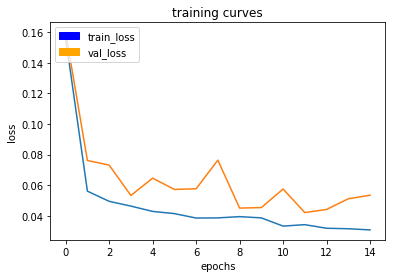

129/129 [==============================] - 49s - loss: 0.0307 - val_loss: 0.0534
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0298

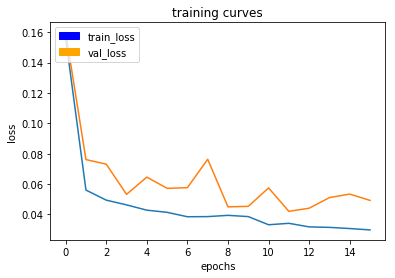

129/129 [==============================] - 50s - loss: 0.0298 - val_loss: 0.0493
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0279

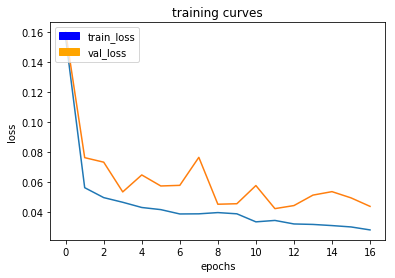

129/129 [==============================] - 49s - loss: 0.0278 - val_loss: 0.0436
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0295

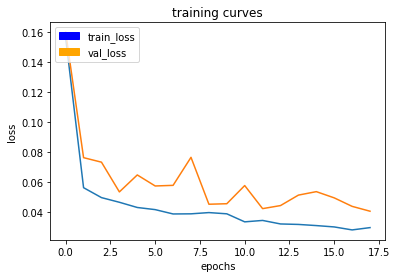

129/129 [==============================] - 49s - loss: 0.0295 - val_loss: 0.0403
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0284

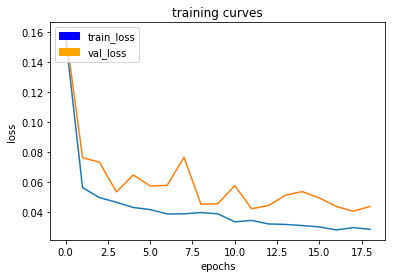

129/129 [==============================] - 49s - loss: 0.0284 - val_loss: 0.0435
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0272

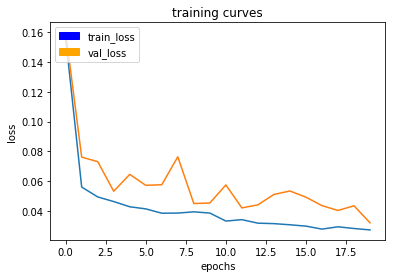

129/129 [==============================] - 49s - loss: 0.0272 - val_loss: 0.0320
TESTING WITH LRATE:  0.015625
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.1520

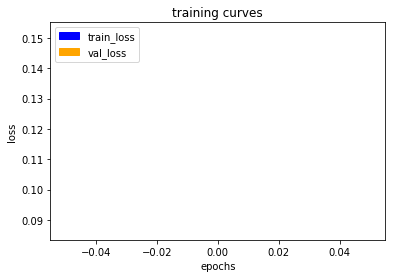

129/129 [==============================] - 49s - loss: 0.1512 - val_loss: 0.0867
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0529

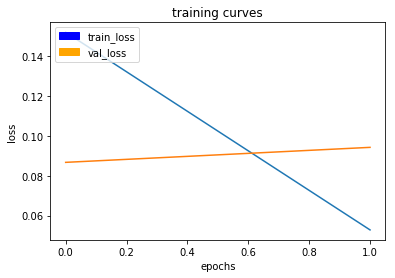

129/129 [==============================] - 49s - loss: 0.0528 - val_loss: 0.0942
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0469

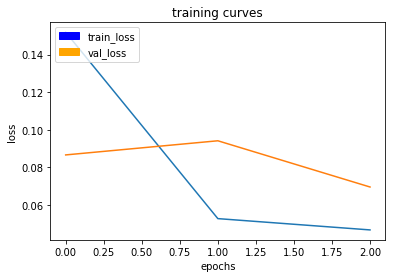

129/129 [==============================] - 49s - loss: 0.0469 - val_loss: 0.0696
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0434

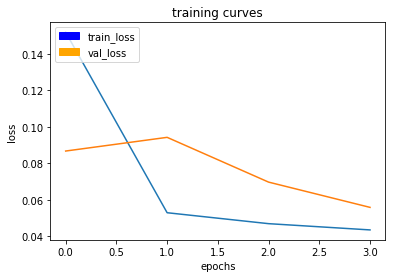

129/129 [==============================] - 49s - loss: 0.0434 - val_loss: 0.0558
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0396

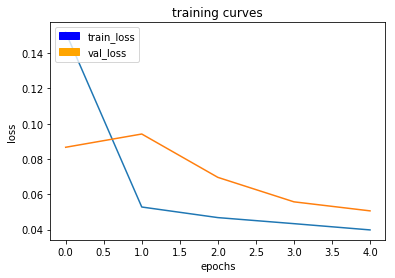

129/129 [==============================] - 48s - loss: 0.0398 - val_loss: 0.0506
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0376

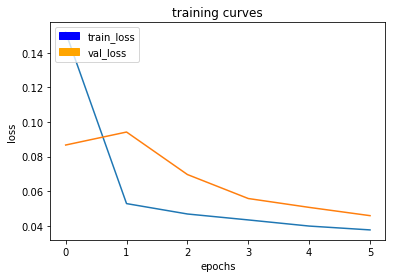

129/129 [==============================] - 49s - loss: 0.0376 - val_loss: 0.0459
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0353

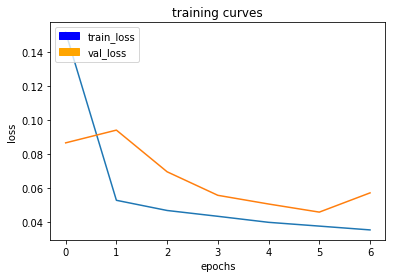

129/129 [==============================] - 48s - loss: 0.0353 - val_loss: 0.0572
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0341

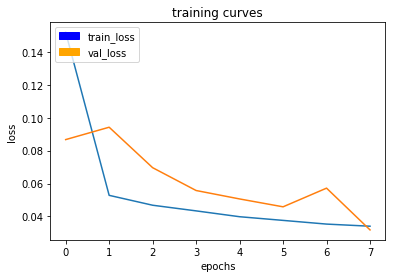

129/129 [==============================] - 49s - loss: 0.0340 - val_loss: 0.0318
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0317

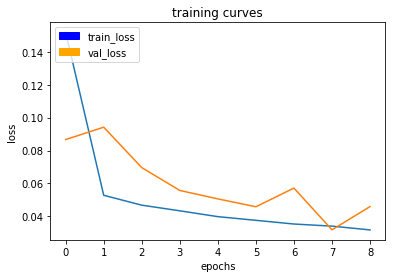

129/129 [==============================] - 49s - loss: 0.0317 - val_loss: 0.0460
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0346

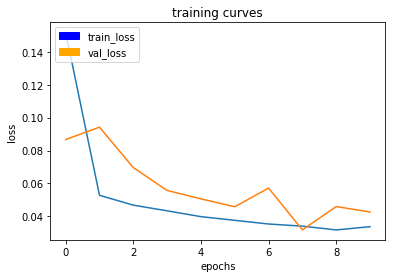

129/129 [==============================] - 49s - loss: 0.0346 - val_loss: 0.0427
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0295

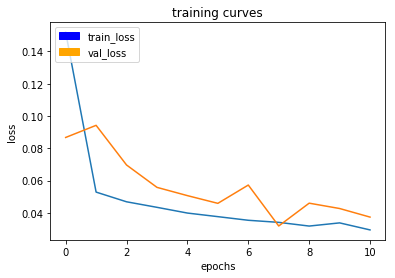

129/129 [==============================] - 49s - loss: 0.0295 - val_loss: 0.0373
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0305

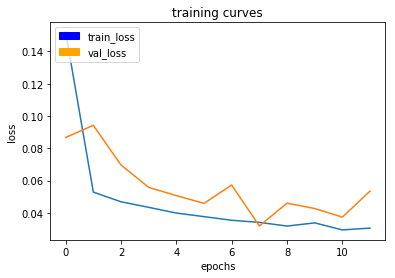

129/129 [==============================] - 49s - loss: 0.0305 - val_loss: 0.0534
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0293

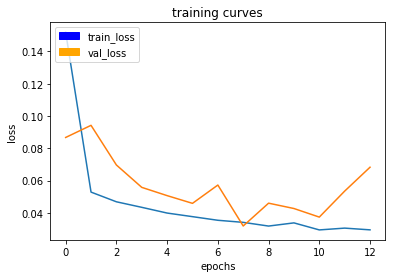

129/129 [==============================] - 49s - loss: 0.0294 - val_loss: 0.0683
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0269

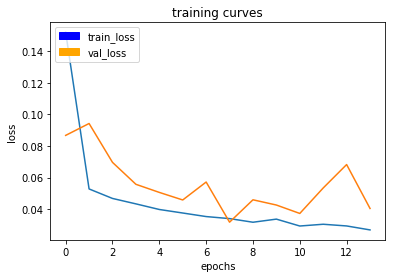

129/129 [==============================] - 49s - loss: 0.0269 - val_loss: 0.0405
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0272

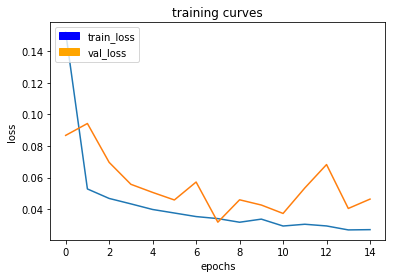

129/129 [==============================] - 48s - loss: 0.0271 - val_loss: 0.0464
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0291

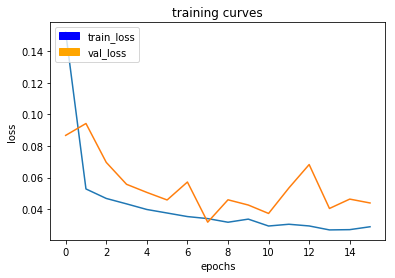

129/129 [==============================] - 49s - loss: 0.0290 - val_loss: 0.0440
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0246

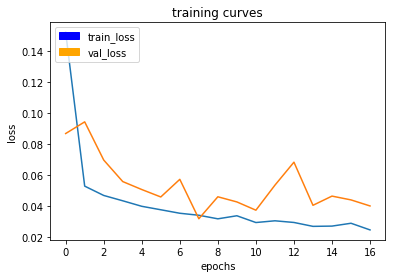

129/129 [==============================] - 49s - loss: 0.0246 - val_loss: 0.0401
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0244

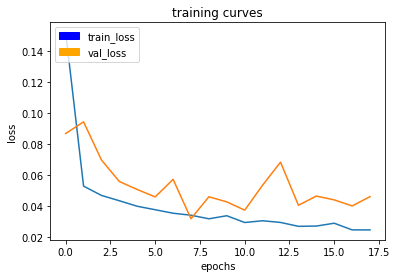

129/129 [==============================] - 49s - loss: 0.0246 - val_loss: 0.0461
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0243

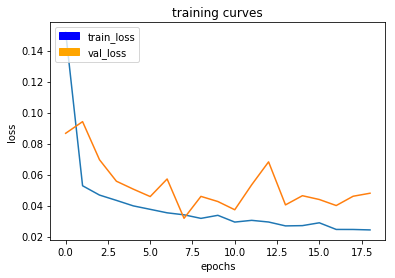

129/129 [==============================] - 49s - loss: 0.0244 - val_loss: 0.0480
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0261

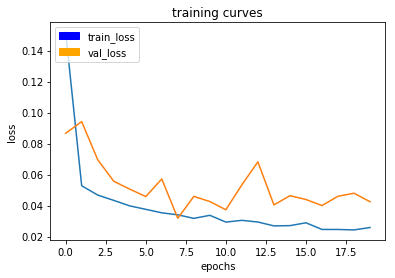

129/129 [==============================] - 49s - loss: 0.0261 - val_loss: 0.0425
TESTING WITH LRATE:  0.0078125
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.1820

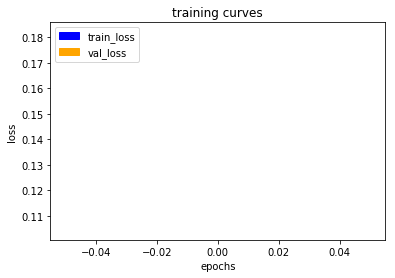

129/129 [==============================] - 49s - loss: 0.1811 - val_loss: 0.1045
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0483

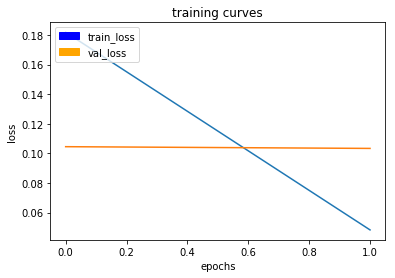

129/129 [==============================] - 49s - loss: 0.0482 - val_loss: 0.1034
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0425

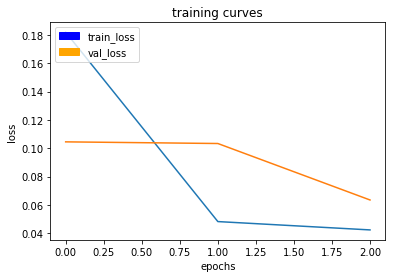

129/129 [==============================] - 48s - loss: 0.0424 - val_loss: 0.0635
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0390

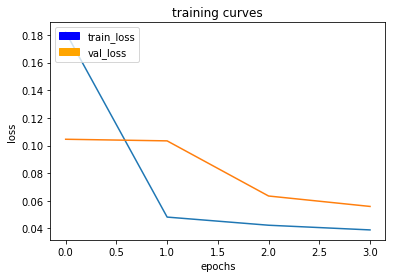

129/129 [==============================] - 48s - loss: 0.0390 - val_loss: 0.0559
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0367

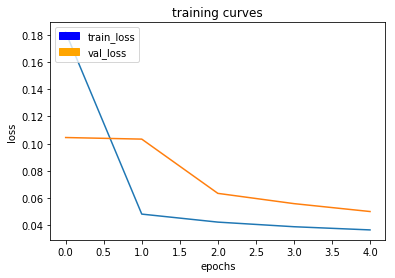

129/129 [==============================] - 49s - loss: 0.0367 - val_loss: 0.0501
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0341

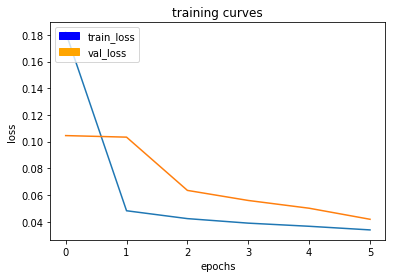

129/129 [==============================] - 48s - loss: 0.0340 - val_loss: 0.0419
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0326

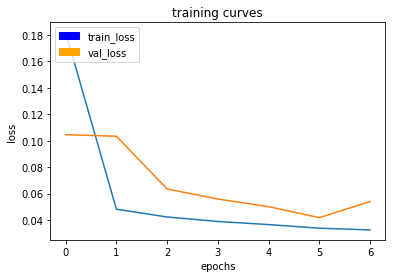

129/129 [==============================] - 48s - loss: 0.0326 - val_loss: 0.0540
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0295

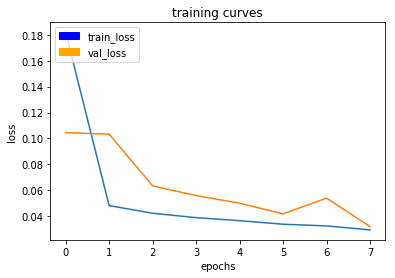

129/129 [==============================] - 48s - loss: 0.0294 - val_loss: 0.0321
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0304

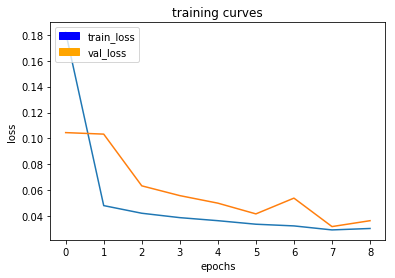

129/129 [==============================] - 49s - loss: 0.0306 - val_loss: 0.0366
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0278

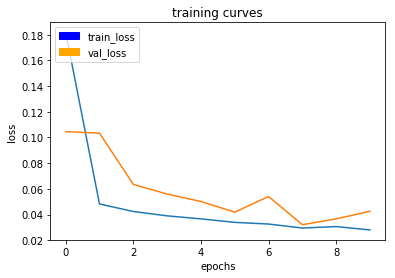

129/129 [==============================] - 49s - loss: 0.0280 - val_loss: 0.0425
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0278

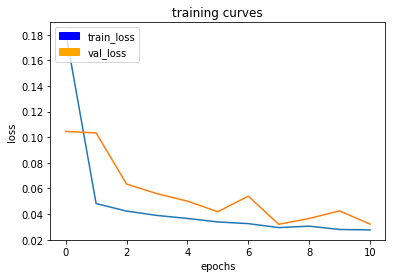

129/129 [==============================] - 48s - loss: 0.0278 - val_loss: 0.0322
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0284

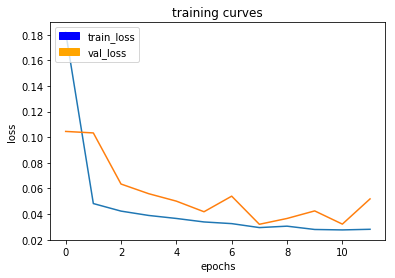

129/129 [==============================] - 48s - loss: 0.0284 - val_loss: 0.0519
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0322

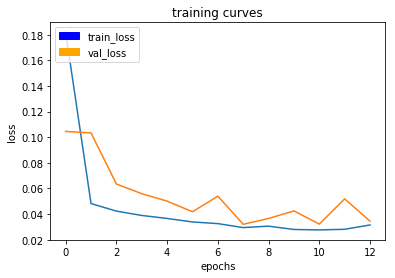

129/129 [==============================] - 48s - loss: 0.0324 - val_loss: 0.0345
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0238

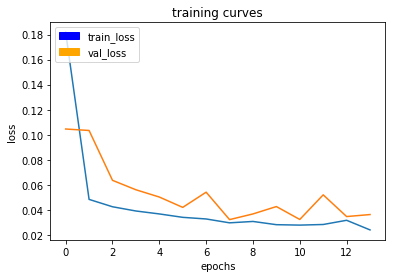

129/129 [==============================] - 48s - loss: 0.0238 - val_loss: 0.0361
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0266

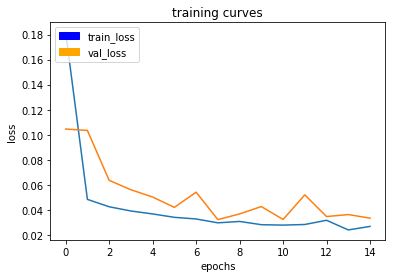

129/129 [==============================] - 48s - loss: 0.0266 - val_loss: 0.0332
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0228

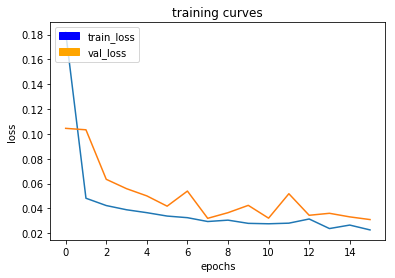

129/129 [==============================] - 48s - loss: 0.0228 - val_loss: 0.0311
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0235

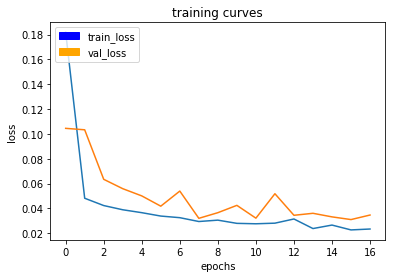

129/129 [==============================] - 48s - loss: 0.0235 - val_loss: 0.0347
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0241

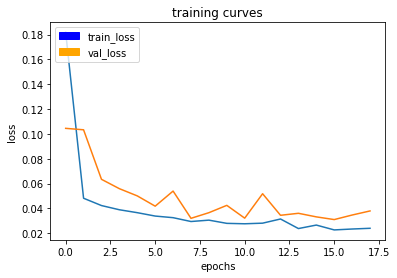

129/129 [==============================] - 48s - loss: 0.0241 - val_loss: 0.0380
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0238

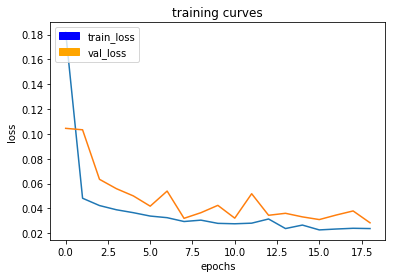

129/129 [==============================] - 48s - loss: 0.0238 - val_loss: 0.0285
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0210

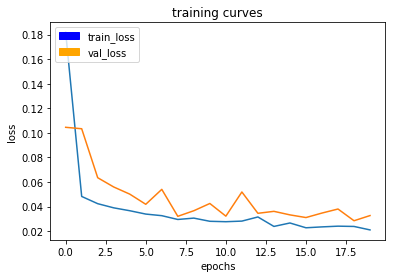

129/129 [==============================] - 49s - loss: 0.0209 - val_loss: 0.0327
TESTING WITH LRATE:  0.00390625
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.2146

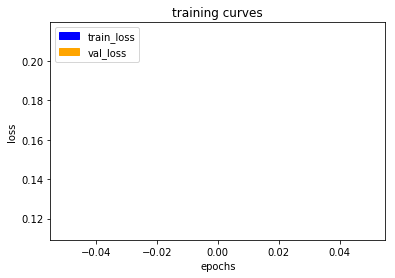

129/129 [==============================] - 50s - loss: 0.2133 - val_loss: 0.1142
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0465

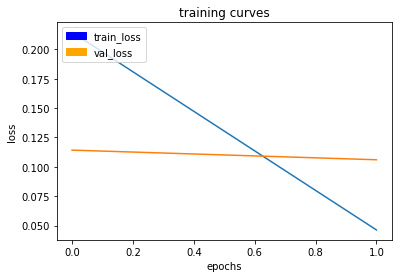

129/129 [==============================] - 49s - loss: 0.0464 - val_loss: 0.1060
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0408

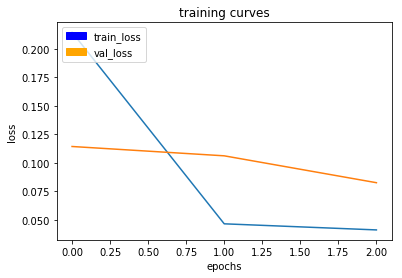

129/129 [==============================] - 49s - loss: 0.0409 - val_loss: 0.0824
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0382

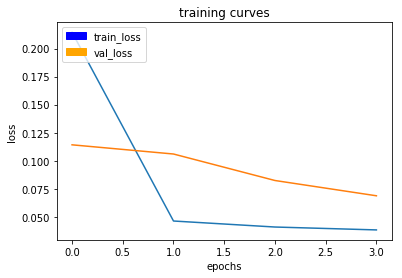

129/129 [==============================] - 49s - loss: 0.0384 - val_loss: 0.0688
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0360

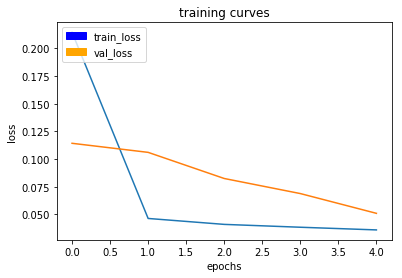

129/129 [==============================] - 49s - loss: 0.0360 - val_loss: 0.0510
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0336

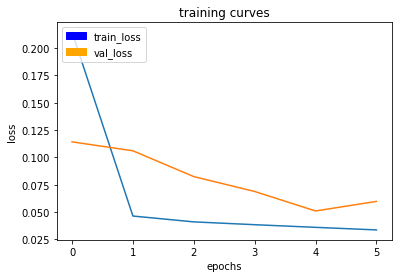

129/129 [==============================] - 49s - loss: 0.0336 - val_loss: 0.0597
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0332

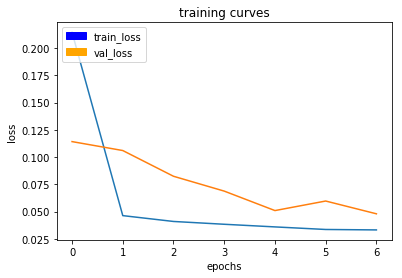

129/129 [==============================] - 49s - loss: 0.0332 - val_loss: 0.0480
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0338

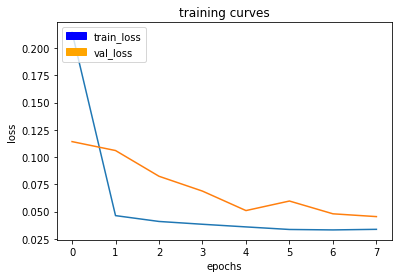

129/129 [==============================] - 49s - loss: 0.0337 - val_loss: 0.0454
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0289

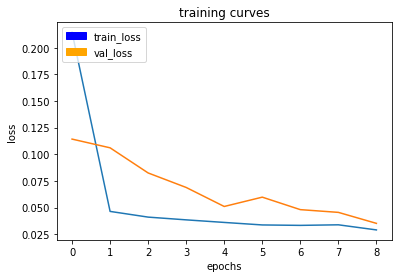

129/129 [==============================] - 49s - loss: 0.0289 - val_loss: 0.0351
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0295

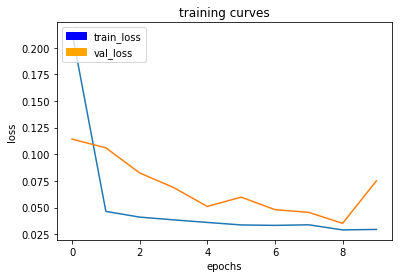

129/129 [==============================] - 49s - loss: 0.0295 - val_loss: 0.0750
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0315

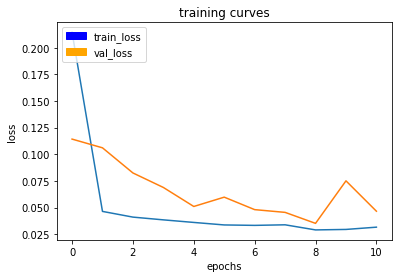

129/129 [==============================] - 49s - loss: 0.0318 - val_loss: 0.0465
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0284

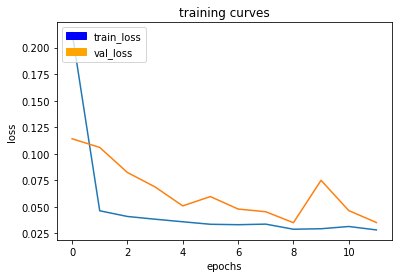

129/129 [==============================] - 49s - loss: 0.0284 - val_loss: 0.0353
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0253

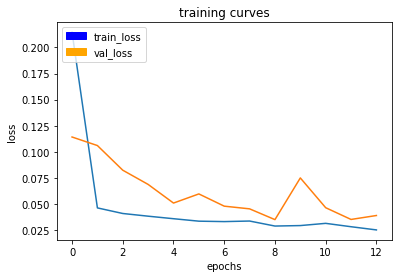

129/129 [==============================] - 49s - loss: 0.0253 - val_loss: 0.0391
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0271

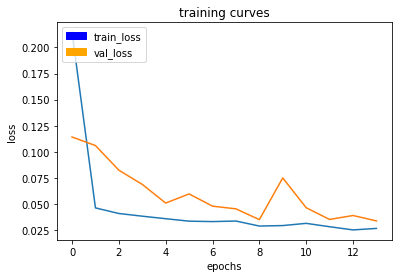

129/129 [==============================] - 49s - loss: 0.0270 - val_loss: 0.0339
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0264

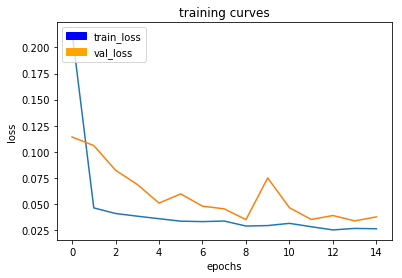

129/129 [==============================] - 49s - loss: 0.0264 - val_loss: 0.0378
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0252

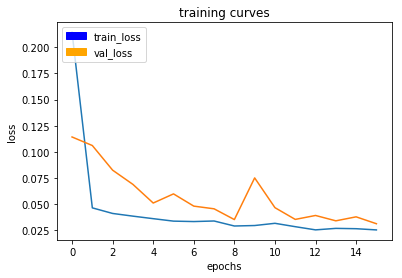

129/129 [==============================] - 49s - loss: 0.0252 - val_loss: 0.0312
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0242

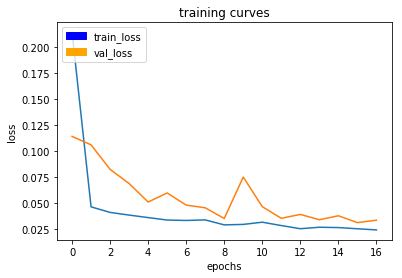

129/129 [==============================] - 49s - loss: 0.0242 - val_loss: 0.0335
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0234

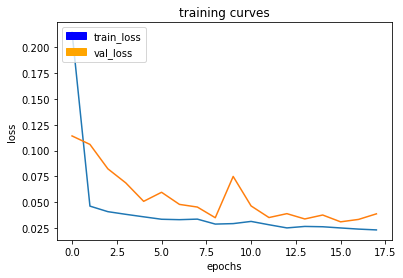

129/129 [==============================] - 49s - loss: 0.0233 - val_loss: 0.0389
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0209

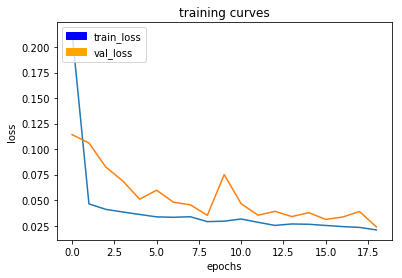

129/129 [==============================] - 49s - loss: 0.0208 - val_loss: 0.0238
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0235

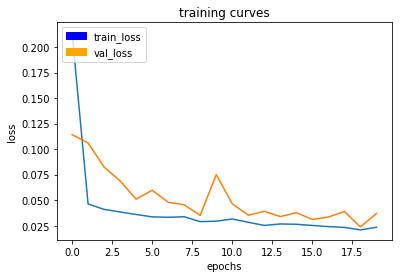

129/129 [==============================] - 49s - loss: 0.0235 - val_loss: 0.0369
TESTING WITH LRATE:  0.001953125
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.3191

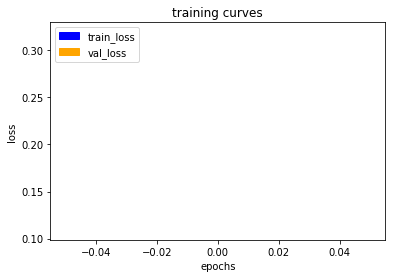

129/129 [==============================] - 50s - loss: 0.3171 - val_loss: 0.1093
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0478

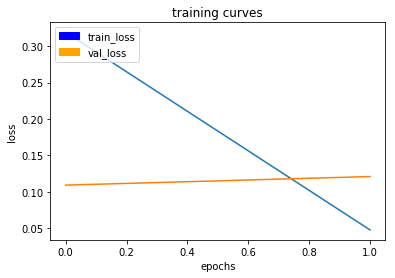

129/129 [==============================] - 49s - loss: 0.0478 - val_loss: 0.1210
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0415

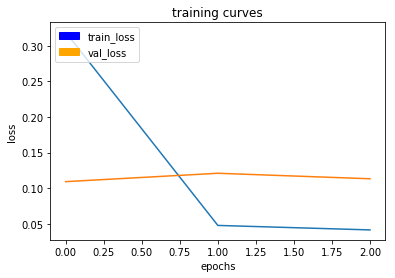

129/129 [==============================] - 49s - loss: 0.0415 - val_loss: 0.1133
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0376

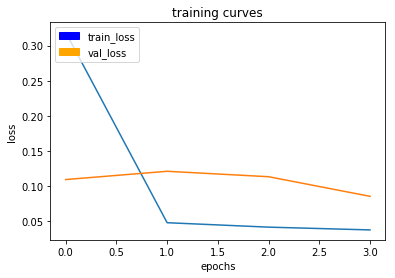

129/129 [==============================] - 49s - loss: 0.0375 - val_loss: 0.0854
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0346

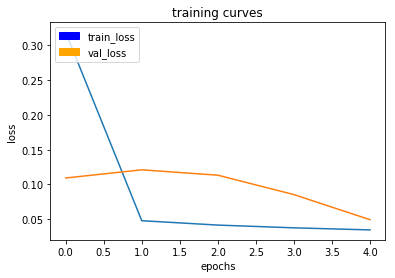

129/129 [==============================] - 49s - loss: 0.0346 - val_loss: 0.0493
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0320

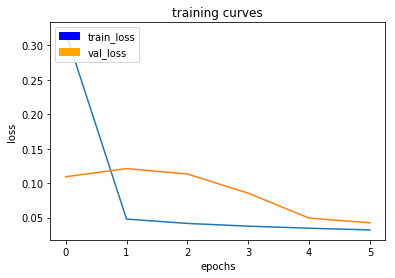

129/129 [==============================] - 49s - loss: 0.0320 - val_loss: 0.0425
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0303

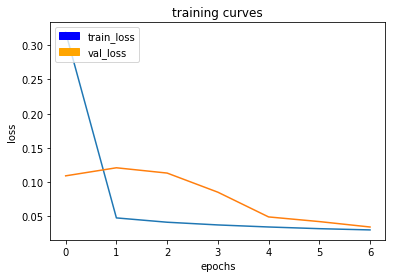

129/129 [==============================] - 49s - loss: 0.0302 - val_loss: 0.0345
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0295

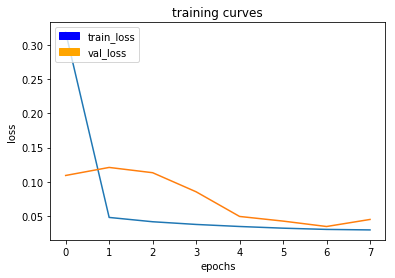

129/129 [==============================] - 49s - loss: 0.0295 - val_loss: 0.0449
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0289

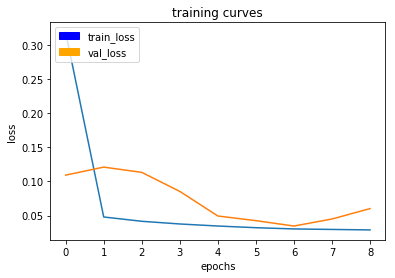

129/129 [==============================] - 49s - loss: 0.0288 - val_loss: 0.0601
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0279

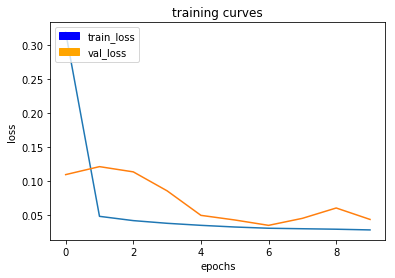

129/129 [==============================] - 49s - loss: 0.0278 - val_loss: 0.0433
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0276

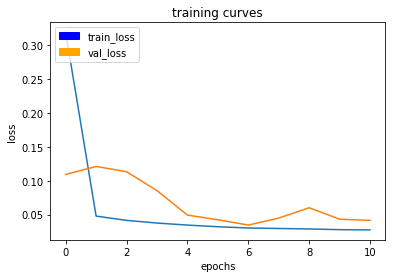

129/129 [==============================] - 49s - loss: 0.0275 - val_loss: 0.0415
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0264

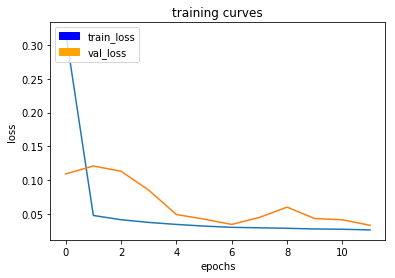

129/129 [==============================] - 49s - loss: 0.0264 - val_loss: 0.0333
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0241

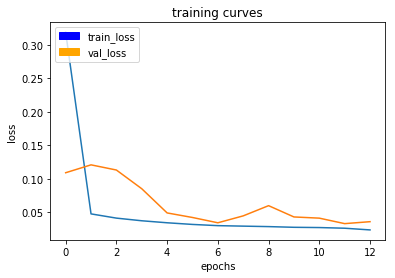

129/129 [==============================] - 49s - loss: 0.0241 - val_loss: 0.0362
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0264

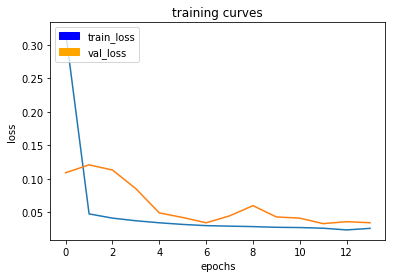

129/129 [==============================] - 49s - loss: 0.0264 - val_loss: 0.0346
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0238

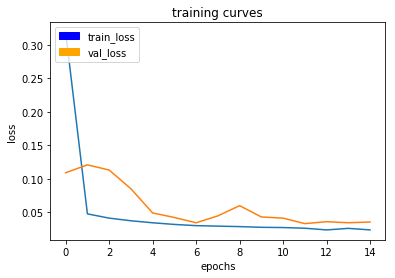

129/129 [==============================] - 49s - loss: 0.0239 - val_loss: 0.0357
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0222

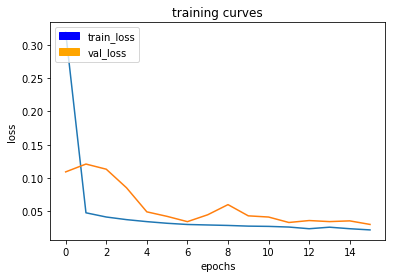

129/129 [==============================] - 49s - loss: 0.0221 - val_loss: 0.0304
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0219

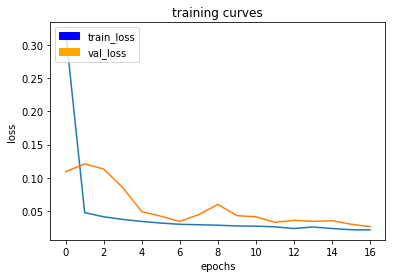

129/129 [==============================] - 49s - loss: 0.0219 - val_loss: 0.0268
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0227

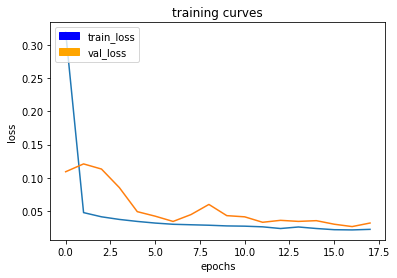

129/129 [==============================] - 49s - loss: 0.0226 - val_loss: 0.0322
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0212

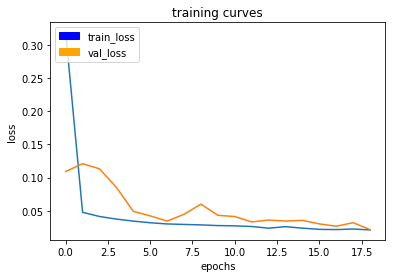

129/129 [==============================] - 49s - loss: 0.0212 - val_loss: 0.0218
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0211

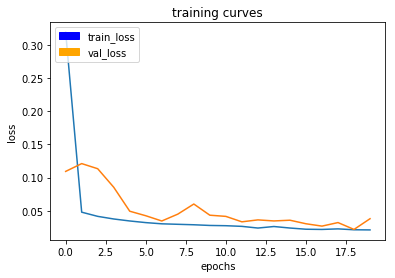

129/129 [==============================] - 49s - loss: 0.0211 - val_loss: 0.0380
TESTING WITH LRATE:  0.0009765625
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.5274

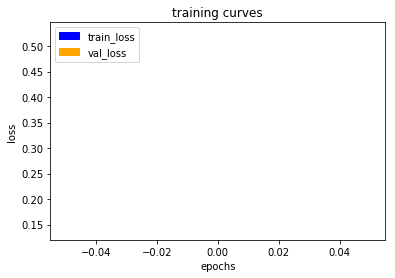

129/129 [==============================] - 51s - loss: 0.5239 - val_loss: 0.1396
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0585

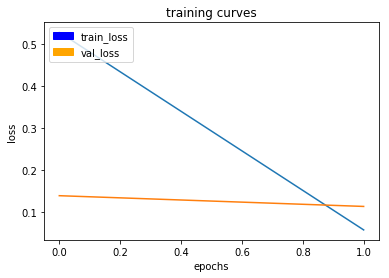

129/129 [==============================] - 51s - loss: 0.0585 - val_loss: 0.1141
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0440

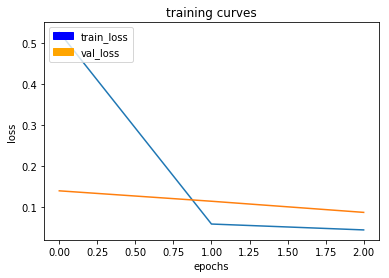

129/129 [==============================] - 50s - loss: 0.0440 - val_loss: 0.0869
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0413

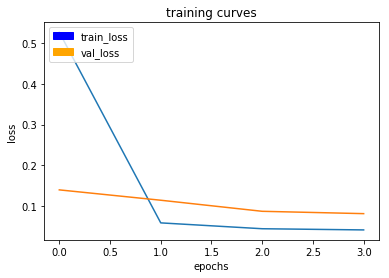

129/129 [==============================] - 50s - loss: 0.0413 - val_loss: 0.0812
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0376

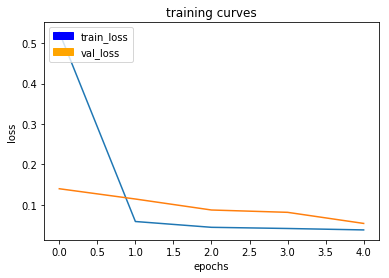

129/129 [==============================] - 50s - loss: 0.0376 - val_loss: 0.0537
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0359

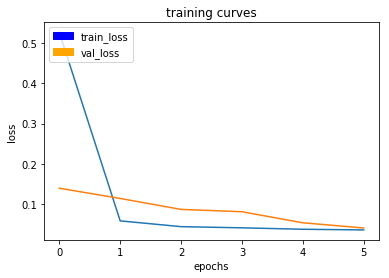

129/129 [==============================] - 50s - loss: 0.0359 - val_loss: 0.0408
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0322

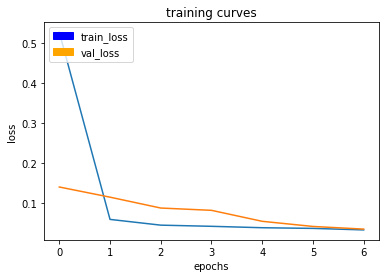

129/129 [==============================] - 50s - loss: 0.0321 - val_loss: 0.0342
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0325

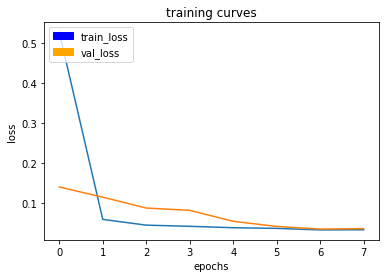

129/129 [==============================] - 51s - loss: 0.0325 - val_loss: 0.0355
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0305

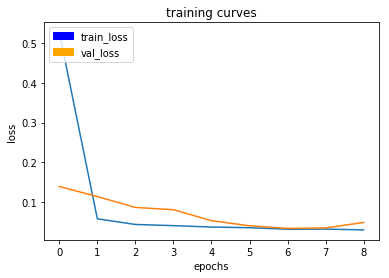

129/129 [==============================] - 50s - loss: 0.0305 - val_loss: 0.0491
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0291

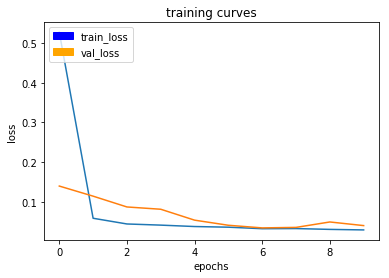

129/129 [==============================] - 50s - loss: 0.0291 - val_loss: 0.0400
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0298

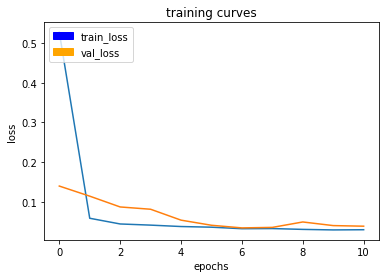

129/129 [==============================] - 50s - loss: 0.0298 - val_loss: 0.0385
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0283

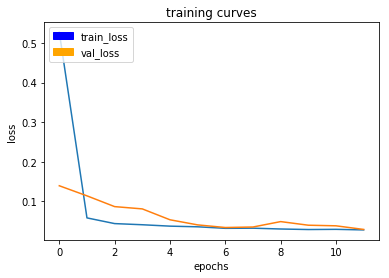

129/129 [==============================] - 50s - loss: 0.0283 - val_loss: 0.0293
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0314

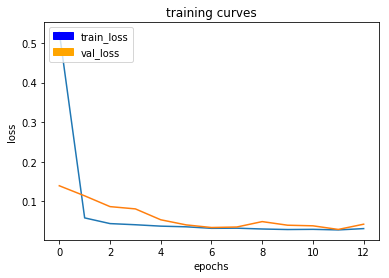

129/129 [==============================] - 51s - loss: 0.0314 - val_loss: 0.0426
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0271

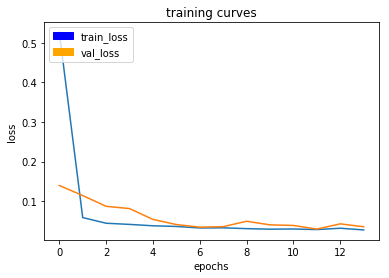

129/129 [==============================] - 50s - loss: 0.0273 - val_loss: 0.0352
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0249

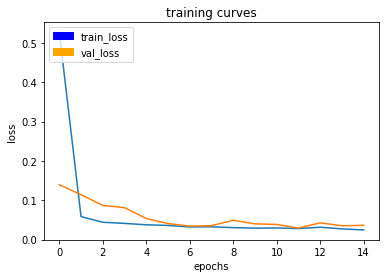

129/129 [==============================] - 50s - loss: 0.0248 - val_loss: 0.0364
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0267

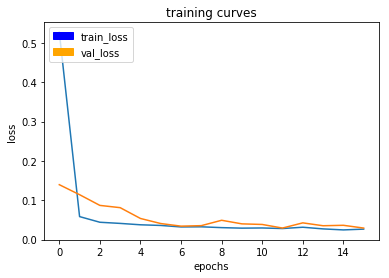

129/129 [==============================] - 50s - loss: 0.0267 - val_loss: 0.0293
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0260

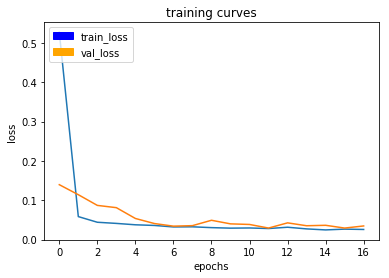

129/129 [==============================] - 50s - loss: 0.0259 - val_loss: 0.0347
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0239

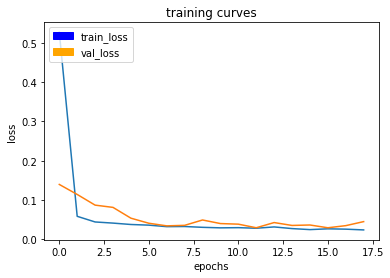

129/129 [==============================] - 51s - loss: 0.0239 - val_loss: 0.0450
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0241

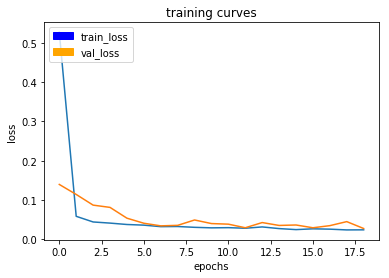

129/129 [==============================] - 50s - loss: 0.0241 - val_loss: 0.0274
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0229

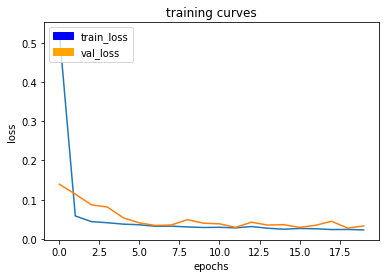

129/129 [==============================] - 50s - loss: 0.0229 - val_loss: 0.0329
TESTING WITH LRATE:  0.00048828125
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.7362

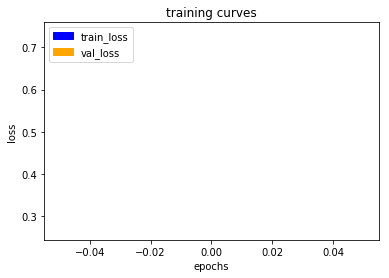

129/129 [==============================] - 50s - loss: 0.7323 - val_loss: 0.2673
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.1079

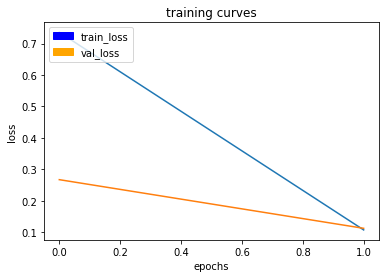

129/129 [==============================] - 50s - loss: 0.1076 - val_loss: 0.1127
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0583

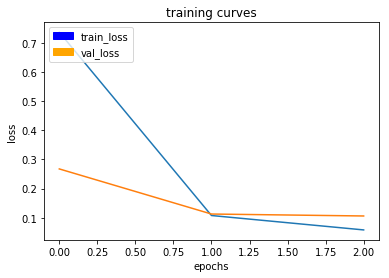

129/129 [==============================] - 49s - loss: 0.0583 - val_loss: 0.1060
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0483

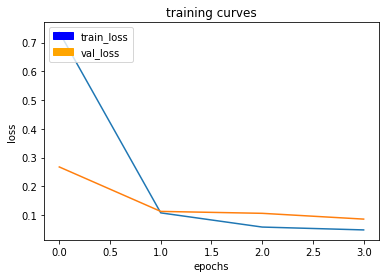

129/129 [==============================] - 49s - loss: 0.0483 - val_loss: 0.0859
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0434

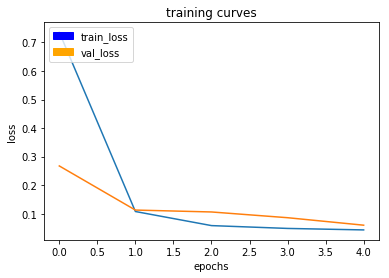

129/129 [==============================] - 50s - loss: 0.0434 - val_loss: 0.0597
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0398

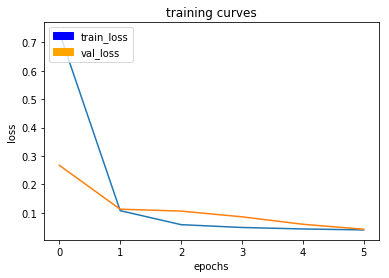

129/129 [==============================] - 49s - loss: 0.0397 - val_loss: 0.0421
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0373

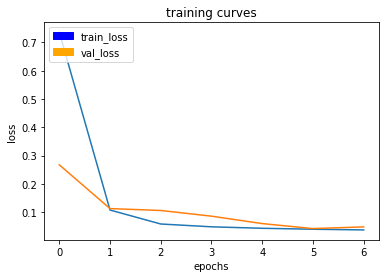

129/129 [==============================] - 50s - loss: 0.0373 - val_loss: 0.0480
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0359

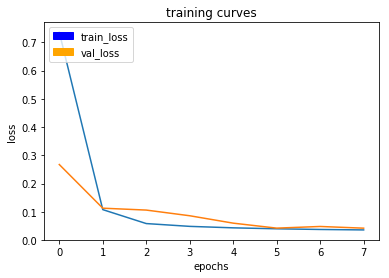

129/129 [==============================] - 49s - loss: 0.0358 - val_loss: 0.0420
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0339

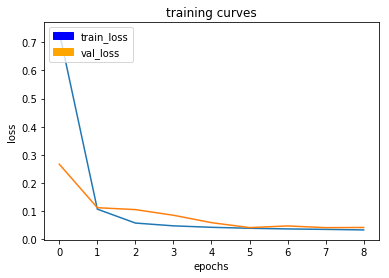

129/129 [==============================] - 49s - loss: 0.0339 - val_loss: 0.0425
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0327

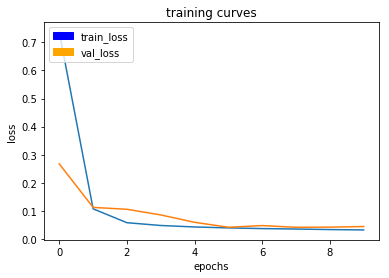

129/129 [==============================] - 49s - loss: 0.0326 - val_loss: 0.0445
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0304

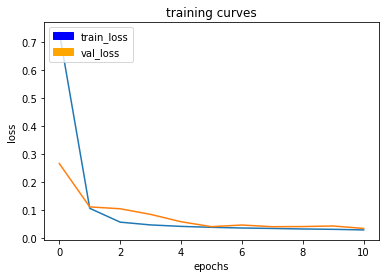

129/129 [==============================] - 49s - loss: 0.0305 - val_loss: 0.0358
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0298

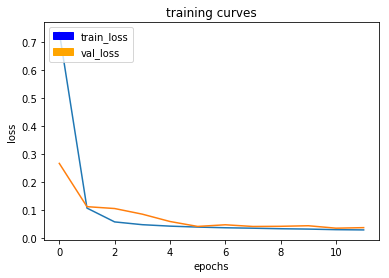

129/129 [==============================] - 49s - loss: 0.0297 - val_loss: 0.0378
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0303

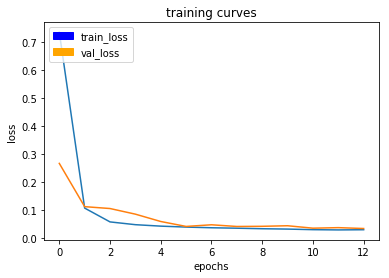

129/129 [==============================] - 49s - loss: 0.0303 - val_loss: 0.0347
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0289

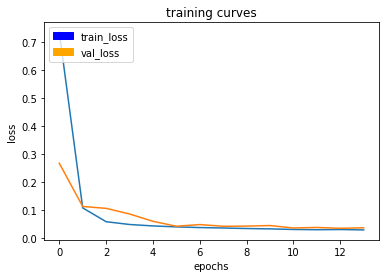

129/129 [==============================] - 50s - loss: 0.0289 - val_loss: 0.0365
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0283

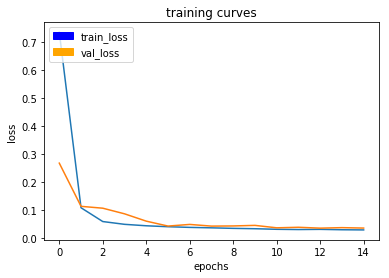

129/129 [==============================] - 49s - loss: 0.0283 - val_loss: 0.0349
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0271

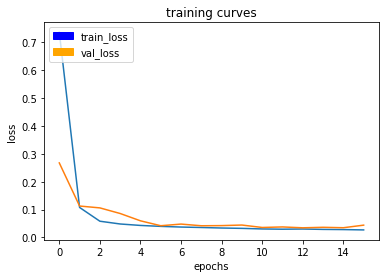

129/129 [==============================] - 49s - loss: 0.0271 - val_loss: 0.0442
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0266

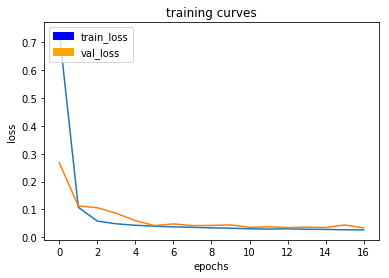

129/129 [==============================] - 49s - loss: 0.0265 - val_loss: 0.0336
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0256

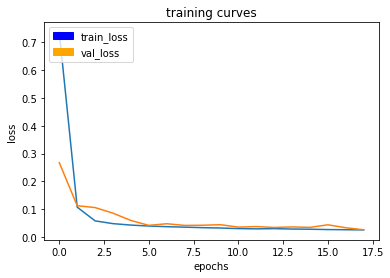

129/129 [==============================] - 49s - loss: 0.0257 - val_loss: 0.0262
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0257

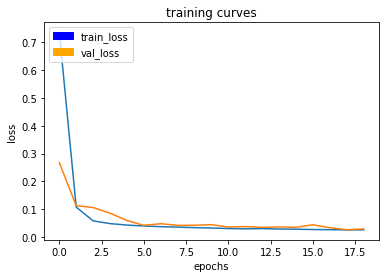

129/129 [==============================] - 50s - loss: 0.0257 - val_loss: 0.0293
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0248

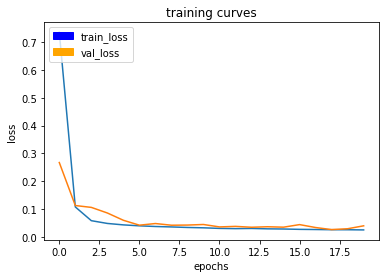

129/129 [==============================] - 49s - loss: 0.0250 - val_loss: 0.0398


In [3]:
# set up the experiment
BATCH_SIZE = 32
EPOCHS = 20

numTests = 10
baseLearningRate = 0.25
modelType = MODEL_FCN_SIMPLE

_lrateExperiments = []

for i in range( numTests ) :
    _lrate = baseLearningRate / ( 2 ** i )
    print( 'TESTING WITH LRATE: ', _lrate )
    # create and run experiment
    _experiment = Experiment( _lrate, BATCH_SIZE, EPOCHS, modelType )
    _experiment.run()
    # save it for later use
    _lrateExperiments.append( _experiment )


In [4]:
# plot the results
for i in range( len( _lrateExperiments ) ) :
    print( _lrateExperiments[i].model().getTrainHistory() )

{'loss': [0.5265036646906531, 0.29724685073822965, 0.2974762092256988, 0.2972424271470833, 0.29594556757351864, 0.29892190760826304, 0.29427284828247924, 0.30026638180664555, 0.2977708141072025, 0.29547493130324903, 0.29781228939362575, 0.2938098907906941, 0.29953262501808164, 0.2950399310436444, 0.3010121178673546, 0.2958706081655148, 0.29168558149083007, 0.30389583353648447, 0.2949251910736573, 0.2998151002998438], 'val_loss': [0.310466314489777, 0.3139217435508161, 0.30755594775483414, 0.31119270904644114, 0.32554935482708186, 0.3180232636026434, 0.2963202426562438, 0.3117021209484822, 0.30683593814437454, 0.3149039080819568, 0.3117058679864213, 0.3184024143863369, 0.3146491940762546, 0.3171692397948858, 0.308254697435611, 0.31826149410492666, 0.2993241842534091, 0.2992337853521914, 0.33061125632878896, 0.3039718487778226]}
{'loss': [0.4475944456897041, 0.297756069940775, 0.2966092795562558, 0.2961016251826234, 0.2991249675567803, 0.2972213821051673, 0.2969332250568104, 0.2971948095

### Batch size tuning

The same way as before, we will tune the batchsize by choosing from some candidate batches and check the behavior

TESTING BATCH SIZE:  8
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
515/516 [============================>.] - ETA: 0s - loss: 0.1717

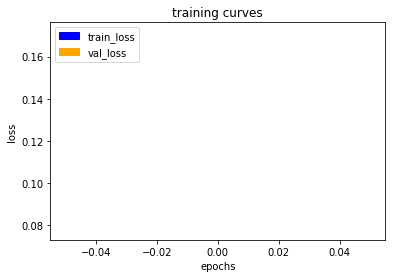

516/516 [==============================] - 52s - loss: 0.1714 - val_loss: 0.0776
Epoch 2/20
515/516 [============================>.] - ETA: 0s - loss: 0.0446

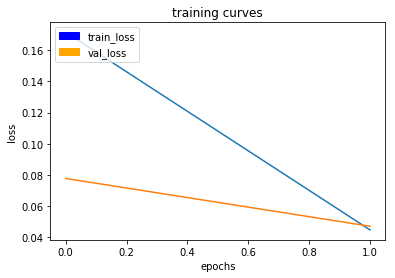

516/516 [==============================] - 51s - loss: 0.0446 - val_loss: 0.0470
Epoch 3/20
515/516 [============================>.] - ETA: 0s - loss: 0.0383

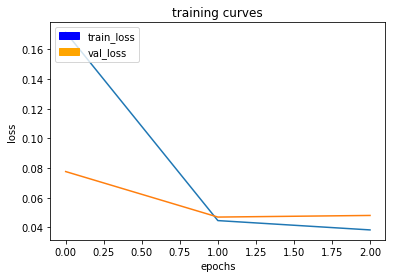

516/516 [==============================] - 51s - loss: 0.0383 - val_loss: 0.0481
Epoch 4/20
515/516 [============================>.] - ETA: 0s - loss: 0.0353

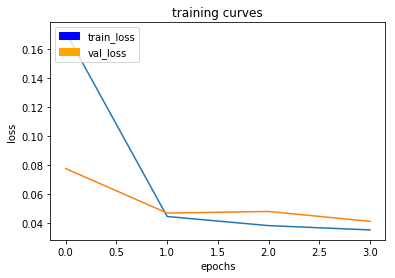

516/516 [==============================] - 51s - loss: 0.0353 - val_loss: 0.0413
Epoch 5/20
515/516 [============================>.] - ETA: 0s - loss: 0.0329

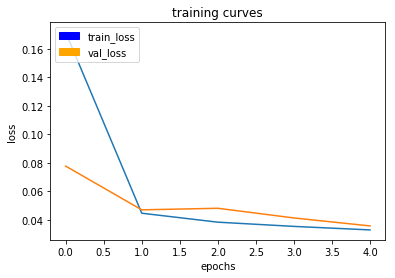

516/516 [==============================] - 51s - loss: 0.0329 - val_loss: 0.0357
Epoch 6/20
515/516 [============================>.] - ETA: 0s - loss: 0.0305

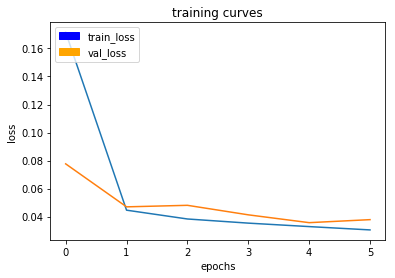

516/516 [==============================] - 51s - loss: 0.0305 - val_loss: 0.0378
Epoch 7/20
515/516 [============================>.] - ETA: 0s - loss: 0.0304

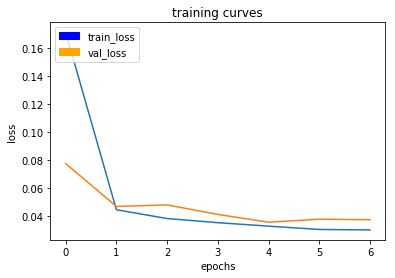

516/516 [==============================] - 51s - loss: 0.0304 - val_loss: 0.0375
Epoch 8/20
515/516 [============================>.] - ETA: 0s - loss: 0.0280

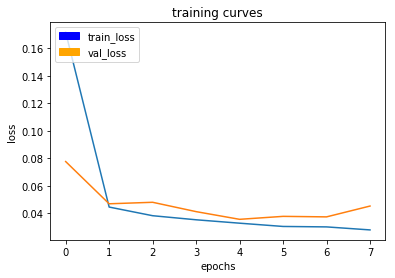

516/516 [==============================] - 51s - loss: 0.0280 - val_loss: 0.0453
Epoch 9/20
515/516 [============================>.] - ETA: 0s - loss: 0.0281

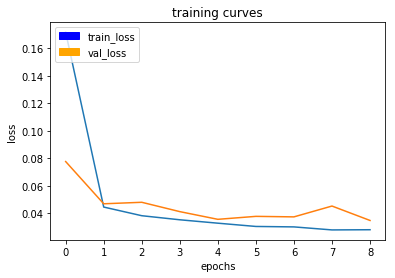

516/516 [==============================] - 51s - loss: 0.0281 - val_loss: 0.0349
Epoch 10/20
515/516 [============================>.] - ETA: 0s - loss: 0.0266

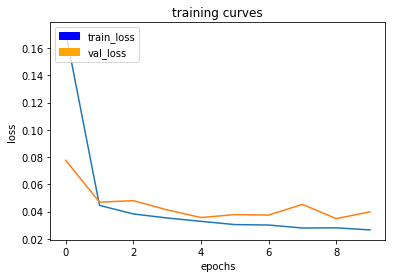

516/516 [==============================] - 51s - loss: 0.0266 - val_loss: 0.0399
Epoch 11/20
515/516 [============================>.] - ETA: 0s - loss: 0.0245

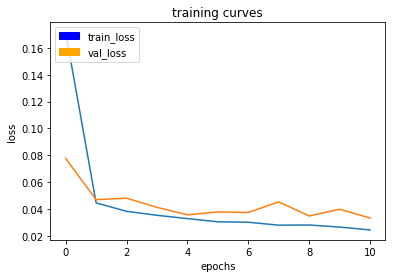

516/516 [==============================] - 51s - loss: 0.0245 - val_loss: 0.0334
Epoch 12/20
515/516 [============================>.] - ETA: 0s - loss: 0.0256

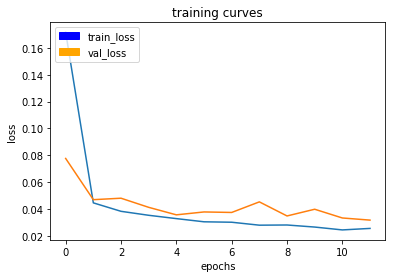

516/516 [==============================] - 51s - loss: 0.0256 - val_loss: 0.0318
Epoch 13/20
515/516 [============================>.] - ETA: 0s - loss: 0.0234

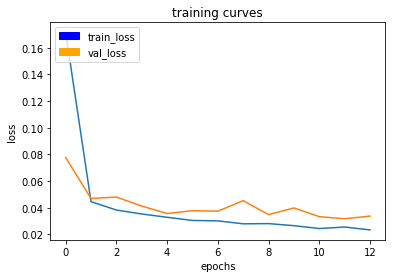

516/516 [==============================] - 51s - loss: 0.0234 - val_loss: 0.0338
Epoch 14/20
515/516 [============================>.] - ETA: 0s - loss: 0.0228

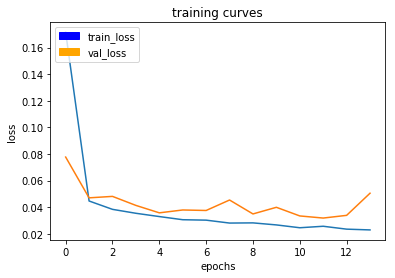

516/516 [==============================] - 51s - loss: 0.0228 - val_loss: 0.0505
Epoch 15/20
515/516 [============================>.] - ETA: 0s - loss: 0.0230

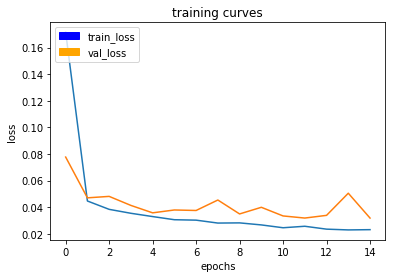

516/516 [==============================] - 51s - loss: 0.0230 - val_loss: 0.0318
Epoch 16/20
515/516 [============================>.] - ETA: 0s - loss: 0.0214

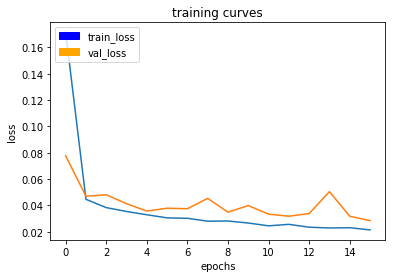

516/516 [==============================] - 51s - loss: 0.0213 - val_loss: 0.0284
Epoch 17/20
515/516 [============================>.] - ETA: 0s - loss: 0.0216

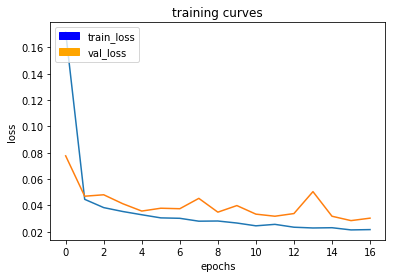

516/516 [==============================] - 51s - loss: 0.0216 - val_loss: 0.0303
Epoch 18/20
515/516 [============================>.] - ETA: 0s - loss: 0.0201

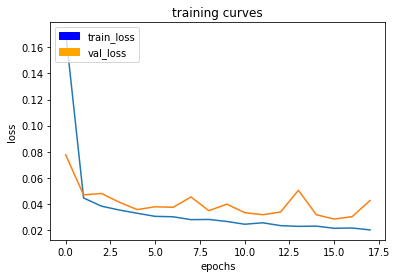

516/516 [==============================] - 51s - loss: 0.0201 - val_loss: 0.0426
Epoch 19/20
515/516 [============================>.] - ETA: 0s - loss: 0.0207

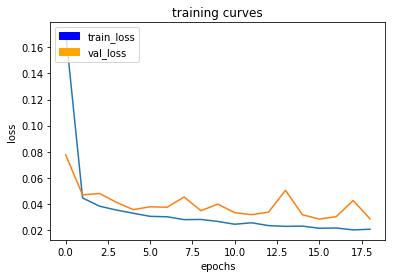

516/516 [==============================] - 51s - loss: 0.0207 - val_loss: 0.0286
Epoch 20/20
515/516 [============================>.] - ETA: 0s - loss: 0.0175

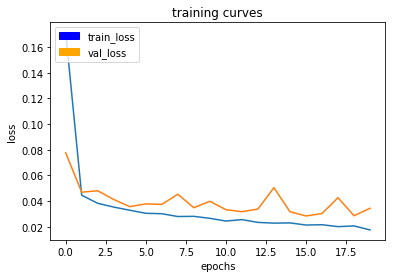

516/516 [==============================] - 51s - loss: 0.0176 - val_loss: 0.0344
TESTING BATCH SIZE:  16
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
257/258 [============================>.] - ETA: 0s - loss: 0.2755

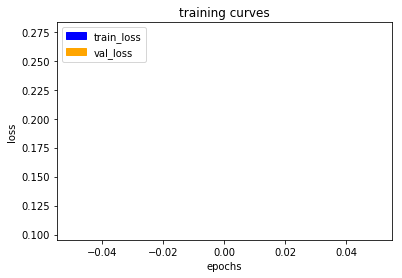

258/258 [==============================] - 50s - loss: 0.2746 - val_loss: 0.1040
Epoch 2/20
257/258 [============================>.] - ETA: 0s - loss: 0.0466

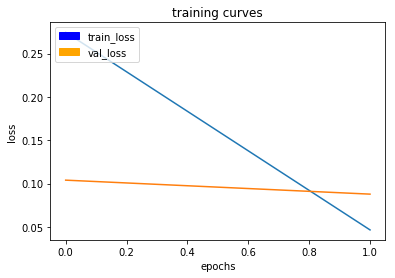

258/258 [==============================] - 49s - loss: 0.0466 - val_loss: 0.0879
Epoch 3/20
257/258 [============================>.] - ETA: 0s - loss: 0.0402

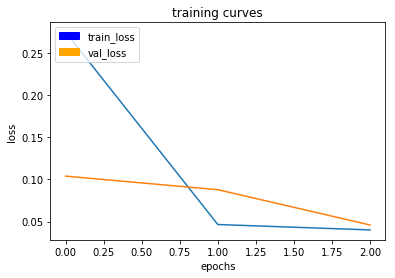

258/258 [==============================] - 49s - loss: 0.0402 - val_loss: 0.0461
Epoch 4/20
257/258 [============================>.] - ETA: 0s - loss: 0.0365

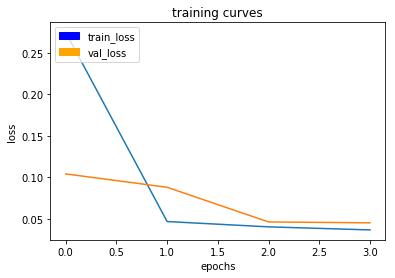

258/258 [==============================] - 49s - loss: 0.0365 - val_loss: 0.0451
Epoch 5/20
257/258 [============================>.] - ETA: 0s - loss: 0.0337

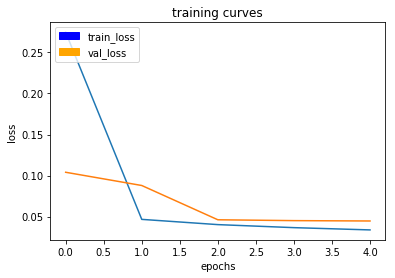

258/258 [==============================] - 49s - loss: 0.0337 - val_loss: 0.0446
Epoch 6/20
257/258 [============================>.] - ETA: 0s - loss: 0.0326

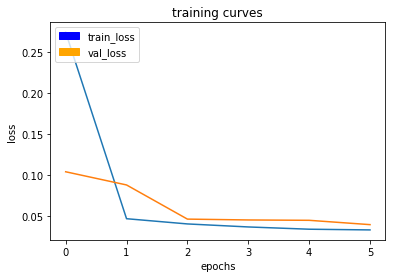

258/258 [==============================] - 49s - loss: 0.0329 - val_loss: 0.0393
Epoch 7/20
257/258 [============================>.] - ETA: 0s - loss: 0.0303

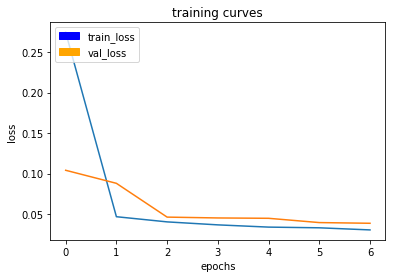

258/258 [==============================] - 49s - loss: 0.0302 - val_loss: 0.0385
Epoch 8/20
257/258 [============================>.] - ETA: 0s - loss: 0.0291

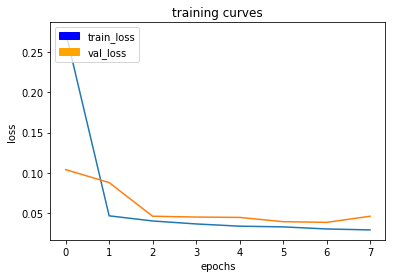

258/258 [==============================] - 49s - loss: 0.0290 - val_loss: 0.0461
Epoch 9/20
257/258 [============================>.] - ETA: 0s - loss: 0.0285

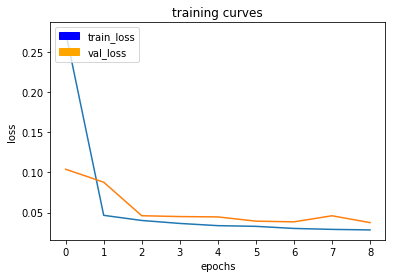

258/258 [==============================] - 49s - loss: 0.0285 - val_loss: 0.0375
Epoch 10/20
257/258 [============================>.] - ETA: 0s - loss: 0.0262

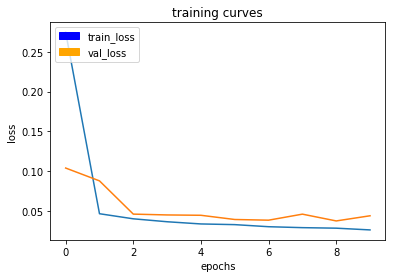

258/258 [==============================] - 49s - loss: 0.0262 - val_loss: 0.0440
Epoch 11/20
257/258 [============================>.] - ETA: 0s - loss: 0.0267

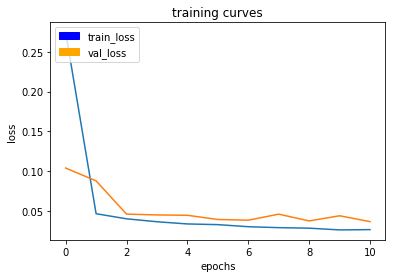

258/258 [==============================] - 49s - loss: 0.0266 - val_loss: 0.0367
Epoch 12/20
257/258 [============================>.] - ETA: 0s - loss: 0.0237

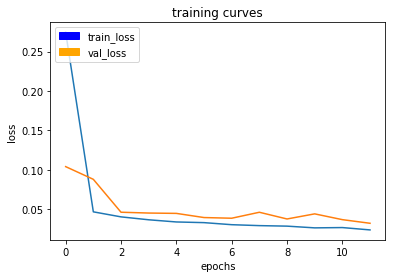

258/258 [==============================] - 49s - loss: 0.0236 - val_loss: 0.0321
Epoch 13/20
257/258 [============================>.] - ETA: 0s - loss: 0.0256

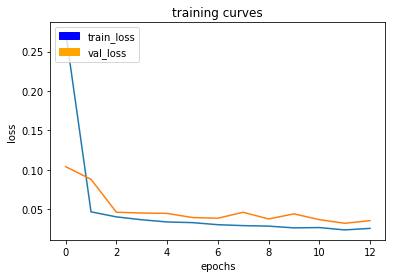

258/258 [==============================] - 49s - loss: 0.0256 - val_loss: 0.0354
Epoch 14/20
257/258 [============================>.] - ETA: 0s - loss: 0.0238

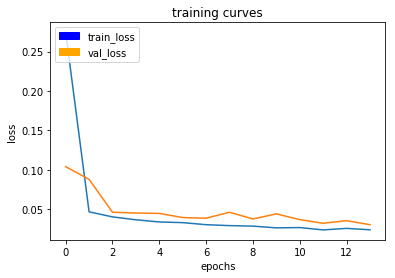

258/258 [==============================] - 49s - loss: 0.0238 - val_loss: 0.0303
Epoch 15/20
257/258 [============================>.] - ETA: 0s - loss: 0.0227

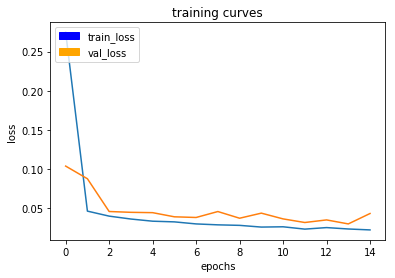

258/258 [==============================] - 49s - loss: 0.0227 - val_loss: 0.0436
Epoch 16/20
257/258 [============================>.] - ETA: 0s - loss: 0.0223

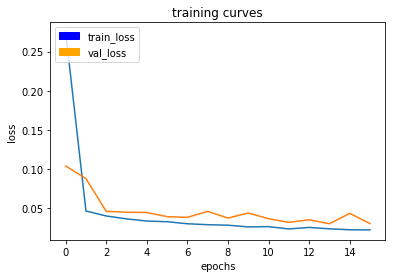

258/258 [==============================] - 49s - loss: 0.0224 - val_loss: 0.0305
Epoch 17/20
257/258 [============================>.] - ETA: 0s - loss: 0.0217

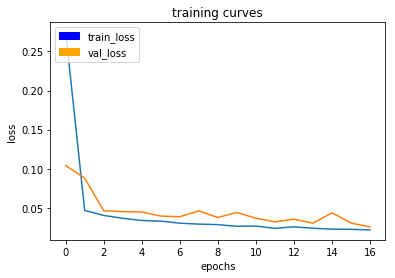

258/258 [==============================] - 49s - loss: 0.0217 - val_loss: 0.0254
Epoch 18/20
257/258 [============================>.] - ETA: 0s - loss: 0.0217

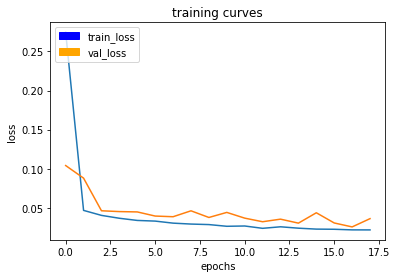

258/258 [==============================] - 49s - loss: 0.0216 - val_loss: 0.0360
Epoch 19/20
257/258 [============================>.] - ETA: 0s - loss: 0.0210

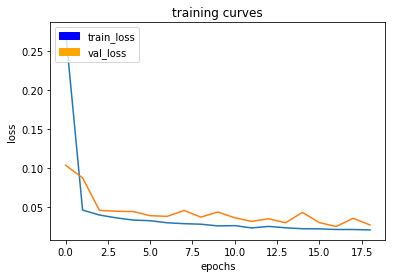

258/258 [==============================] - 49s - loss: 0.0211 - val_loss: 0.0274
Epoch 20/20
257/258 [============================>.] - ETA: 0s - loss: 0.0196

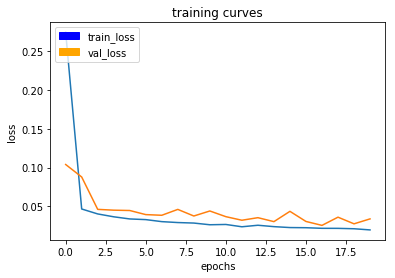

258/258 [==============================] - 49s - loss: 0.0196 - val_loss: 0.0338
TESTING BATCH SIZE:  32
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
128/129 [============================>.] - ETA: 0s - loss: 0.4814

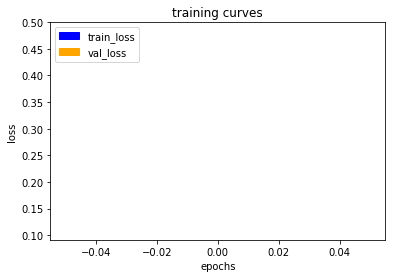

129/129 [==============================] - 50s - loss: 0.4782 - val_loss: 0.1099
Epoch 2/20
128/129 [============================>.] - ETA: 0s - loss: 0.0600

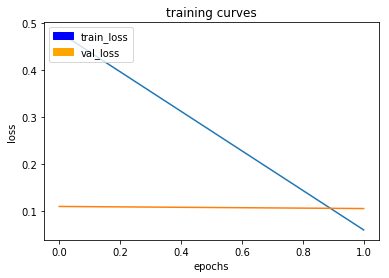

129/129 [==============================] - 49s - loss: 0.0600 - val_loss: 0.1055
Epoch 3/20
128/129 [============================>.] - ETA: 0s - loss: 0.0488

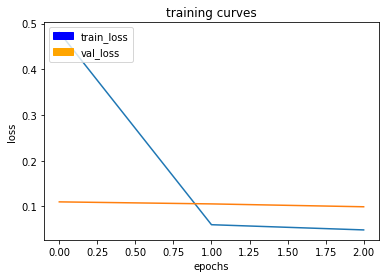

129/129 [==============================] - 49s - loss: 0.0487 - val_loss: 0.0992
Epoch 4/20
128/129 [============================>.] - ETA: 0s - loss: 0.0416

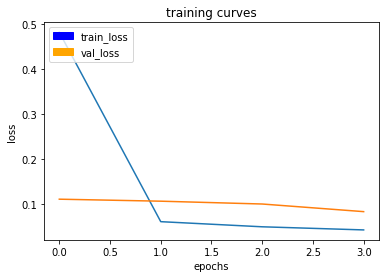

129/129 [==============================] - 49s - loss: 0.0416 - val_loss: 0.0823
Epoch 5/20
128/129 [============================>.] - ETA: 0s - loss: 0.0376

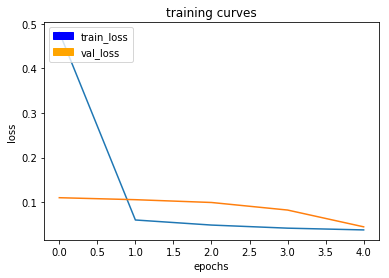

129/129 [==============================] - 49s - loss: 0.0376 - val_loss: 0.0446
Epoch 6/20
128/129 [============================>.] - ETA: 0s - loss: 0.0355

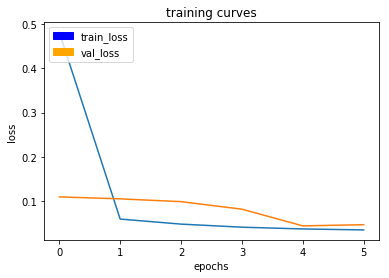

129/129 [==============================] - 49s - loss: 0.0355 - val_loss: 0.0473
Epoch 7/20
128/129 [============================>.] - ETA: 0s - loss: 0.0342

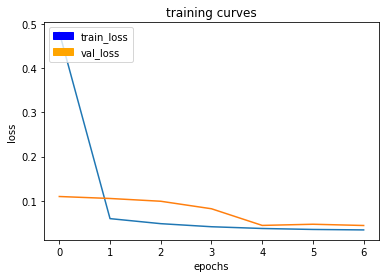

129/129 [==============================] - 49s - loss: 0.0344 - val_loss: 0.0444
Epoch 8/20
128/129 [============================>.] - ETA: 0s - loss: 0.0326

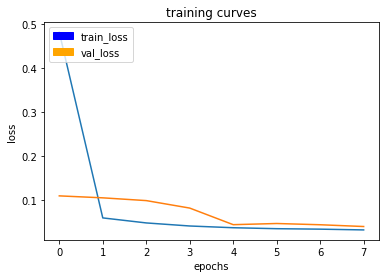

129/129 [==============================] - 49s - loss: 0.0327 - val_loss: 0.0404
Epoch 9/20
128/129 [============================>.] - ETA: 0s - loss: 0.0304

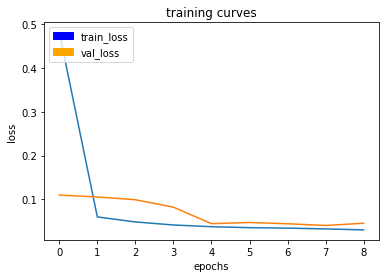

129/129 [==============================] - 49s - loss: 0.0303 - val_loss: 0.0456
Epoch 10/20
128/129 [============================>.] - ETA: 0s - loss: 0.0300

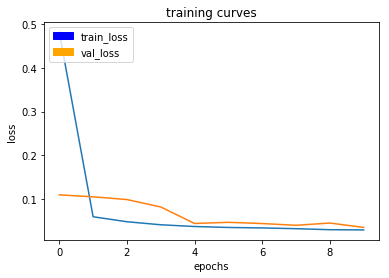

129/129 [==============================] - 49s - loss: 0.0299 - val_loss: 0.0357
Epoch 11/20
128/129 [============================>.] - ETA: 0s - loss: 0.0284

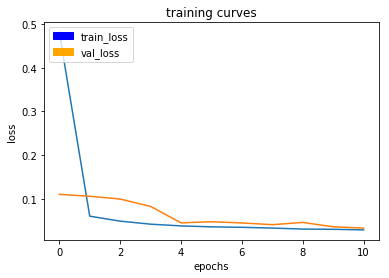

129/129 [==============================] - 49s - loss: 0.0284 - val_loss: 0.0326
Epoch 12/20
128/129 [============================>.] - ETA: 0s - loss: 0.0281

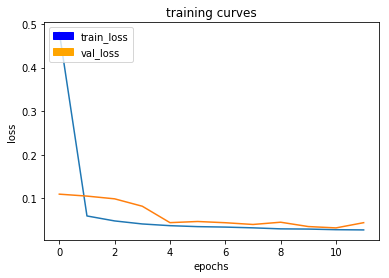

129/129 [==============================] - 49s - loss: 0.0282 - val_loss: 0.0446
Epoch 13/20
128/129 [============================>.] - ETA: 0s - loss: 0.0265

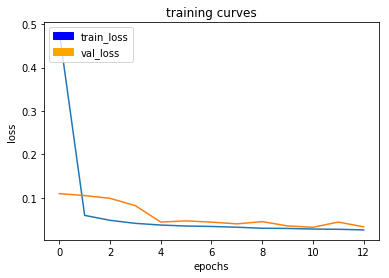

129/129 [==============================] - 49s - loss: 0.0265 - val_loss: 0.0336
Epoch 14/20
128/129 [============================>.] - ETA: 0s - loss: 0.0281

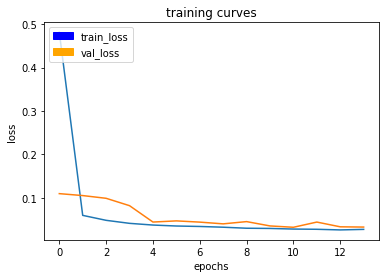

129/129 [==============================] - 49s - loss: 0.0280 - val_loss: 0.0331
Epoch 15/20
128/129 [============================>.] - ETA: 0s - loss: 0.0273

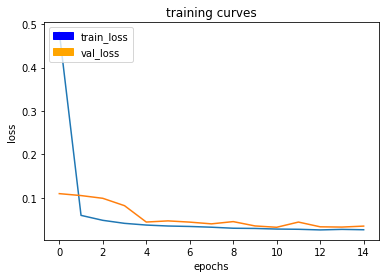

129/129 [==============================] - 49s - loss: 0.0272 - val_loss: 0.0353
Epoch 16/20
128/129 [============================>.] - ETA: 0s - loss: 0.0251

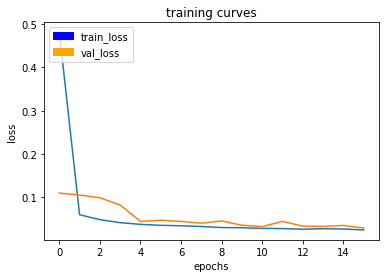

129/129 [==============================] - 49s - loss: 0.0250 - val_loss: 0.0293
Epoch 17/20
128/129 [============================>.] - ETA: 0s - loss: 0.0236

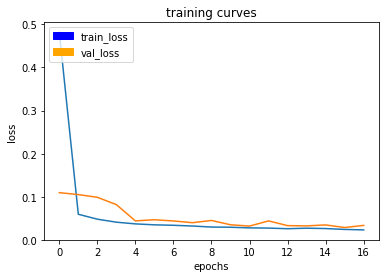

129/129 [==============================] - 49s - loss: 0.0238 - val_loss: 0.0342
Epoch 18/20
128/129 [============================>.] - ETA: 0s - loss: 0.0259

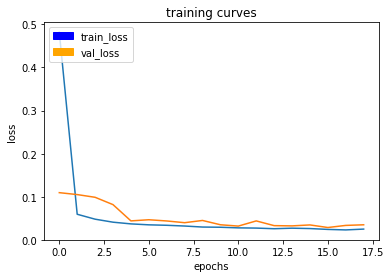

129/129 [==============================] - 49s - loss: 0.0259 - val_loss: 0.0356
Epoch 19/20
128/129 [============================>.] - ETA: 0s - loss: 0.0255

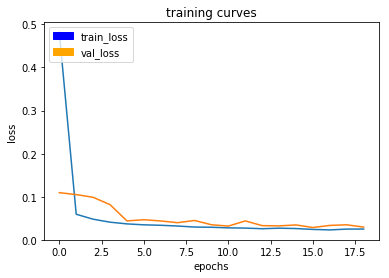

129/129 [==============================] - 49s - loss: 0.0257 - val_loss: 0.0302
Epoch 20/20
128/129 [============================>.] - ETA: 0s - loss: 0.0241

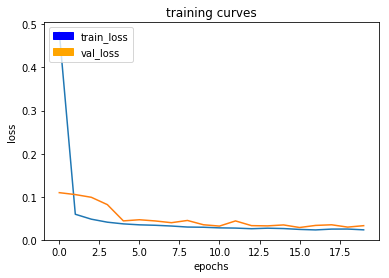

129/129 [==============================] - 49s - loss: 0.0241 - val_loss: 0.0336
TESTING BATCH SIZE:  64
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
63/64 [============================>.] - ETA: 0s - loss: 0.8242

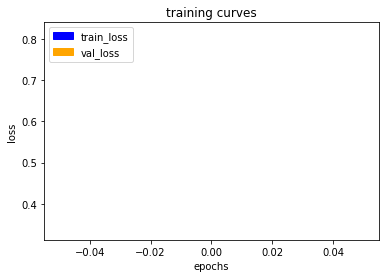

64/64 [==============================] - 51s - loss: 0.8159 - val_loss: 0.3367
Epoch 2/20
63/64 [============================>.] - ETA: 0s - loss: 0.1188

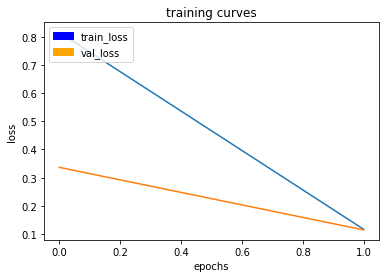

64/64 [==============================] - 49s - loss: 0.1180 - val_loss: 0.1147
Epoch 3/20
63/64 [============================>.] - ETA: 0s - loss: 0.0601

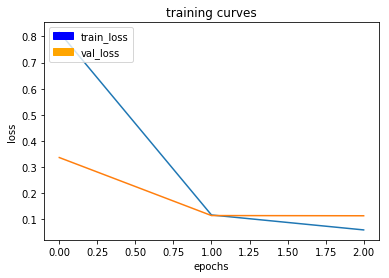

64/64 [==============================] - 49s - loss: 0.0599 - val_loss: 0.1139
Epoch 4/20
63/64 [============================>.] - ETA: 0s - loss: 0.0498

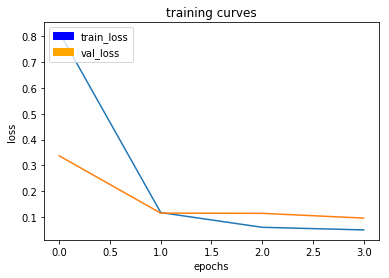

64/64 [==============================] - 49s - loss: 0.0496 - val_loss: 0.0955
Epoch 5/20
63/64 [============================>.] - ETA: 0s - loss: 0.0445

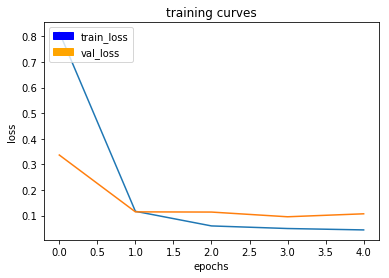

64/64 [==============================] - 49s - loss: 0.0442 - val_loss: 0.1071
Epoch 6/20
63/64 [============================>.] - ETA: 0s - loss: 0.0391

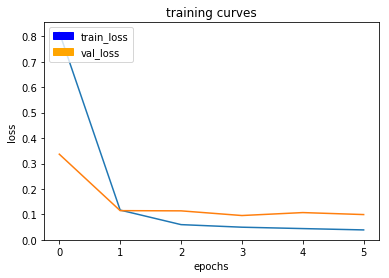

64/64 [==============================] - 49s - loss: 0.0390 - val_loss: 0.0993
Epoch 7/20
63/64 [============================>.] - ETA: 0s - loss: 0.0372

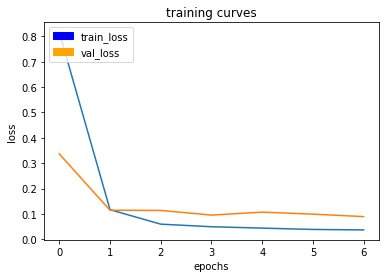

64/64 [==============================] - 49s - loss: 0.0371 - val_loss: 0.0895
Epoch 8/20
63/64 [============================>.] - ETA: 0s - loss: 0.0352

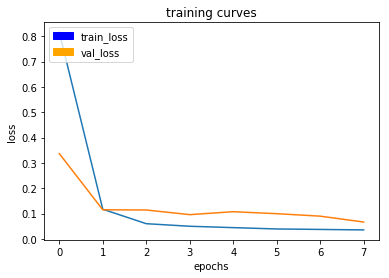

64/64 [==============================] - 49s - loss: 0.0352 - val_loss: 0.0664
Epoch 9/20
63/64 [============================>.] - ETA: 0s - loss: 0.0350

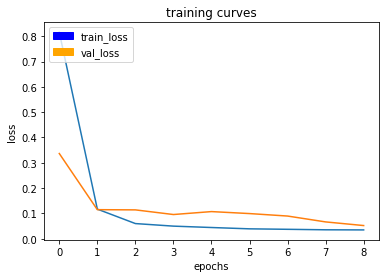

64/64 [==============================] - 49s - loss: 0.0349 - val_loss: 0.0520
Epoch 10/20
63/64 [============================>.] - ETA: 0s - loss: 0.0320

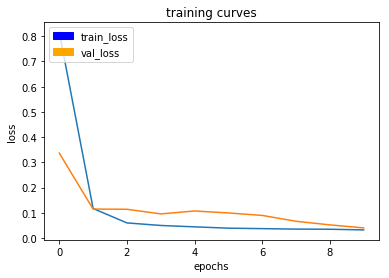

64/64 [==============================] - 49s - loss: 0.0320 - val_loss: 0.0401
Epoch 11/20
63/64 [============================>.] - ETA: 0s - loss: 0.0318

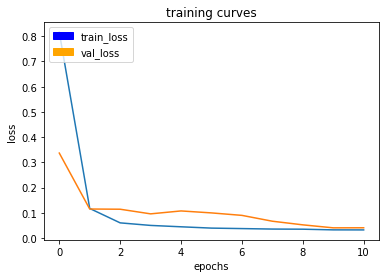

64/64 [==============================] - 49s - loss: 0.0318 - val_loss: 0.0403
Epoch 12/20
63/64 [============================>.] - ETA: 0s - loss: 0.0304

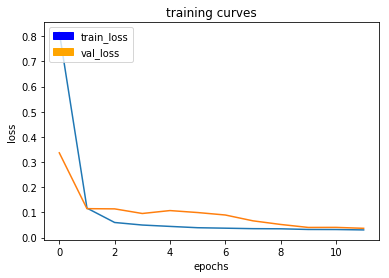

64/64 [==============================] - 49s - loss: 0.0303 - val_loss: 0.0366
Epoch 13/20
63/64 [============================>.] - ETA: 0s - loss: 0.0280

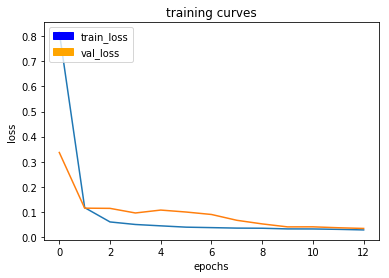

64/64 [==============================] - 49s - loss: 0.0280 - val_loss: 0.0339
Epoch 14/20
63/64 [============================>.] - ETA: 0s - loss: 0.0280

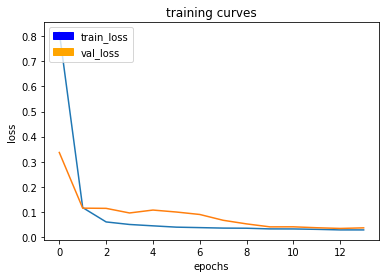

64/64 [==============================] - 49s - loss: 0.0280 - val_loss: 0.0362
Epoch 15/20
63/64 [============================>.] - ETA: 0s - loss: 0.0267

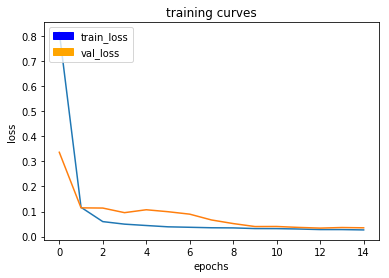

64/64 [==============================] - 49s - loss: 0.0266 - val_loss: 0.0350
Epoch 16/20
63/64 [============================>.] - ETA: 0s - loss: 0.0268

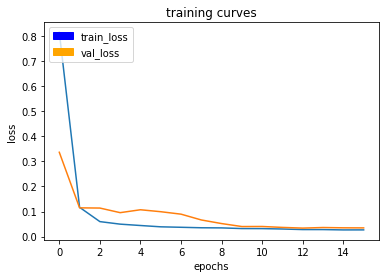

64/64 [==============================] - 49s - loss: 0.0267 - val_loss: 0.0347
Epoch 17/20
63/64 [============================>.] - ETA: 0s - loss: 0.0248

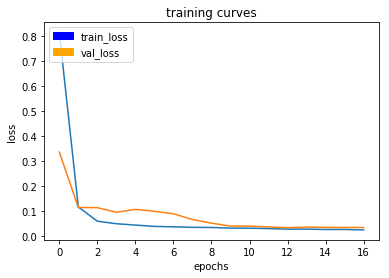

64/64 [==============================] - 49s - loss: 0.0249 - val_loss: 0.0348
Epoch 18/20
63/64 [============================>.] - ETA: 0s - loss: 0.0269

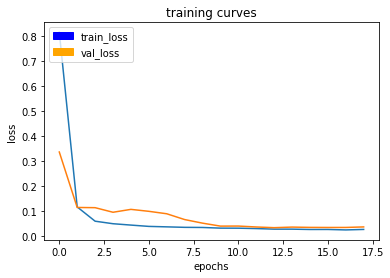

64/64 [==============================] - 49s - loss: 0.0269 - val_loss: 0.0369
Epoch 19/20
63/64 [============================>.] - ETA: 0s - loss: 0.0242

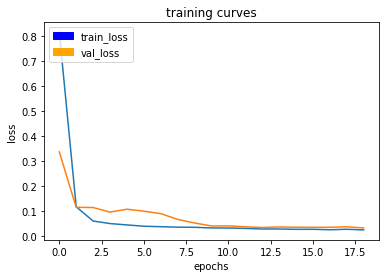

64/64 [==============================] - 49s - loss: 0.0242 - val_loss: 0.0320
Epoch 20/20
63/64 [============================>.] - ETA: 0s - loss: 0.0242

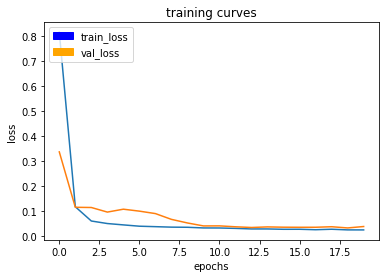

64/64 [==============================] - 49s - loss: 0.0241 - val_loss: 0.0377
TESTING BATCH SIZE:  128
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20
31/32 [============================>.] - ETA: 1s - loss: 1.0546

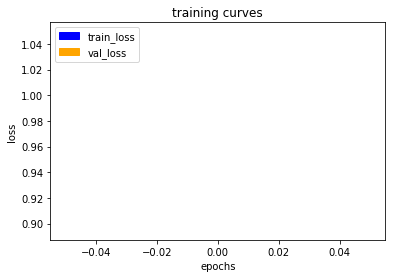

32/32 [==============================] - 52s - loss: 1.0491 - val_loss: 0.8951
Epoch 2/20
31/32 [============================>.] - ETA: 1s - loss: 0.6275

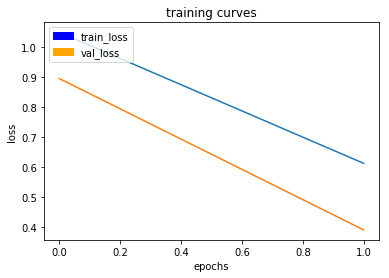

32/32 [==============================] - 51s - loss: 0.6187 - val_loss: 0.3917
Epoch 3/20
31/32 [============================>.] - ETA: 1s - loss: 0.1927

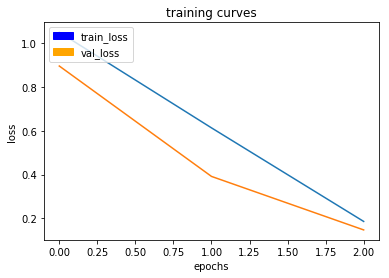

32/32 [==============================] - 51s - loss: 0.1898 - val_loss: 0.1477
Epoch 4/20
31/32 [============================>.] - ETA: 1s - loss: 0.0839

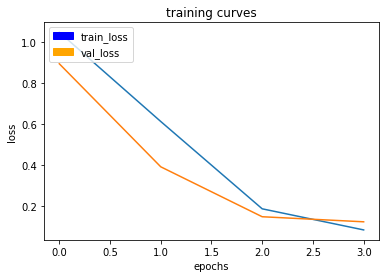

32/32 [==============================] - 51s - loss: 0.0835 - val_loss: 0.1229
Epoch 5/20
31/32 [============================>.] - ETA: 1s - loss: 0.0633

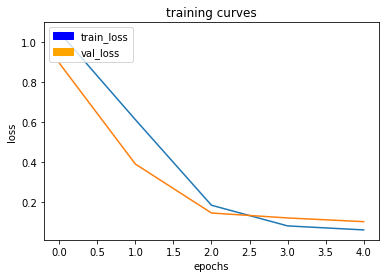

32/32 [==============================] - 51s - loss: 0.0632 - val_loss: 0.1044
Epoch 6/20
31/32 [============================>.] - ETA: 1s - loss: 0.0547

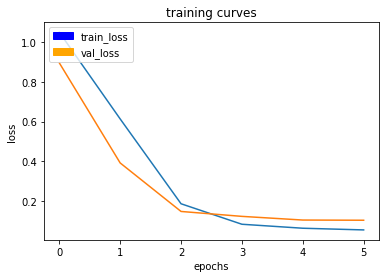

32/32 [==============================] - 50s - loss: 0.0547 - val_loss: 0.1035
Epoch 7/20
31/32 [============================>.] - ETA: 1s - loss: 0.0516

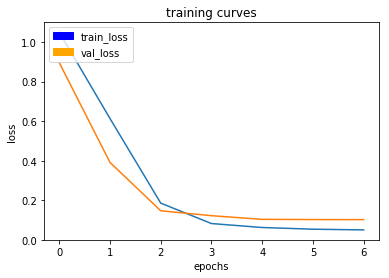

32/32 [==============================] - 50s - loss: 0.0513 - val_loss: 0.1031
Epoch 8/20
31/32 [============================>.] - ETA: 1s - loss: 0.0469

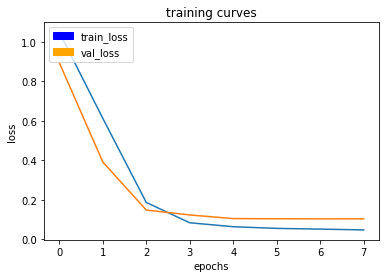

32/32 [==============================] - 50s - loss: 0.0468 - val_loss: 0.1032
Epoch 9/20
31/32 [============================>.] - ETA: 1s - loss: 0.0435

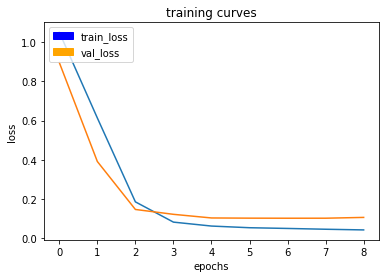

32/32 [==============================] - 50s - loss: 0.0435 - val_loss: 0.1073
Epoch 10/20
31/32 [============================>.] - ETA: 1s - loss: 0.0420

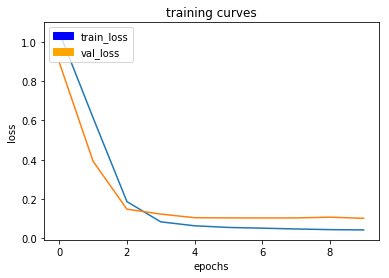

32/32 [==============================] - 50s - loss: 0.0421 - val_loss: 0.1013
Epoch 11/20
31/32 [============================>.] - ETA: 1s - loss: 0.0412

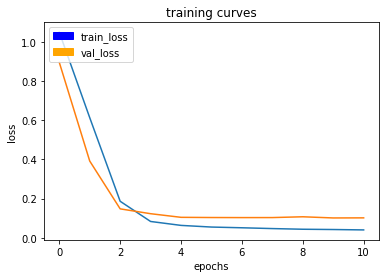

32/32 [==============================] - 50s - loss: 0.0409 - val_loss: 0.1017
Epoch 12/20
31/32 [============================>.] - ETA: 1s - loss: 0.0431

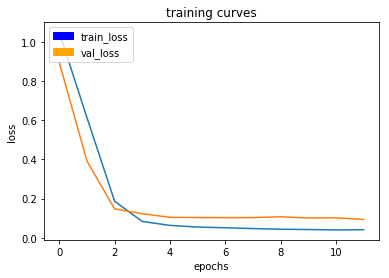

32/32 [==============================] - 50s - loss: 0.0432 - val_loss: 0.0935
Epoch 13/20
31/32 [============================>.] - ETA: 1s - loss: 0.0397

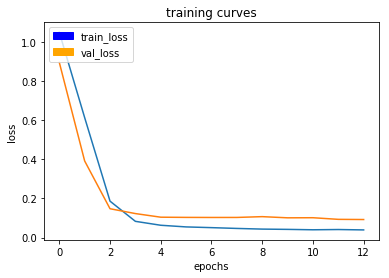

32/32 [==============================] - 50s - loss: 0.0395 - val_loss: 0.0925
Epoch 14/20
31/32 [============================>.] - ETA: 1s - loss: 0.0380

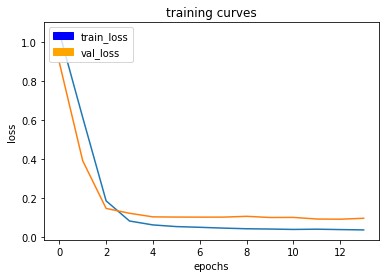

32/32 [==============================] - 50s - loss: 0.0380 - val_loss: 0.0973
Epoch 15/20
31/32 [============================>.] - ETA: 1s - loss: 0.0355

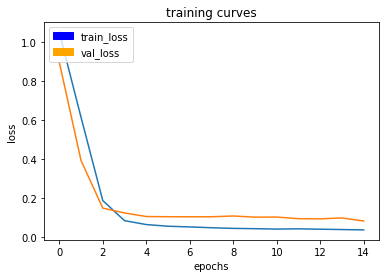

32/32 [==============================] - 50s - loss: 0.0357 - val_loss: 0.0817
Epoch 16/20
31/32 [============================>.] - ETA: 1s - loss: 0.0343

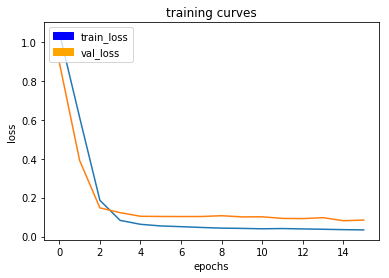

32/32 [==============================] - 50s - loss: 0.0344 - val_loss: 0.0849
Epoch 17/20
31/32 [============================>.] - ETA: 1s - loss: 0.0332

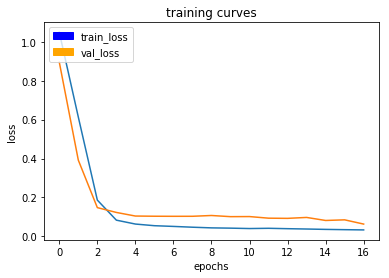

32/32 [==============================] - 51s - loss: 0.0330 - val_loss: 0.0632
Epoch 18/20
31/32 [============================>.] - ETA: 1s - loss: 0.0337

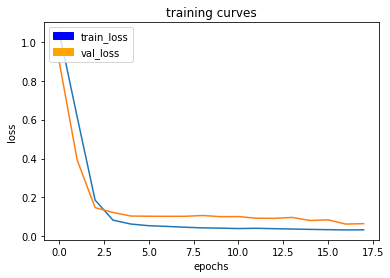

32/32 [==============================] - 50s - loss: 0.0337 - val_loss: 0.0653
Epoch 19/20
31/32 [============================>.] - ETA: 1s - loss: 0.0329

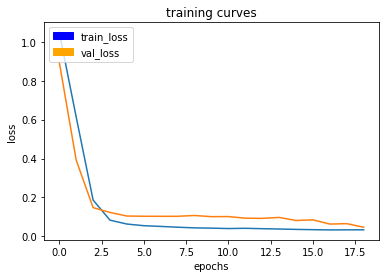

32/32 [==============================] - 50s - loss: 0.0335 - val_loss: 0.0471
Epoch 20/20
31/32 [============================>.] - ETA: 1s - loss: 0.0295

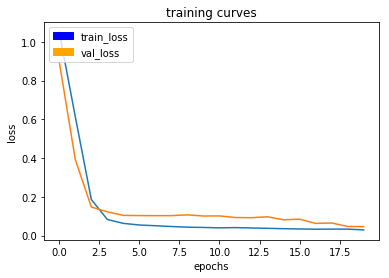

32/32 [==============================] - 50s - loss: 0.0294 - val_loss: 0.0467
TESTING BATCH SIZE:  256
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/20


ResourceExhaustedError: OOM when allocating tensor with shape[256,160,160,64]
	 [[Node: bilinear_up_sampling2d_48/ResizeBilinear = ResizeBilinear[T=DT_FLOAT, align_corners=false, _device="/job:localhost/replica:0/task:0/gpu:0"](batch_normalization_111/batchnorm/add_1, bilinear_up_sampling2d_48/mul)]]
	 [[Node: mul_2762/_3899 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_4985_mul_2762", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/cpu:0"]()]]

Caused by op 'bilinear_up_sampling2d_48/ResizeBilinear', defined at:
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tornado/platform/asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/asyncio/base_events.py", line 422, in run_forever
    self._run_once()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/asyncio/base_events.py", line 1432, in _run_once
    handle._run()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/asyncio/events.py", line 145, in _run
    self._callback(*self._args)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tornado/ioloop.py", line 758, in _run_callback
    ret = callback()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tornado/stack_context.py", line 300, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 536, in <lambda>
    self.io_loop.add_callback(lambda : self._handle_events(self.socket, 0))
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 450, in _handle_events
    self._handle_recv()
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 480, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 432, in _run_callback
    callback(*args, **kwargs)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tornado/stack_context.py", line 300, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2662, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2785, in _run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2901, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2961, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-5-197c6ce3a175>", line 15, in <module>
    _experiment = Experiment( LEARNING_RATE, _batchSize, EPOCHS, modelType )
  File "<ipython-input-2-5ab3b4cb3799>", line 28, in __init__
    inDepth = 3, numclasses = 3, lrate = learningRate )
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/model/models.py", line 201, in __init__
    super( RFCNsimpleModel, self ).__init__( inWidth, inHeight, inDepth, numclasses, lrate )
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/model/models.py", line 66, in __init__
    self._buildArchitecture()
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/model/models.py", line 213, in _buildArchitecture
    _z = decoderBlock( _tconv2, self.m_inputs, 32 )
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/model/common.py", line 66, in decoderBlock
    _upsampled_ip_layer = bilinearUpsample( small_ip_layer )
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/model/common.py", line 49, in bilinearUpsample
    output_layer = BilinearUpSampling2D( ( 2, 2 ) )( input_layer )
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tensorflow/contrib/keras/python/keras/engine/topology.py", line 432, in __call__
    output = super(Layer, self).__call__(inputs, **kwargs)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tensorflow/python/layers/base.py", line 441, in __call__
    outputs = self.call(inputs, *args, **kwargs)
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/utils/separable_conv2d.py", line 635, in call
    return resize_images_bilinear(inputs, self.size[0], self.size[1], self.data_format)
  File "/home/gregor/Documents/wilbert/repos/RoboND-DeepLearning-Project/code/utils/separable_conv2d.py", line 570, in resize_images_bilinear
    x = image_ops.resize_bilinear(x, new_shape)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tensorflow/python/ops/gen_image_ops.py", line 761, in resize_bilinear
    align_corners=align_corners, name=name)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 2506, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/gregor/anaconda3/envs/RoboND36gpu/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1269, in __init__
    self._traceback = _extract_stack()

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[256,160,160,64]
	 [[Node: bilinear_up_sampling2d_48/ResizeBilinear = ResizeBilinear[T=DT_FLOAT, align_corners=false, _device="/job:localhost/replica:0/task:0/gpu:0"](batch_normalization_111/batchnorm/add_1, bilinear_up_sampling2d_48/mul)]]
	 [[Node: mul_2762/_3899 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_4985_mul_2762", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/cpu:0"]()]]


In [5]:
# set up the experiment
EPOCHS = 20
LEARNING_RATE = 0.001

batchSizes = [ 8, 16, 32, 64, 128 ]
baseLearningRate = 0.25
modelType = MODEL_FCN_SIMPLE

_bsizeExperiments = []

for i in range( len( batchSizes ) ) :
    _batchSize = batchSizes[i]
    print( 'TESTING BATCH SIZE: ', _batchSize )
    # create and run experiment
    _experiment = Experiment( LEARNING_RATE, _batchSize, EPOCHS, modelType )
    _experiment.run()
    # save it for later use
    _bsizeExperiments.append( _experiment )


In [6]:
# plot the results
for i in range( len( _bsizeExperiments ) ) :
    print( _bsizeExperiments[i].model().getTrainHistory() )

{'loss': [0.17156686887810046, 0.04459819648876902, 0.038310511260881405, 0.03535174440006131, 0.03288145939653038, 0.03050823620828413, 0.030182741866104815, 0.027991841826158735, 0.028128503385155115, 0.026595595760102442, 0.024466792741808935, 0.025586356637715253, 0.02341236315148998, 0.02283607255947545, 0.023029677516557392, 0.021358924708481615, 0.021599643916368715, 0.020117792858137484, 0.020657158974244586, 0.017555948507231387], 'val_loss': [0.07764967957612227, 0.0469693332860196, 0.04806247640501808, 0.041272793934252615, 0.03568619443103671, 0.03783740005078348, 0.03746241171894645, 0.04533294254813243, 0.03485623641392669, 0.039852506260865846, 0.033350039474867484, 0.0317601197827104, 0.033791100977592775, 0.0504514484955753, 0.03175289322294899, 0.028425175152291114, 0.03029247760974072, 0.04263922108362454, 0.02860374781428962, 0.03440102459736974]}
{'loss': [0.2746148216429838, 0.04659030334446874, 0.04020226332670211, 0.0365105856377473, 0.03374283076835432, 0.03288

### Epochs tuning

Finally, we will tune the number of epochs by choosing from some candidate number of epochs and check the behavior

TESTING NUM EPOCHS:  10
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/10
128/129 [============================>.] - ETA: 0s - loss: 0.4902

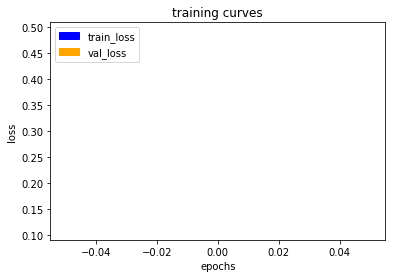

129/129 [==============================] - 49s - loss: 0.4868 - val_loss: 0.1096
Epoch 2/10
128/129 [============================>.] - ETA: 0s - loss: 0.0582

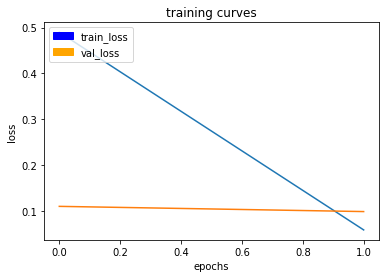

129/129 [==============================] - 48s - loss: 0.0581 - val_loss: 0.0982
Epoch 3/10
128/129 [============================>.] - ETA: 0s - loss: 0.0467

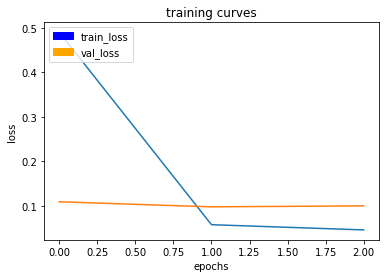

129/129 [==============================] - 48s - loss: 0.0467 - val_loss: 0.1004
Epoch 4/10
128/129 [============================>.] - ETA: 0s - loss: 0.0421

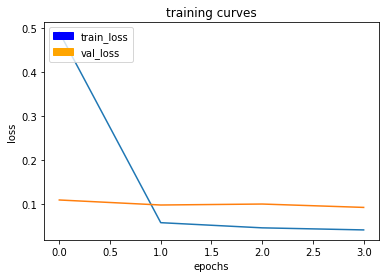

129/129 [==============================] - 49s - loss: 0.0420 - val_loss: 0.0927
Epoch 5/10
128/129 [============================>.] - ETA: 0s - loss: 0.0382

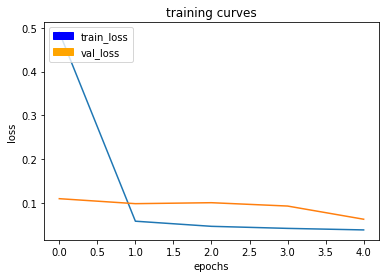

129/129 [==============================] - 51s - loss: 0.0382 - val_loss: 0.0626
Epoch 6/10
128/129 [============================>.] - ETA: 0s - loss: 0.0359

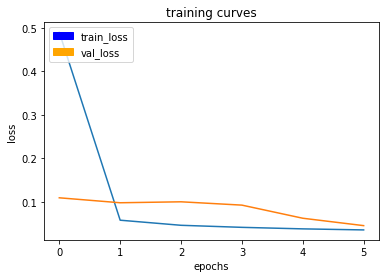

129/129 [==============================] - 50s - loss: 0.0360 - val_loss: 0.0456
Epoch 7/10
128/129 [============================>.] - ETA: 0s - loss: 0.0341

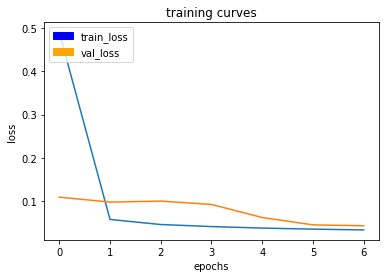

129/129 [==============================] - 50s - loss: 0.0341 - val_loss: 0.0435
Epoch 8/10
128/129 [============================>.] - ETA: 0s - loss: 0.0322

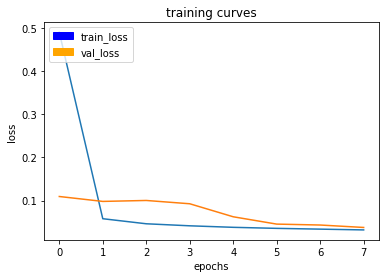

129/129 [==============================] - 50s - loss: 0.0321 - val_loss: 0.0379
Epoch 9/10
128/129 [============================>.] - ETA: 0s - loss: 0.0300

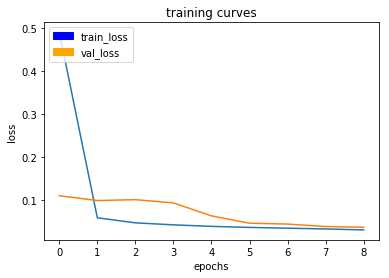

129/129 [==============================] - 50s - loss: 0.0299 - val_loss: 0.0361
Epoch 10/10
128/129 [============================>.] - ETA: 0s - loss: 0.0300

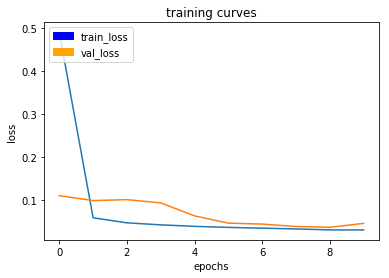

129/129 [==============================] - 51s - loss: 0.0299 - val_loss: 0.0451
TESTING NUM EPOCHS:  25
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/25
128/129 [============================>.] - ETA: 0s - loss: 0.4893

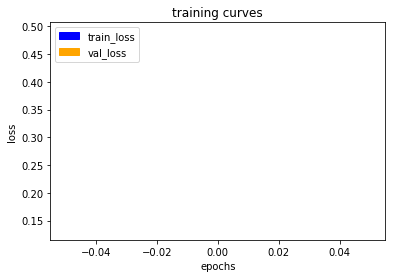

129/129 [==============================] - 54s - loss: 0.4862 - val_loss: 0.1333
Epoch 2/25
128/129 [============================>.] - ETA: 0s - loss: 0.0584

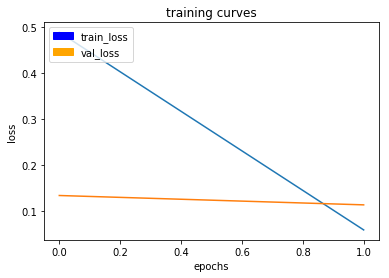

129/129 [==============================] - 52s - loss: 0.0583 - val_loss: 0.1129
Epoch 3/25
128/129 [============================>.] - ETA: 0s - loss: 0.0458

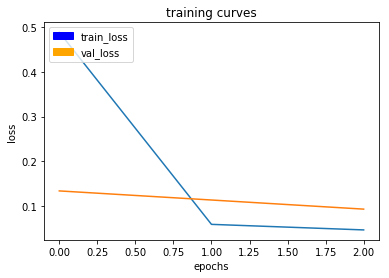

129/129 [==============================] - 52s - loss: 0.0458 - val_loss: 0.0925
Epoch 4/25
128/129 [============================>.] - ETA: 0s - loss: 0.0406

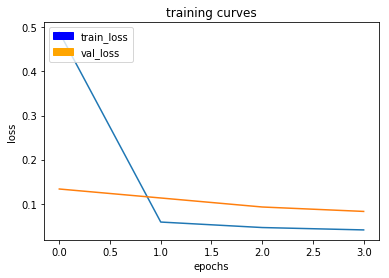

129/129 [==============================] - 52s - loss: 0.0406 - val_loss: 0.0825
Epoch 5/25
128/129 [============================>.] - ETA: 0s - loss: 0.0368

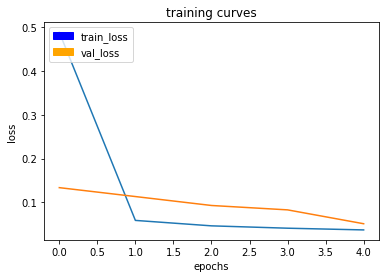

129/129 [==============================] - 51s - loss: 0.0367 - val_loss: 0.0507
Epoch 6/25
128/129 [============================>.] - ETA: 0s - loss: 0.0378

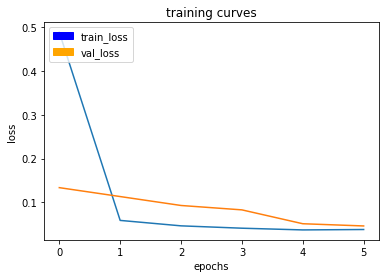

129/129 [==============================] - 51s - loss: 0.0378 - val_loss: 0.0457
Epoch 7/25
128/129 [============================>.] - ETA: 0s - loss: 0.0329

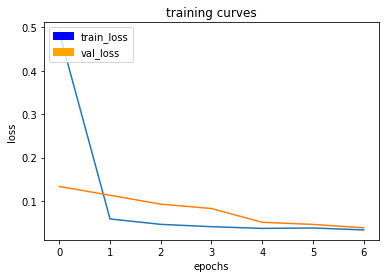

129/129 [==============================] - 52s - loss: 0.0331 - val_loss: 0.0380
Epoch 8/25
128/129 [============================>.] - ETA: 0s - loss: 0.0321

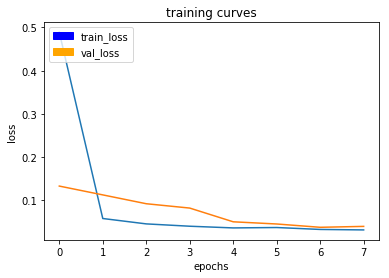

129/129 [==============================] - 50s - loss: 0.0320 - val_loss: 0.0401
Epoch 9/25
128/129 [============================>.] - ETA: 0s - loss: 0.0309

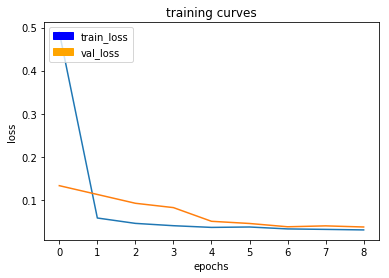

129/129 [==============================] - 51s - loss: 0.0309 - val_loss: 0.0375
Epoch 10/25
128/129 [============================>.] - ETA: 0s - loss: 0.0285

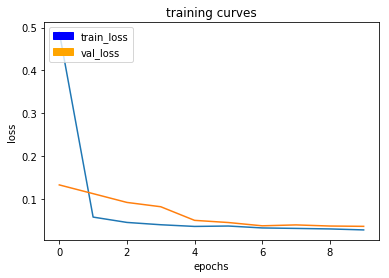

129/129 [==============================] - 52s - loss: 0.0285 - val_loss: 0.0368
Epoch 11/25
128/129 [============================>.] - ETA: 0s - loss: 0.0288

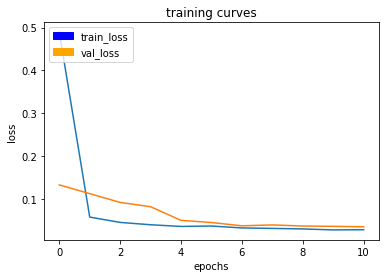

129/129 [==============================] - 51s - loss: 0.0289 - val_loss: 0.0358
Epoch 12/25
128/129 [============================>.] - ETA: 0s - loss: 0.0275

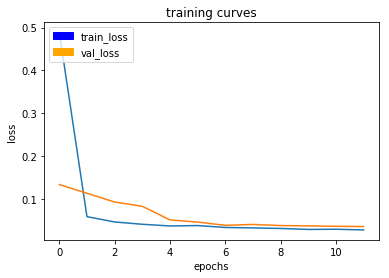

129/129 [==============================] - 59s - loss: 0.0274 - val_loss: 0.0352
Epoch 13/25
128/129 [============================>.] - ETA: 0s - loss: 0.0264

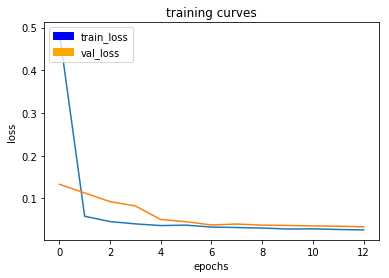

129/129 [==============================] - 60s - loss: 0.0264 - val_loss: 0.0335
Epoch 14/25
128/129 [============================>.] - ETA: 0s - loss: 0.0266

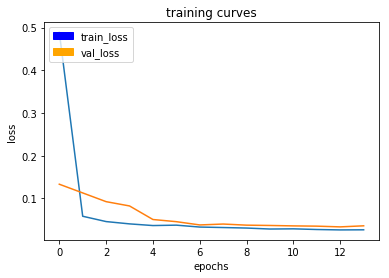

129/129 [==============================] - 51s - loss: 0.0266 - val_loss: 0.0360
Epoch 15/25
128/129 [============================>.] - ETA: 0s - loss: 0.0254

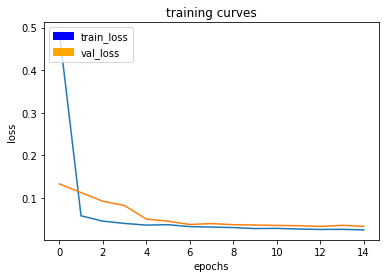

129/129 [==============================] - 60s - loss: 0.0253 - val_loss: 0.0338
Epoch 16/25
128/129 [============================>.] - ETA: 0s - loss: 0.0252

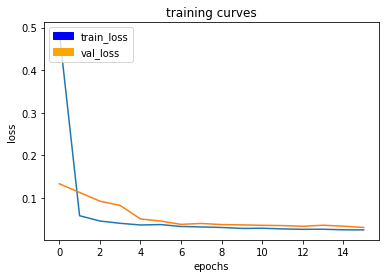

129/129 [==============================] - 50s - loss: 0.0251 - val_loss: 0.0307
Epoch 17/25
128/129 [============================>.] - ETA: 0s - loss: 0.0234

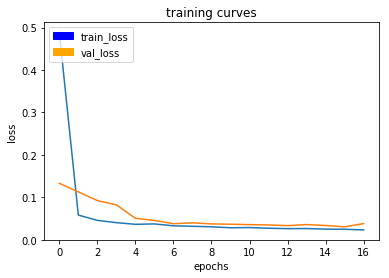

129/129 [==============================] - 50s - loss: 0.0234 - val_loss: 0.0383
Epoch 18/25
128/129 [============================>.] - ETA: 0s - loss: 0.0240

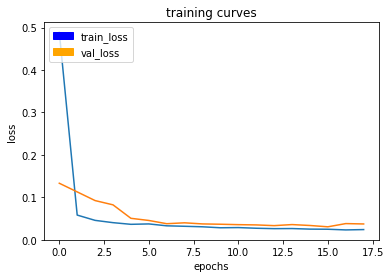

129/129 [==============================] - 50s - loss: 0.0242 - val_loss: 0.0374
Epoch 19/25
128/129 [============================>.] - ETA: 0s - loss: 0.0235

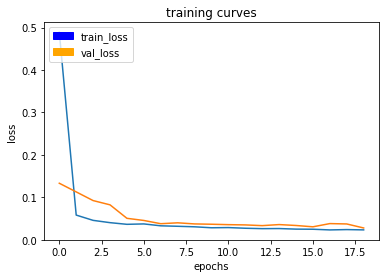

129/129 [==============================] - 50s - loss: 0.0234 - val_loss: 0.0280
Epoch 20/25
128/129 [============================>.] - ETA: 0s - loss: 0.0220

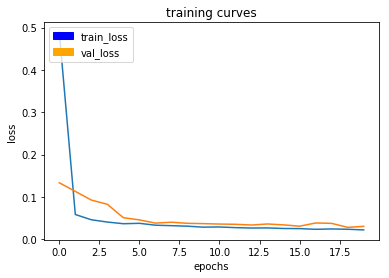

129/129 [==============================] - 51s - loss: 0.0220 - val_loss: 0.0304
Epoch 21/25
128/129 [============================>.] - ETA: 0s - loss: 0.0242

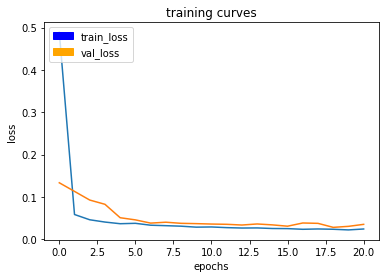

129/129 [==============================] - 50s - loss: 0.0241 - val_loss: 0.0351
Epoch 22/25
128/129 [============================>.] - ETA: 0s - loss: 0.0200

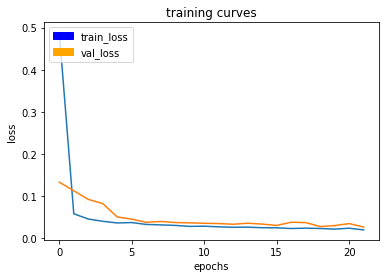

129/129 [==============================] - 50s - loss: 0.0200 - val_loss: 0.0268
Epoch 23/25
128/129 [============================>.] - ETA: 0s - loss: 0.0234

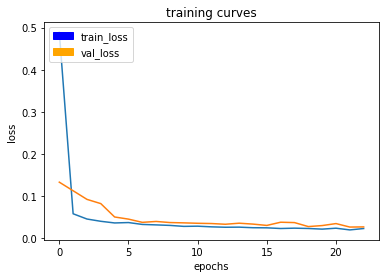

129/129 [==============================] - 50s - loss: 0.0233 - val_loss: 0.0272
Epoch 24/25
128/129 [============================>.] - ETA: 0s - loss: 0.0220

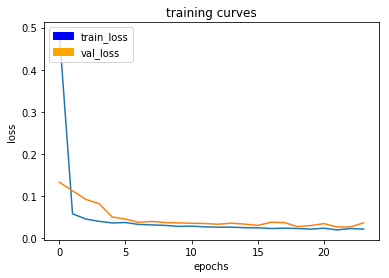

129/129 [==============================] - 50s - loss: 0.0220 - val_loss: 0.0369
Epoch 25/25
128/129 [============================>.] - ETA: 0s - loss: 0.0213

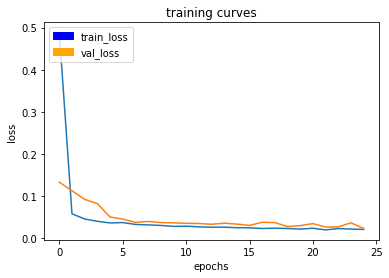

129/129 [==============================] - 50s - loss: 0.0212 - val_loss: 0.0236
TESTING NUM EPOCHS:  50
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/50
128/129 [============================>.] - ETA: 0s - loss: 0.4719

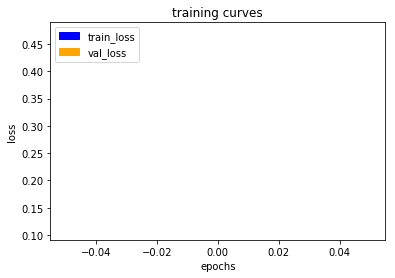

129/129 [==============================] - 51s - loss: 0.4687 - val_loss: 0.1093
Epoch 2/50
128/129 [============================>.] - ETA: 0s - loss: 0.0582

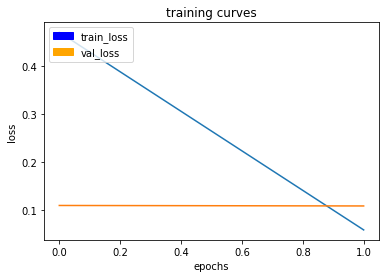

129/129 [==============================] - 49s - loss: 0.0582 - val_loss: 0.1083
Epoch 3/50
128/129 [============================>.] - ETA: 0s - loss: 0.0459

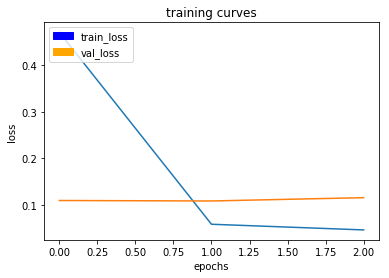

129/129 [==============================] - 49s - loss: 0.0459 - val_loss: 0.1154
Epoch 4/50
128/129 [============================>.] - ETA: 0s - loss: 0.0418

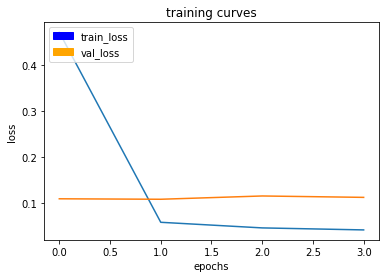

129/129 [==============================] - 49s - loss: 0.0417 - val_loss: 0.1124
Epoch 5/50
128/129 [============================>.] - ETA: 0s - loss: 0.0381

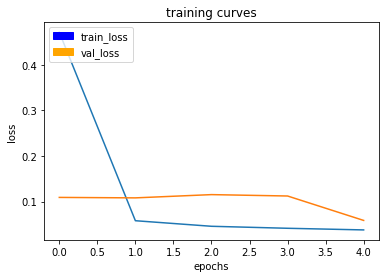

129/129 [==============================] - 49s - loss: 0.0380 - val_loss: 0.0588
Epoch 6/50
128/129 [============================>.] - ETA: 0s - loss: 0.0362

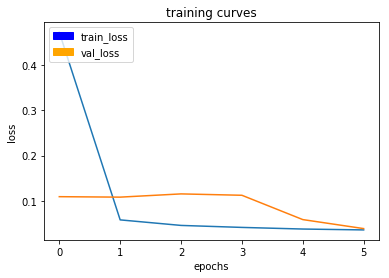

129/129 [==============================] - 49s - loss: 0.0361 - val_loss: 0.0390
Epoch 7/50
128/129 [============================>.] - ETA: 0s - loss: 0.0339

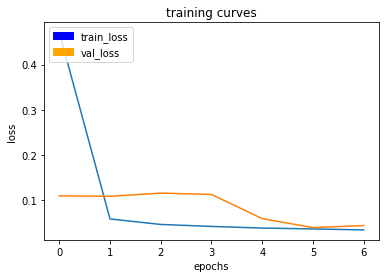

129/129 [==============================] - 49s - loss: 0.0339 - val_loss: 0.0436
Epoch 8/50
128/129 [============================>.] - ETA: 0s - loss: 0.0320

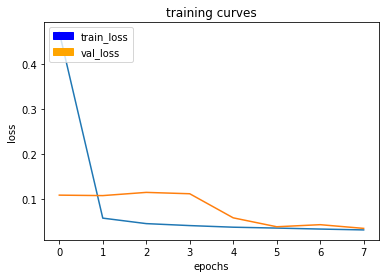

129/129 [==============================] - 49s - loss: 0.0321 - val_loss: 0.0353
Epoch 9/50
128/129 [============================>.] - ETA: 0s - loss: 0.0317

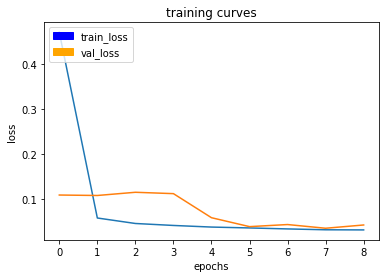

129/129 [==============================] - 49s - loss: 0.0316 - val_loss: 0.0426
Epoch 10/50
128/129 [============================>.] - ETA: 0s - loss: 0.0300

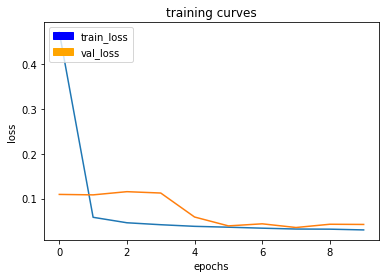

129/129 [==============================] - 49s - loss: 0.0301 - val_loss: 0.0422
Epoch 11/50
128/129 [============================>.] - ETA: 0s - loss: 0.0292

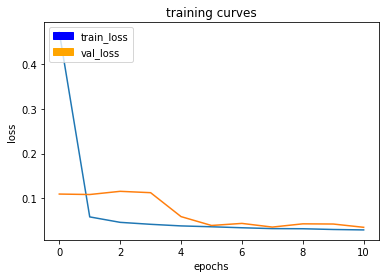

129/129 [==============================] - 49s - loss: 0.0292 - val_loss: 0.0348
Epoch 12/50
128/129 [============================>.] - ETA: 0s - loss: 0.0292

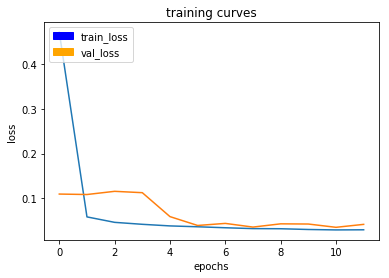

129/129 [==============================] - 49s - loss: 0.0293 - val_loss: 0.0414
Epoch 13/50
128/129 [============================>.] - ETA: 0s - loss: 0.0267

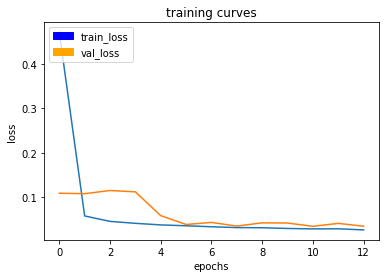

129/129 [==============================] - 49s - loss: 0.0267 - val_loss: 0.0350
Epoch 14/50
128/129 [============================>.] - ETA: 0s - loss: 0.0268

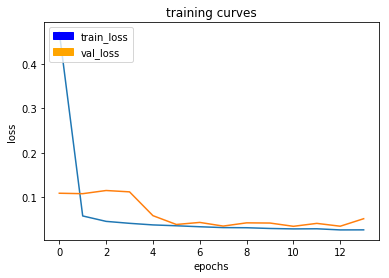

129/129 [==============================] - 49s - loss: 0.0269 - val_loss: 0.0519
Epoch 15/50
128/129 [============================>.] - ETA: 0s - loss: 0.0266

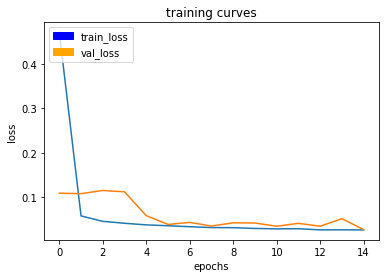

129/129 [==============================] - 49s - loss: 0.0266 - val_loss: 0.0273
Epoch 16/50
128/129 [============================>.] - ETA: 0s - loss: 0.0254

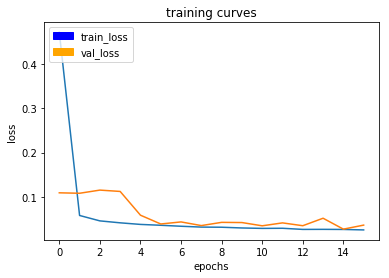

129/129 [==============================] - 49s - loss: 0.0256 - val_loss: 0.0364
Epoch 17/50
128/129 [============================>.] - ETA: 0s - loss: 0.0246

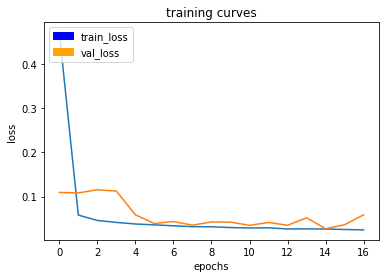

129/129 [==============================] - 49s - loss: 0.0247 - val_loss: 0.0587
Epoch 18/50
128/129 [============================>.] - ETA: 0s - loss: 0.0258

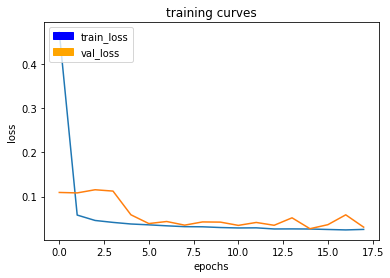

129/129 [==============================] - 49s - loss: 0.0257 - val_loss: 0.0308
Epoch 19/50
128/129 [============================>.] - ETA: 0s - loss: 0.0233

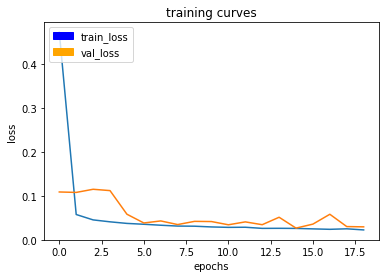

129/129 [==============================] - 49s - loss: 0.0232 - val_loss: 0.0302
Epoch 20/50
128/129 [============================>.] - ETA: 0s - loss: 0.0236

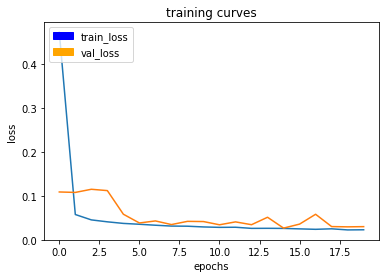

129/129 [==============================] - 49s - loss: 0.0237 - val_loss: 0.0306
Epoch 21/50
128/129 [============================>.] - ETA: 0s - loss: 0.0229

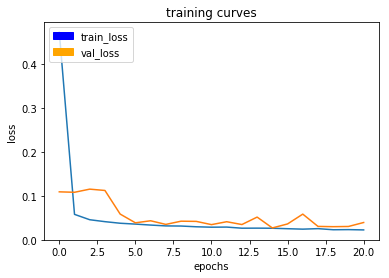

129/129 [==============================] - 49s - loss: 0.0228 - val_loss: 0.0397
Epoch 22/50
128/129 [============================>.] - ETA: 0s - loss: 0.0218

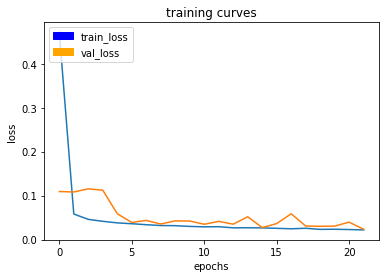

129/129 [==============================] - 49s - loss: 0.0219 - val_loss: 0.0234
Epoch 23/50
128/129 [============================>.] - ETA: 0s - loss: 0.0204

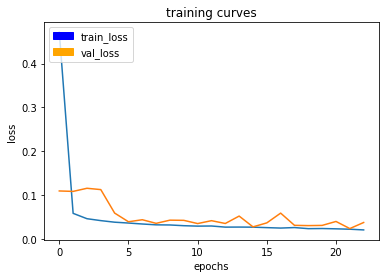

129/129 [==============================] - 49s - loss: 0.0203 - val_loss: 0.0373
Epoch 24/50
128/129 [============================>.] - ETA: 0s - loss: 0.0279

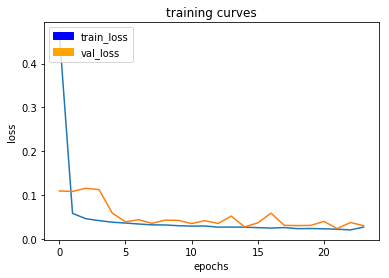

129/129 [==============================] - 49s - loss: 0.0278 - val_loss: 0.0299
Epoch 25/50
128/129 [============================>.] - ETA: 0s - loss: 0.0219

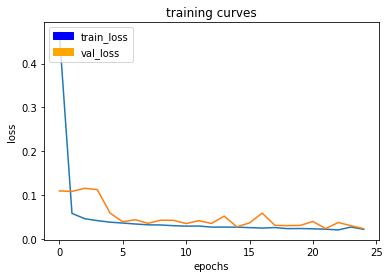

129/129 [==============================] - 49s - loss: 0.0218 - val_loss: 0.0232
Epoch 26/50
128/129 [============================>.] - ETA: 0s - loss: 0.0203

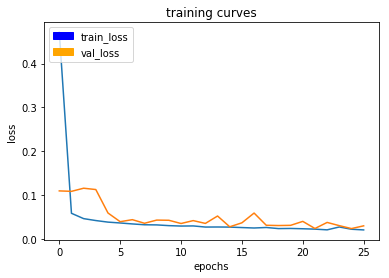

129/129 [==============================] - 49s - loss: 0.0202 - val_loss: 0.0295
Epoch 27/50
128/129 [============================>.] - ETA: 0s - loss: 0.0253

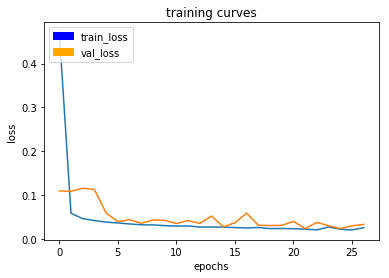

129/129 [==============================] - 49s - loss: 0.0253 - val_loss: 0.0329
Epoch 28/50
128/129 [============================>.] - ETA: 0s - loss: 0.0196

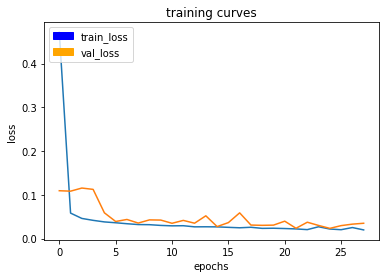

129/129 [==============================] - 50s - loss: 0.0197 - val_loss: 0.0349
Epoch 29/50
128/129 [============================>.] - ETA: 0s - loss: 0.0203

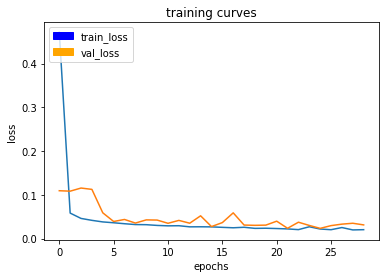

129/129 [==============================] - 50s - loss: 0.0203 - val_loss: 0.0312
Epoch 30/50
128/129 [============================>.] - ETA: 0s - loss: 0.0213

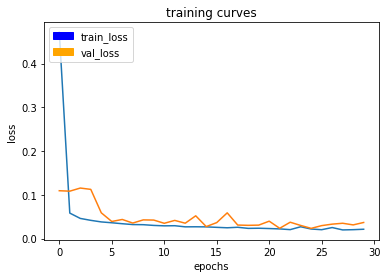

129/129 [==============================] - 49s - loss: 0.0213 - val_loss: 0.0367
Epoch 31/50
128/129 [============================>.] - ETA: 0s - loss: 0.0208

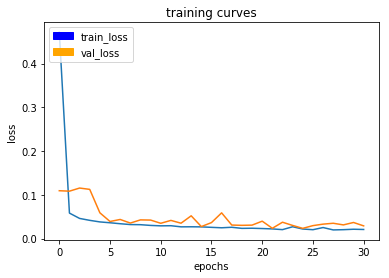

129/129 [==============================] - 49s - loss: 0.0207 - val_loss: 0.0289
Epoch 32/50
128/129 [============================>.] - ETA: 0s - loss: 0.0180

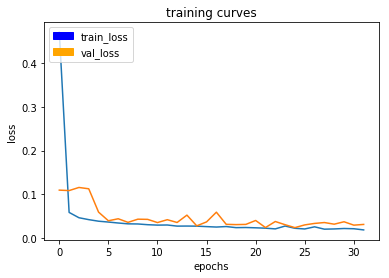

129/129 [==============================] - 49s - loss: 0.0180 - val_loss: 0.0306
Epoch 33/50
128/129 [============================>.] - ETA: 0s - loss: 0.0180

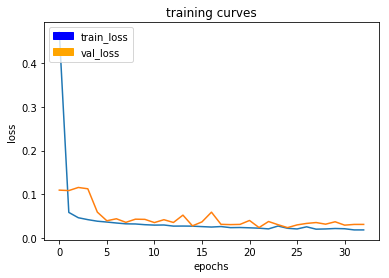

129/129 [==============================] - 49s - loss: 0.0180 - val_loss: 0.0306
Epoch 34/50
128/129 [============================>.] - ETA: 0s - loss: 0.0219

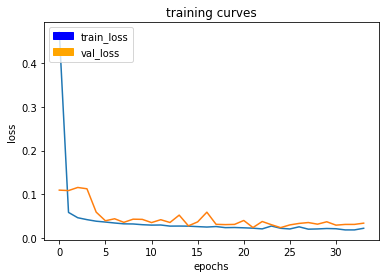

129/129 [==============================] - 49s - loss: 0.0219 - val_loss: 0.0335
Epoch 35/50
128/129 [============================>.] - ETA: 0s - loss: 0.0180

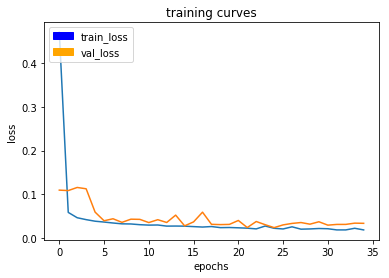

129/129 [==============================] - 49s - loss: 0.0180 - val_loss: 0.0331
Epoch 36/50
128/129 [============================>.] - ETA: 0s - loss: 0.0177

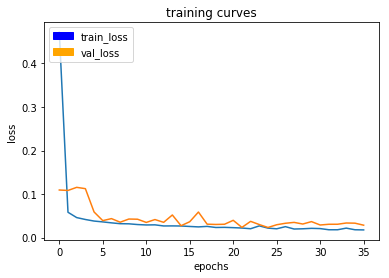

129/129 [==============================] - 49s - loss: 0.0177 - val_loss: 0.0285
Epoch 37/50
128/129 [============================>.] - ETA: 0s - loss: 0.0171

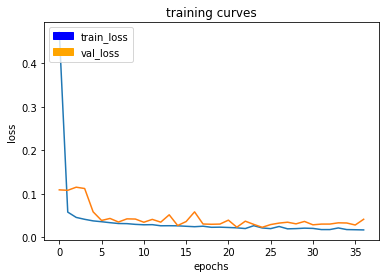

129/129 [==============================] - 49s - loss: 0.0172 - val_loss: 0.0417
Epoch 38/50
128/129 [============================>.] - ETA: 0s - loss: 0.0190

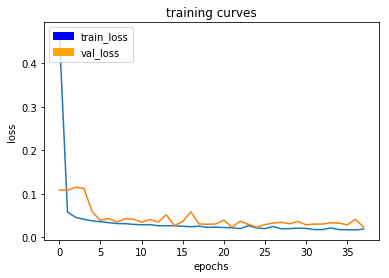

129/129 [==============================] - 49s - loss: 0.0190 - val_loss: 0.0234
Epoch 39/50
128/129 [============================>.] - ETA: 0s - loss: 0.0165

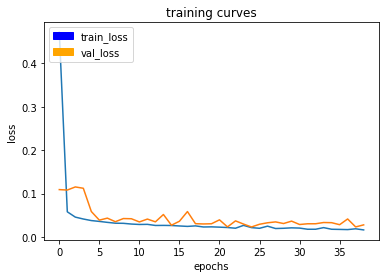

129/129 [==============================] - 49s - loss: 0.0164 - val_loss: 0.0281
Epoch 40/50
128/129 [============================>.] - ETA: 0s - loss: 0.0184

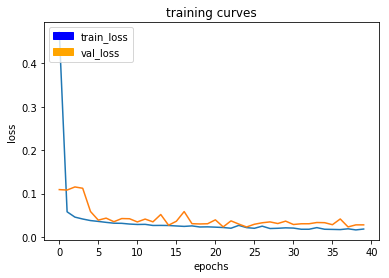

129/129 [==============================] - 49s - loss: 0.0185 - val_loss: 0.0281
Epoch 41/50
128/129 [============================>.] - ETA: 0s - loss: 0.0171

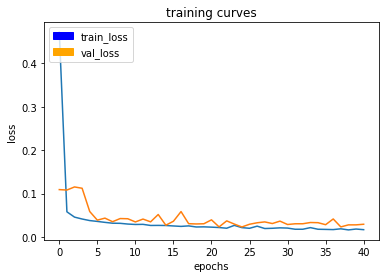

129/129 [==============================] - 49s - loss: 0.0171 - val_loss: 0.0295
Epoch 42/50
128/129 [============================>.] - ETA: 0s - loss: 0.0167

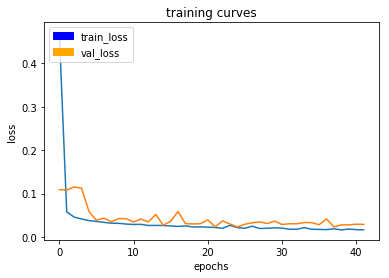

129/129 [==============================] - 49s - loss: 0.0167 - val_loss: 0.0292
Epoch 43/50
128/129 [============================>.] - ETA: 0s - loss: 0.0161

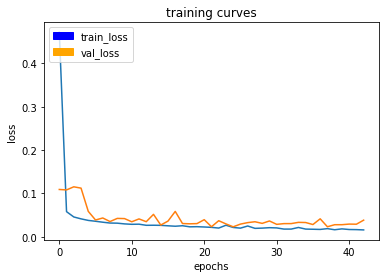

129/129 [==============================] - 49s - loss: 0.0161 - val_loss: 0.0386
Epoch 44/50
128/129 [============================>.] - ETA: 0s - loss: 0.0160

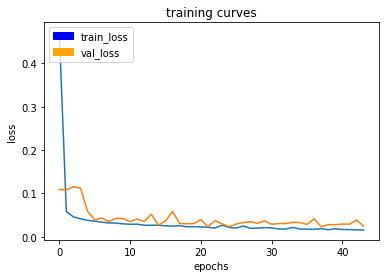

129/129 [==============================] - 49s - loss: 0.0159 - val_loss: 0.0244
Epoch 45/50
128/129 [============================>.] - ETA: 0s - loss: 0.0167

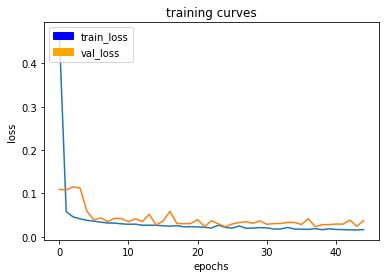

129/129 [==============================] - 49s - loss: 0.0167 - val_loss: 0.0375
Epoch 46/50
128/129 [============================>.] - ETA: 0s - loss: 0.0171

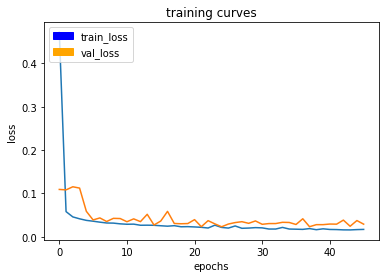

129/129 [==============================] - 49s - loss: 0.0171 - val_loss: 0.0292
Epoch 47/50
128/129 [============================>.] - ETA: 0s - loss: 0.0163

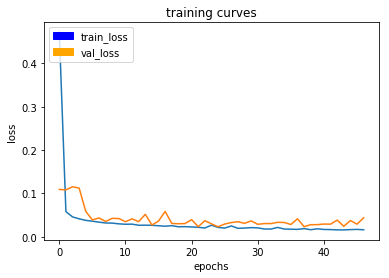

129/129 [==============================] - 49s - loss: 0.0163 - val_loss: 0.0440
Epoch 48/50
128/129 [============================>.] - ETA: 0s - loss: 0.0178

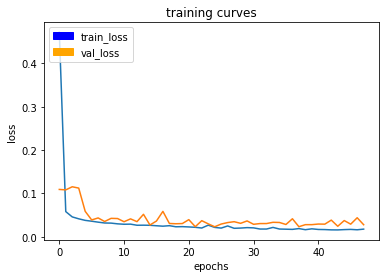

129/129 [==============================] - 49s - loss: 0.0178 - val_loss: 0.0279
Epoch 49/50
128/129 [============================>.] - ETA: 0s - loss: 0.0160

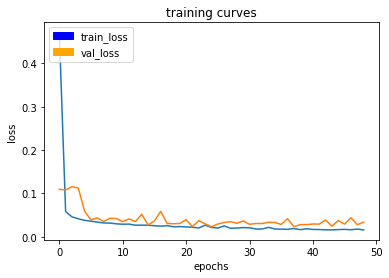

129/129 [==============================] - 49s - loss: 0.0160 - val_loss: 0.0339
Epoch 50/50
128/129 [============================>.] - ETA: 0s - loss: 0.0157

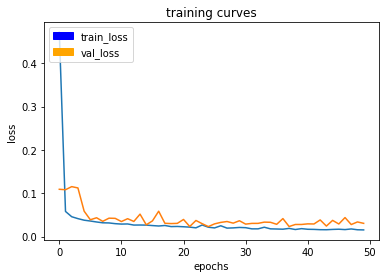

129/129 [==============================] - 49s - loss: 0.0157 - val_loss: 0.0307
TESTING NUM EPOCHS:  100
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/100
128/129 [============================>.] - ETA: 0s - loss: 0.5532

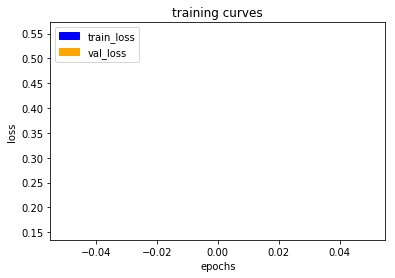

129/129 [==============================] - 51s - loss: 0.5494 - val_loss: 0.1547
Epoch 2/100
128/129 [============================>.] - ETA: 0s - loss: 0.0628

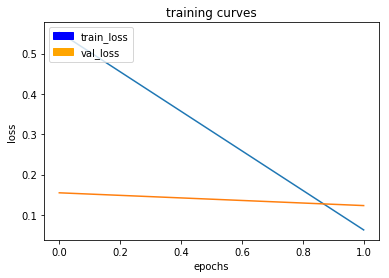

129/129 [==============================] - 49s - loss: 0.0627 - val_loss: 0.1230
Epoch 3/100
128/129 [============================>.] - ETA: 0s - loss: 0.0471

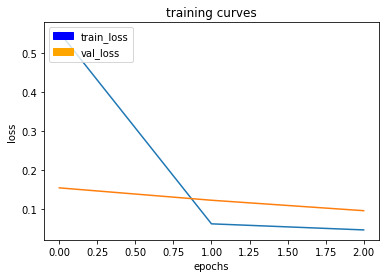

129/129 [==============================] - 49s - loss: 0.0470 - val_loss: 0.0963
Epoch 4/100
128/129 [============================>.] - ETA: 0s - loss: 0.0427

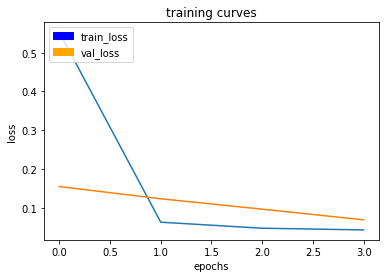

129/129 [==============================] - 49s - loss: 0.0426 - val_loss: 0.0687
Epoch 5/100
128/129 [============================>.] - ETA: 0s - loss: 0.0394

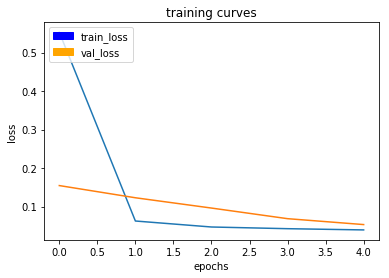

129/129 [==============================] - 49s - loss: 0.0396 - val_loss: 0.0534
Epoch 6/100
128/129 [============================>.] - ETA: 0s - loss: 0.0379

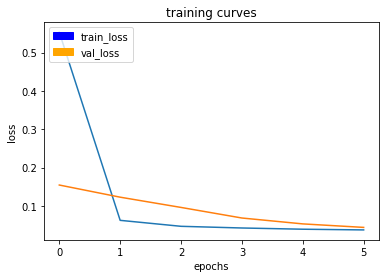

129/129 [==============================] - 49s - loss: 0.0378 - val_loss: 0.0443
Epoch 7/100
128/129 [============================>.] - ETA: 0s - loss: 0.0358

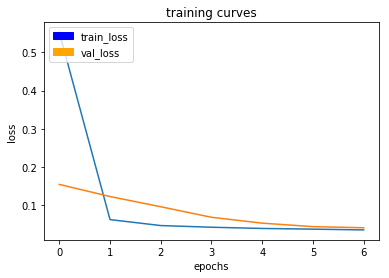

129/129 [==============================] - 49s - loss: 0.0358 - val_loss: 0.0414
Epoch 8/100
128/129 [============================>.] - ETA: 0s - loss: 0.0402

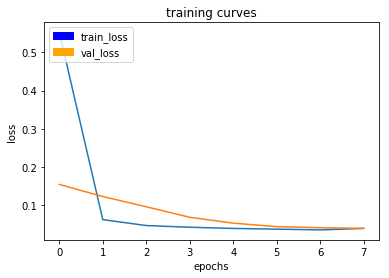

129/129 [==============================] - 49s - loss: 0.0405 - val_loss: 0.0398
Epoch 9/100
128/129 [============================>.] - ETA: 0s - loss: 0.0340

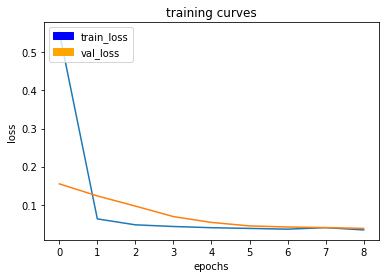

129/129 [==============================] - 49s - loss: 0.0341 - val_loss: 0.0377
Epoch 10/100
128/129 [============================>.] - ETA: 0s - loss: 0.0310

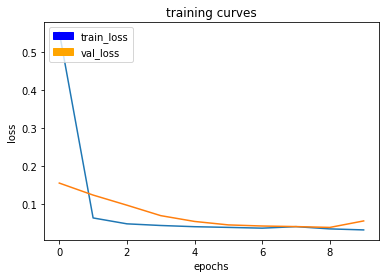

129/129 [==============================] - 49s - loss: 0.0310 - val_loss: 0.0548
Epoch 11/100
128/129 [============================>.] - ETA: 0s - loss: 0.0309

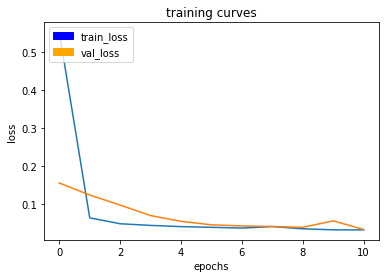

129/129 [==============================] - 49s - loss: 0.0309 - val_loss: 0.0318
Epoch 12/100
128/129 [============================>.] - ETA: 0s - loss: 0.0295

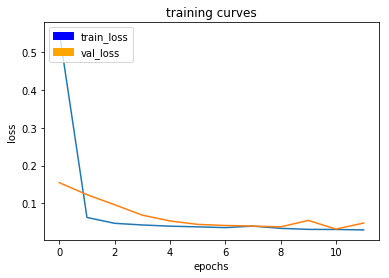

129/129 [==============================] - 49s - loss: 0.0295 - val_loss: 0.0478
Epoch 13/100
128/129 [============================>.] - ETA: 0s - loss: 0.0291

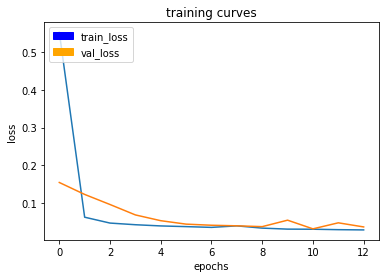

129/129 [==============================] - 49s - loss: 0.0291 - val_loss: 0.0369
Epoch 14/100
128/129 [============================>.] - ETA: 0s - loss: 0.0294

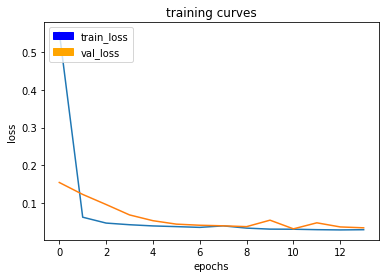

129/129 [==============================] - 49s - loss: 0.0296 - val_loss: 0.0345
Epoch 15/100
128/129 [============================>.] - ETA: 0s - loss: 0.0270

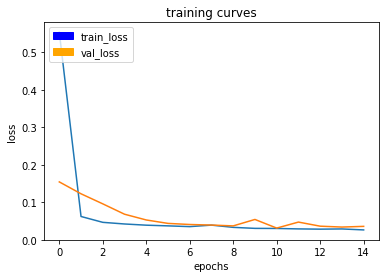

129/129 [==============================] - 49s - loss: 0.0270 - val_loss: 0.0364
Epoch 16/100
128/129 [============================>.] - ETA: 0s - loss: 0.0276

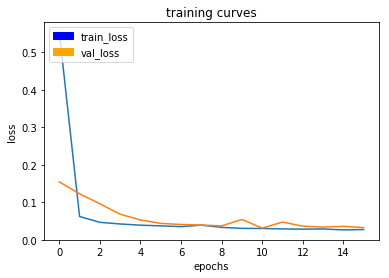

129/129 [==============================] - 49s - loss: 0.0279 - val_loss: 0.0331
Epoch 17/100
128/129 [============================>.] - ETA: 0s - loss: 0.0256

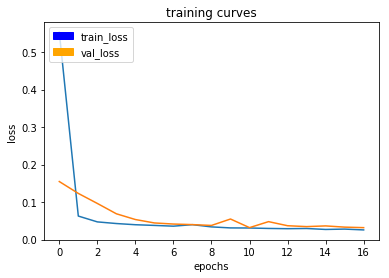

129/129 [==============================] - 49s - loss: 0.0257 - val_loss: 0.0318
Epoch 18/100
128/129 [============================>.] - ETA: 0s - loss: 0.0255

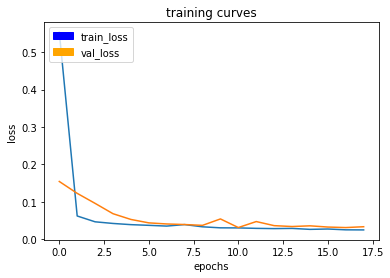

129/129 [==============================] - 49s - loss: 0.0255 - val_loss: 0.0340
Epoch 19/100
128/129 [============================>.] - ETA: 0s - loss: 0.0254

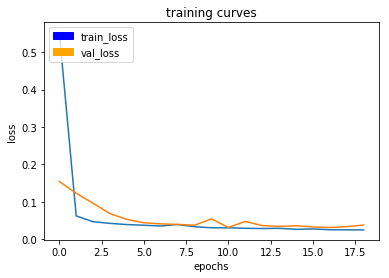

129/129 [==============================] - 49s - loss: 0.0253 - val_loss: 0.0384
Epoch 20/100
128/129 [============================>.] - ETA: 0s - loss: 0.0235

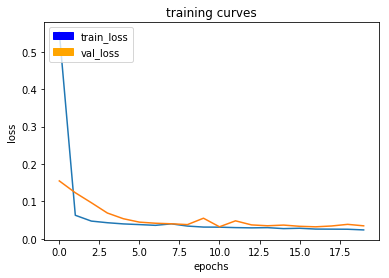

129/129 [==============================] - 49s - loss: 0.0235 - val_loss: 0.0344
Epoch 21/100
128/129 [============================>.] - ETA: 0s - loss: 0.0236

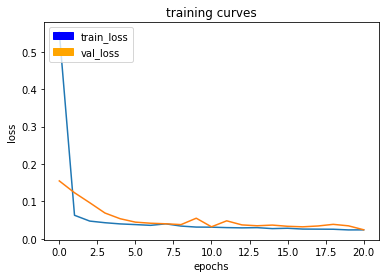

129/129 [==============================] - 49s - loss: 0.0236 - val_loss: 0.0239
Epoch 22/100
128/129 [============================>.] - ETA: 0s - loss: 0.0258

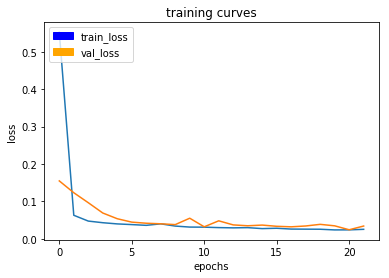

129/129 [==============================] - 49s - loss: 0.0257 - val_loss: 0.0338
Epoch 23/100
128/129 [============================>.] - ETA: 0s - loss: 0.0251

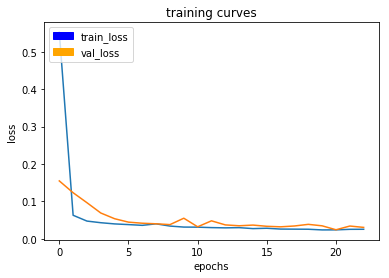

129/129 [==============================] - 49s - loss: 0.0252 - val_loss: 0.0302
Epoch 24/100
128/129 [============================>.] - ETA: 0s - loss: 0.0244

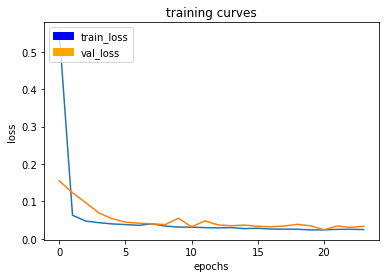

129/129 [==============================] - 49s - loss: 0.0244 - val_loss: 0.0333
Epoch 25/100
128/129 [============================>.] - ETA: 0s - loss: 0.0233

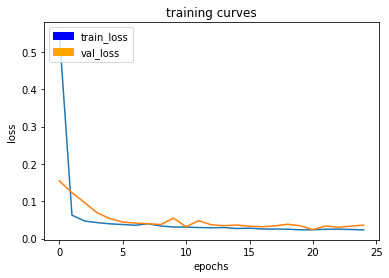

129/129 [==============================] - 49s - loss: 0.0232 - val_loss: 0.0361
Epoch 26/100
128/129 [============================>.] - ETA: 0s - loss: 0.0220

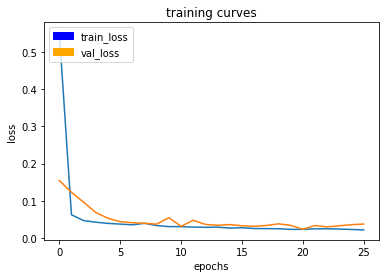

129/129 [==============================] - 49s - loss: 0.0220 - val_loss: 0.0379
Epoch 27/100
128/129 [============================>.] - ETA: 0s - loss: 0.0216

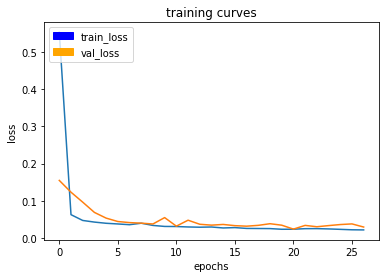

129/129 [==============================] - 50s - loss: 0.0216 - val_loss: 0.0294
Epoch 28/100
128/129 [============================>.] - ETA: 0s - loss: 0.0225

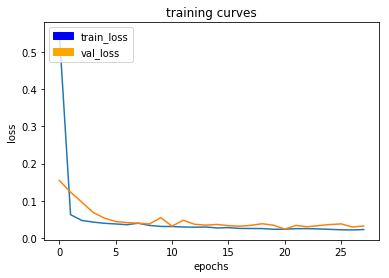

129/129 [==============================] - 49s - loss: 0.0226 - val_loss: 0.0323
Epoch 29/100
128/129 [============================>.] - ETA: 0s - loss: 0.0224

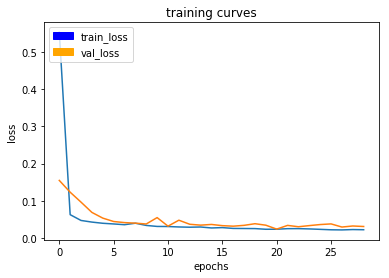

129/129 [==============================] - 49s - loss: 0.0224 - val_loss: 0.0309
Epoch 30/100
128/129 [============================>.] - ETA: 0s - loss: 0.0204

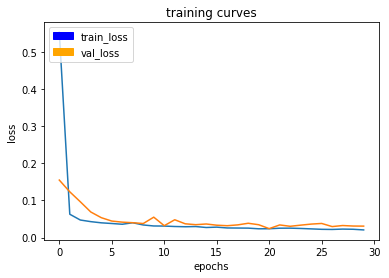

129/129 [==============================] - 49s - loss: 0.0204 - val_loss: 0.0306
Epoch 31/100
128/129 [============================>.] - ETA: 0s - loss: 0.0201

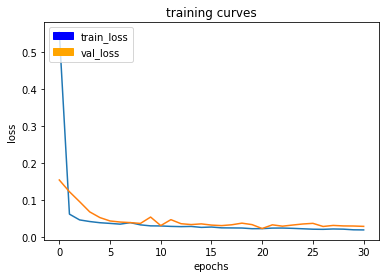

129/129 [==============================] - 49s - loss: 0.0201 - val_loss: 0.0297
Epoch 32/100
128/129 [============================>.] - ETA: 0s - loss: 0.0211

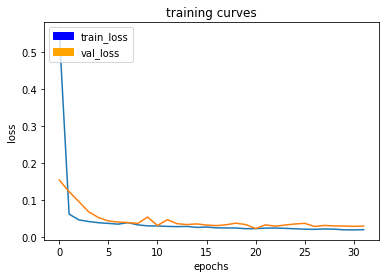

129/129 [==============================] - 49s - loss: 0.0211 - val_loss: 0.0306
Epoch 33/100
128/129 [============================>.] - ETA: 0s - loss: 0.0194

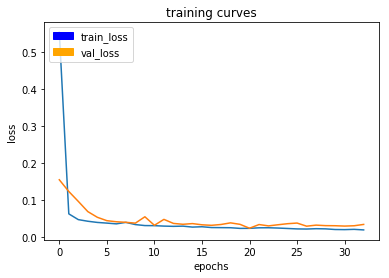

129/129 [==============================] - 49s - loss: 0.0193 - val_loss: 0.0342
Epoch 34/100
128/129 [============================>.] - ETA: 0s - loss: 0.0189

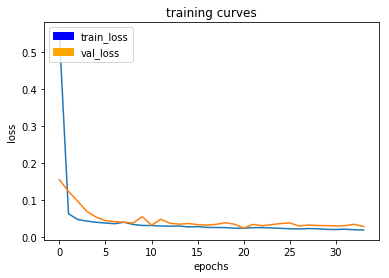

129/129 [==============================] - 49s - loss: 0.0190 - val_loss: 0.0283
Epoch 35/100
128/129 [============================>.] - ETA: 0s - loss: 0.0220

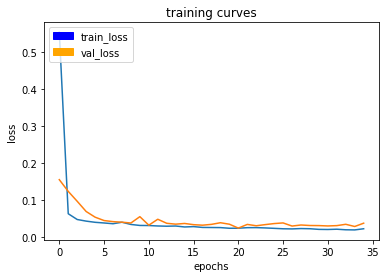

129/129 [==============================] - 49s - loss: 0.0221 - val_loss: 0.0371
Epoch 36/100
128/129 [============================>.] - ETA: 0s - loss: 0.0208

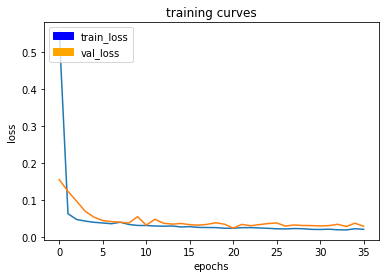

129/129 [==============================] - 49s - loss: 0.0208 - val_loss: 0.0287
Epoch 37/100
128/129 [============================>.] - ETA: 0s - loss: 0.0205

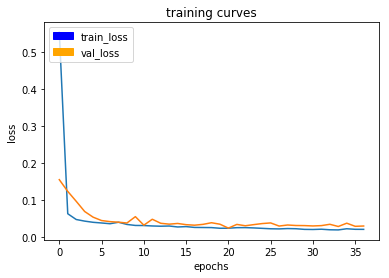

129/129 [==============================] - 49s - loss: 0.0205 - val_loss: 0.0295
Epoch 38/100
128/129 [============================>.] - ETA: 0s - loss: 0.0194

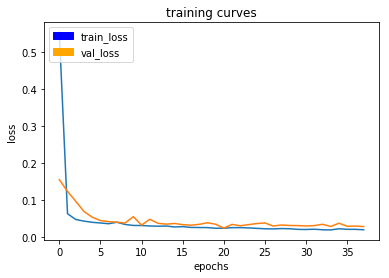

129/129 [==============================] - 49s - loss: 0.0194 - val_loss: 0.0280
Epoch 39/100
128/129 [============================>.] - ETA: 0s - loss: 0.0178

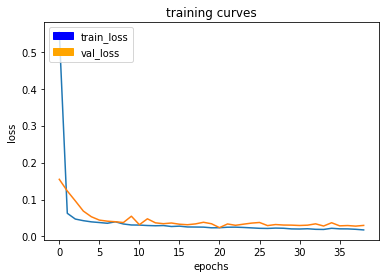

129/129 [==============================] - 49s - loss: 0.0178 - val_loss: 0.0299
Epoch 40/100
128/129 [============================>.] - ETA: 0s - loss: 0.0188

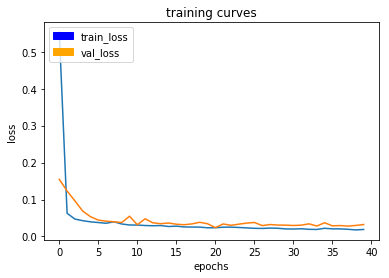

129/129 [==============================] - 49s - loss: 0.0189 - val_loss: 0.0323
Epoch 41/100
128/129 [============================>.] - ETA: 0s - loss: 0.0171

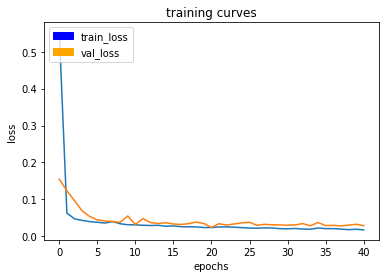

129/129 [==============================] - 49s - loss: 0.0171 - val_loss: 0.0286
Epoch 42/100
128/129 [============================>.] - ETA: 0s - loss: 0.0212

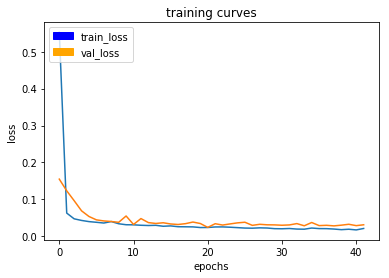

129/129 [==============================] - 49s - loss: 0.0212 - val_loss: 0.0309
Epoch 43/100
128/129 [============================>.] - ETA: 0s - loss: 0.0202

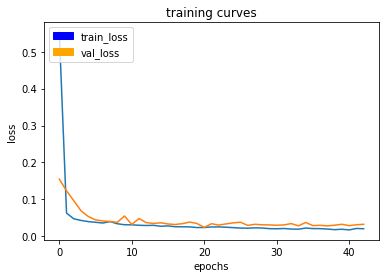

129/129 [==============================] - 49s - loss: 0.0202 - val_loss: 0.0323
Epoch 44/100
128/129 [============================>.] - ETA: 0s - loss: 0.0194

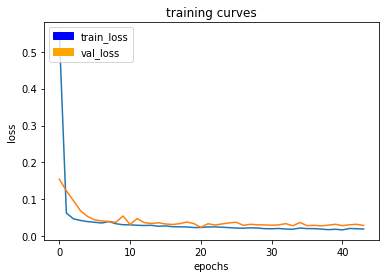

129/129 [==============================] - 49s - loss: 0.0194 - val_loss: 0.0292
Epoch 45/100
128/129 [============================>.] - ETA: 0s - loss: 0.0203

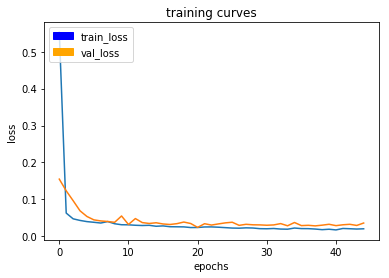

129/129 [==============================] - 49s - loss: 0.0203 - val_loss: 0.0357
Epoch 46/100
128/129 [============================>.] - ETA: 0s - loss: 0.0175

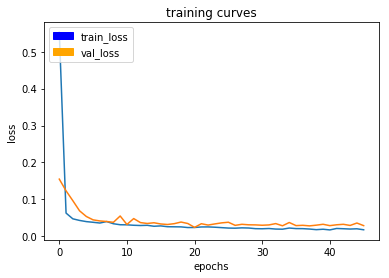

129/129 [==============================] - 49s - loss: 0.0175 - val_loss: 0.0287
Epoch 47/100
128/129 [============================>.] - ETA: 0s - loss: 0.0154

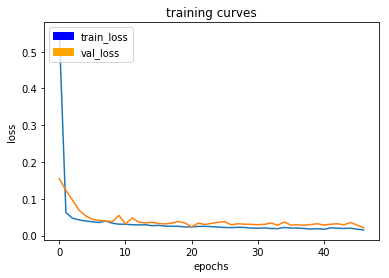

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0214
Epoch 48/100
128/129 [============================>.] - ETA: 0s - loss: 0.0190

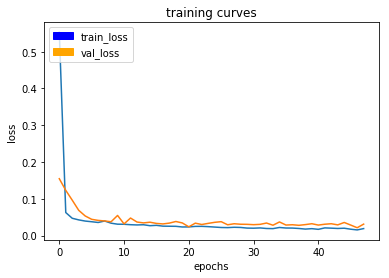

129/129 [==============================] - 49s - loss: 0.0190 - val_loss: 0.0312
Epoch 49/100
128/129 [============================>.] - ETA: 0s - loss: 0.0161

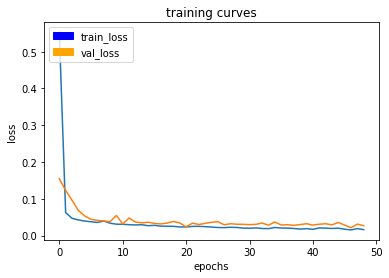

129/129 [==============================] - 49s - loss: 0.0161 - val_loss: 0.0269
Epoch 50/100
128/129 [============================>.] - ETA: 0s - loss: 0.0184

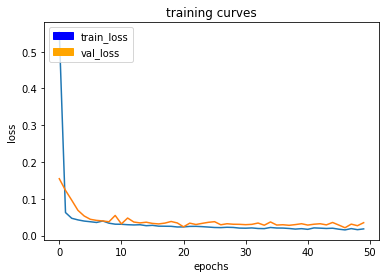

129/129 [==============================] - 49s - loss: 0.0184 - val_loss: 0.0351
Epoch 51/100
128/129 [============================>.] - ETA: 0s - loss: 0.0167

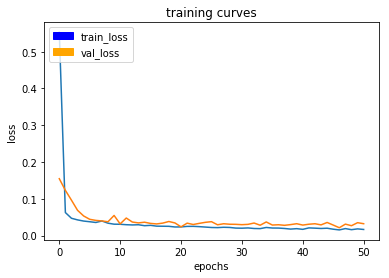

129/129 [==============================] - 49s - loss: 0.0167 - val_loss: 0.0323
Epoch 52/100
128/129 [============================>.] - ETA: 0s - loss: 0.0174

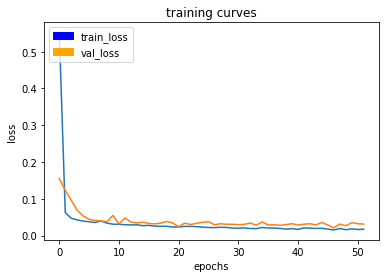

129/129 [==============================] - 49s - loss: 0.0174 - val_loss: 0.0314
Epoch 53/100
128/129 [============================>.] - ETA: 0s - loss: 0.0160

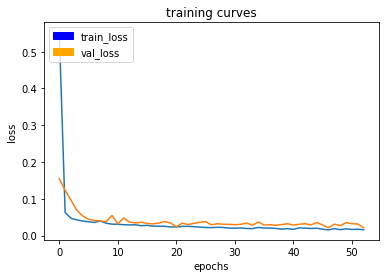

129/129 [==============================] - 49s - loss: 0.0160 - val_loss: 0.0216
Epoch 54/100
128/129 [============================>.] - ETA: 0s - loss: 0.0163

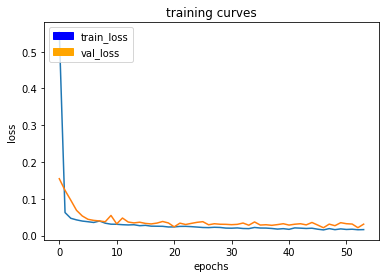

129/129 [==============================] - 49s - loss: 0.0163 - val_loss: 0.0311
Epoch 55/100
128/129 [============================>.] - ETA: 0s - loss: 0.0163

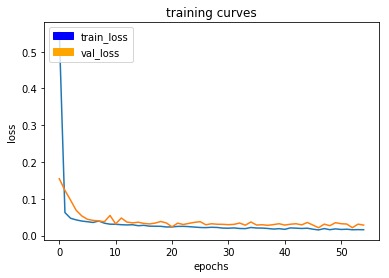

129/129 [==============================] - 49s - loss: 0.0162 - val_loss: 0.0285
Epoch 56/100
128/129 [============================>.] - ETA: 0s - loss: 0.0172

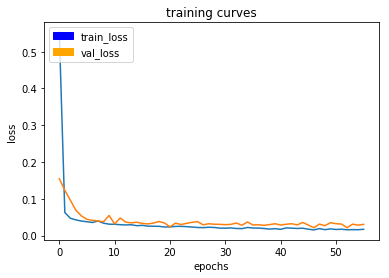

129/129 [==============================] - 49s - loss: 0.0172 - val_loss: 0.0306
Epoch 57/100
128/129 [============================>.] - ETA: 0s - loss: 0.0157

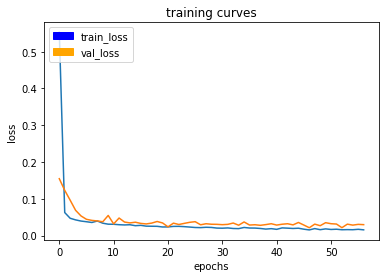

129/129 [==============================] - 49s - loss: 0.0157 - val_loss: 0.0298
Epoch 58/100
128/129 [============================>.] - ETA: 0s - loss: 0.0147

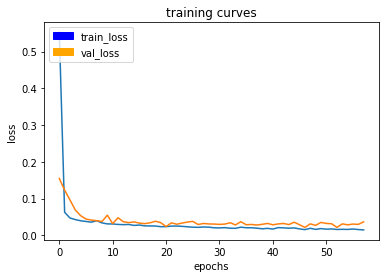

129/129 [==============================] - 49s - loss: 0.0147 - val_loss: 0.0366
Epoch 59/100
128/129 [============================>.] - ETA: 0s - loss: 0.0155

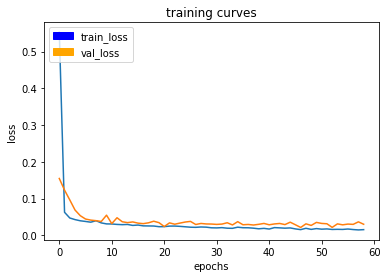

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0301
Epoch 60/100
128/129 [============================>.] - ETA: 0s - loss: 0.0151

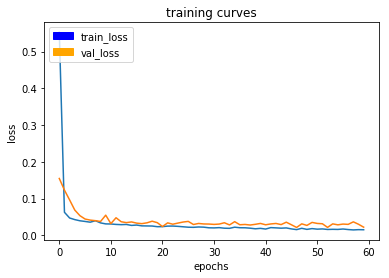

129/129 [==============================] - 49s - loss: 0.0152 - val_loss: 0.0221
Epoch 61/100
128/129 [============================>.] - ETA: 0s - loss: 0.0140

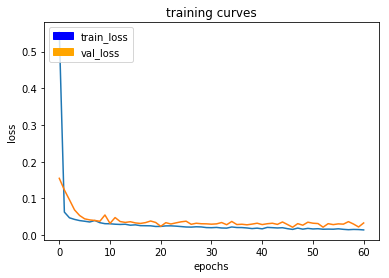

129/129 [==============================] - 49s - loss: 0.0141 - val_loss: 0.0330
Epoch 62/100
128/129 [============================>.] - ETA: 0s - loss: 0.0168

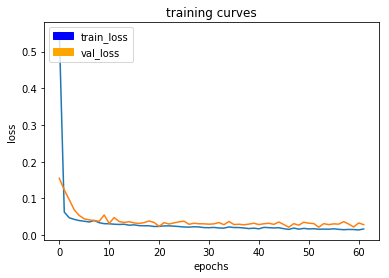

129/129 [==============================] - 49s - loss: 0.0168 - val_loss: 0.0284
Epoch 63/100
128/129 [============================>.] - ETA: 0s - loss: 0.0159

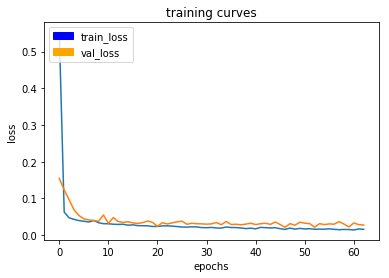

129/129 [==============================] - 49s - loss: 0.0159 - val_loss: 0.0274
Epoch 64/100
128/129 [============================>.] - ETA: 0s - loss: 0.0142

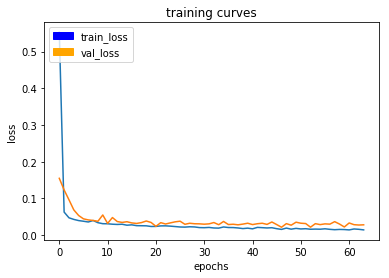

129/129 [==============================] - 49s - loss: 0.0142 - val_loss: 0.0280
Epoch 65/100
128/129 [============================>.] - ETA: 0s - loss: 0.0143

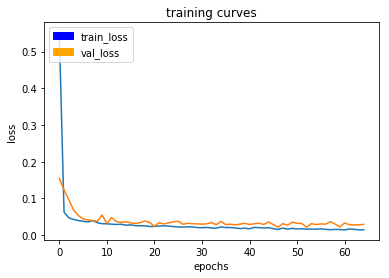

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0291
Epoch 66/100
128/129 [============================>.] - ETA: 0s - loss: 0.0143

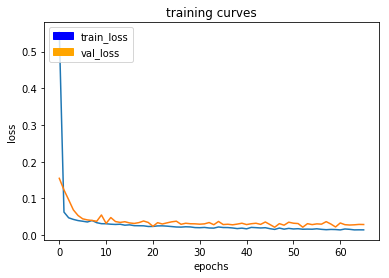

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0288
Epoch 67/100
128/129 [============================>.] - ETA: 0s - loss: 0.0145

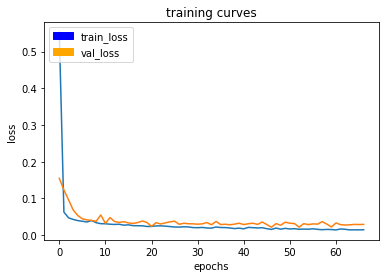

129/129 [==============================] - 49s - loss: 0.0145 - val_loss: 0.0291
Epoch 68/100
128/129 [============================>.] - ETA: 0s - loss: 0.0158

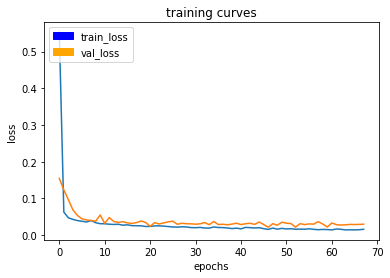

129/129 [==============================] - 49s - loss: 0.0158 - val_loss: 0.0297
Epoch 69/100
128/129 [============================>.] - ETA: 0s - loss: 0.0157

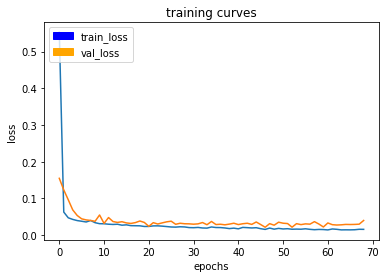

129/129 [==============================] - 49s - loss: 0.0157 - val_loss: 0.0398
Epoch 70/100
128/129 [============================>.] - ETA: 0s - loss: 0.0142

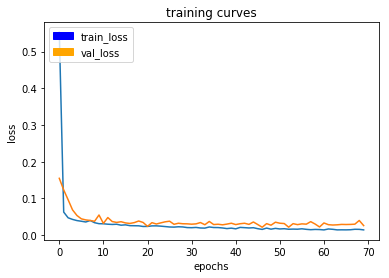

129/129 [==============================] - 49s - loss: 0.0142 - val_loss: 0.0259
Epoch 71/100
128/129 [============================>.] - ETA: 0s - loss: 0.0183

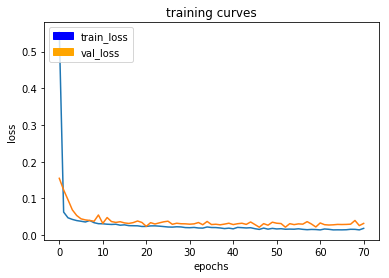

129/129 [==============================] - 49s - loss: 0.0183 - val_loss: 0.0318
Epoch 72/100
128/129 [============================>.] - ETA: 0s - loss: 0.0146

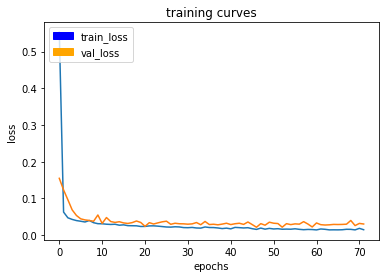

129/129 [==============================] - 49s - loss: 0.0146 - val_loss: 0.0302
Epoch 73/100
128/129 [============================>.] - ETA: 0s - loss: 0.0134

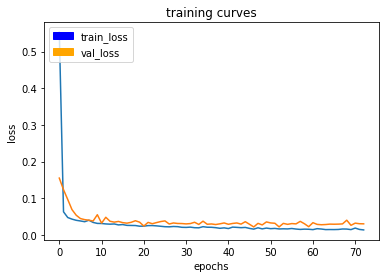

129/129 [==============================] - 49s - loss: 0.0134 - val_loss: 0.0299
Epoch 74/100
128/129 [============================>.] - ETA: 0s - loss: 0.0128

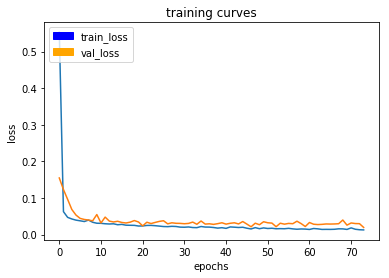

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0196
Epoch 75/100
128/129 [============================>.] - ETA: 0s - loss: 0.0131

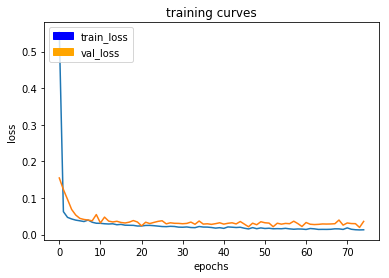

129/129 [==============================] - 49s - loss: 0.0131 - val_loss: 0.0361
Epoch 76/100
128/129 [============================>.] - ETA: 0s - loss: 0.0127

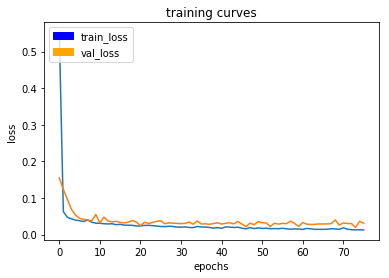

129/129 [==============================] - 49s - loss: 0.0127 - val_loss: 0.0307
Epoch 77/100
128/129 [============================>.] - ETA: 0s - loss: 0.0139

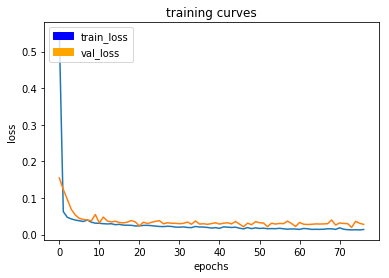

129/129 [==============================] - 49s - loss: 0.0139 - val_loss: 0.0279
Epoch 78/100
128/129 [============================>.] - ETA: 0s - loss: 0.0124

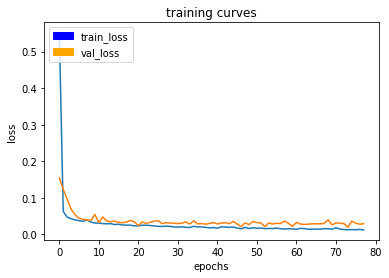

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0294
Epoch 79/100
128/129 [============================>.] - ETA: 0s - loss: 0.0145

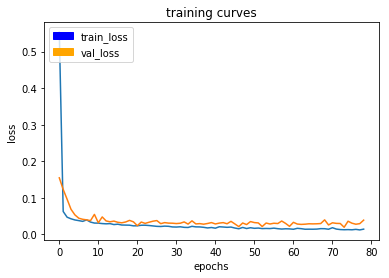

129/129 [==============================] - 49s - loss: 0.0145 - val_loss: 0.0390
Epoch 80/100
128/129 [============================>.] - ETA: 0s - loss: 0.0138

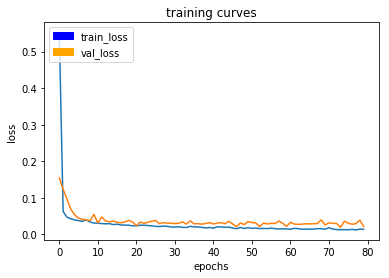

129/129 [==============================] - 49s - loss: 0.0138 - val_loss: 0.0217
Epoch 81/100
128/129 [============================>.] - ETA: 0s - loss: 0.0139

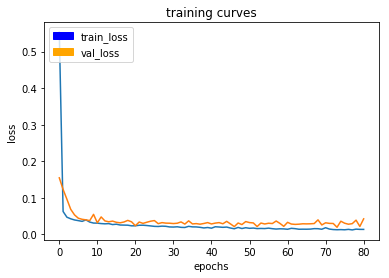

129/129 [==============================] - 49s - loss: 0.0139 - val_loss: 0.0426
Epoch 82/100
128/129 [============================>.] - ETA: 0s - loss: 0.0127

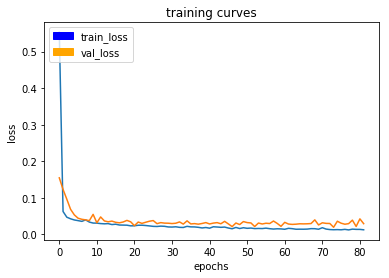

129/129 [==============================] - 49s - loss: 0.0127 - val_loss: 0.0294
Epoch 83/100
128/129 [============================>.] - ETA: 0s - loss: 0.0138

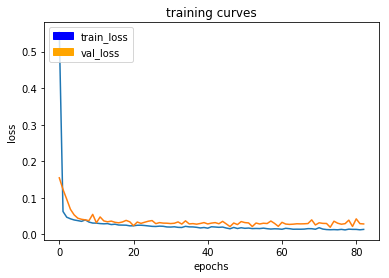

129/129 [==============================] - 49s - loss: 0.0138 - val_loss: 0.0287
Epoch 84/100
128/129 [============================>.] - ETA: 0s - loss: 0.0143

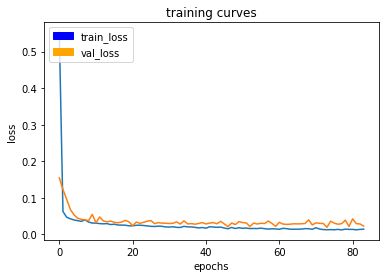

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0228
Epoch 85/100
128/129 [============================>.] - ETA: 0s - loss: 0.0128

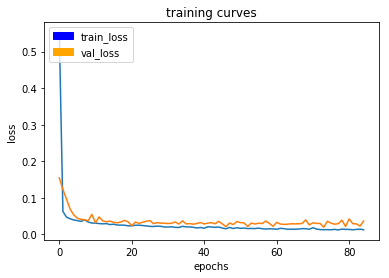

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0367
Epoch 86/100
128/129 [============================>.] - ETA: 0s - loss: 0.0164

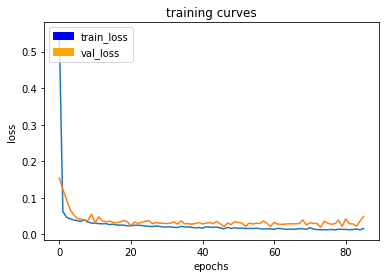

129/129 [==============================] - 49s - loss: 0.0164 - val_loss: 0.0491
Epoch 87/100
128/129 [============================>.] - ETA: 0s - loss: 0.0150

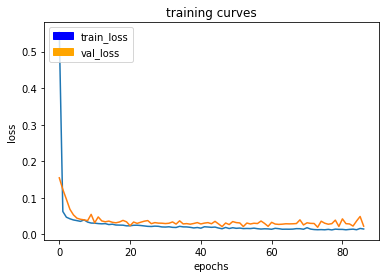

129/129 [==============================] - 49s - loss: 0.0150 - val_loss: 0.0226
Epoch 88/100
128/129 [============================>.] - ETA: 0s - loss: 0.0143

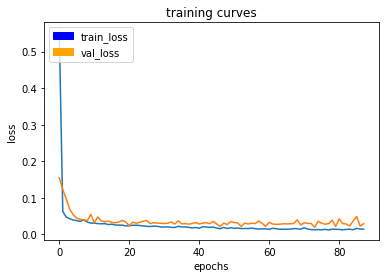

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0297
Epoch 89/100
128/129 [============================>.] - ETA: 0s - loss: 0.0129

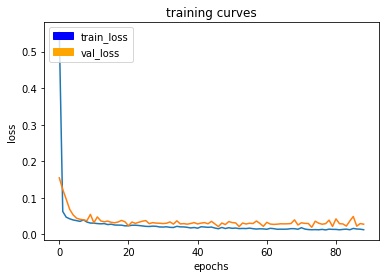

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0280
Epoch 90/100
128/129 [============================>.] - ETA: 0s - loss: 0.0122

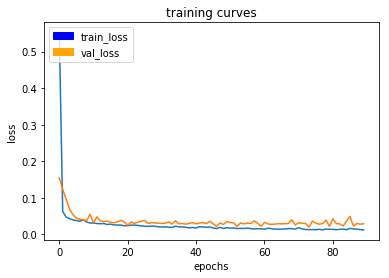

129/129 [==============================] - 49s - loss: 0.0122 - val_loss: 0.0289
Epoch 91/100
128/129 [============================>.] - ETA: 0s - loss: 0.0118

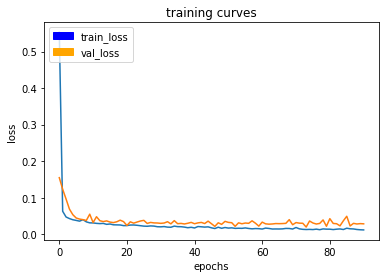

129/129 [==============================] - 49s - loss: 0.0118 - val_loss: 0.0284
Epoch 92/100
128/129 [============================>.] - ETA: 0s - loss: 0.0126

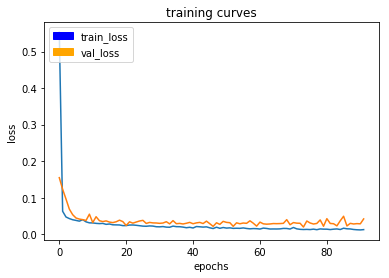

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0418
Epoch 93/100
128/129 [============================>.] - ETA: 0s - loss: 0.0131

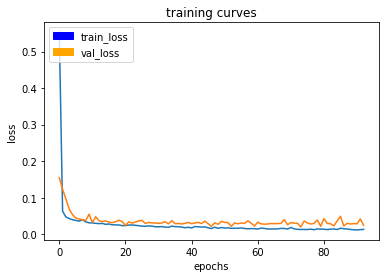

129/129 [==============================] - 49s - loss: 0.0131 - val_loss: 0.0241
Epoch 94/100
128/129 [============================>.] - ETA: 0s - loss: 0.0153

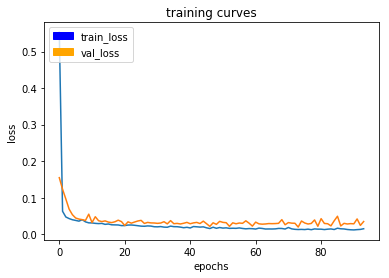

129/129 [==============================] - 49s - loss: 0.0153 - val_loss: 0.0347
Epoch 95/100
128/129 [============================>.] - ETA: 0s - loss: 0.0159

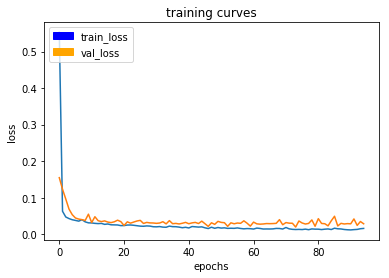

129/129 [==============================] - 49s - loss: 0.0159 - val_loss: 0.0285
Epoch 96/100
128/129 [============================>.] - ETA: 0s - loss: 0.0129

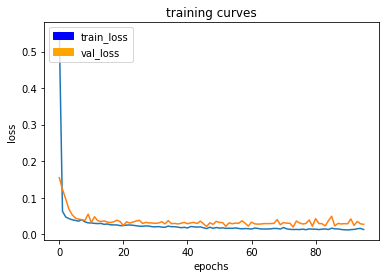

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0270
Epoch 97/100
128/129 [============================>.] - ETA: 0s - loss: 0.0139

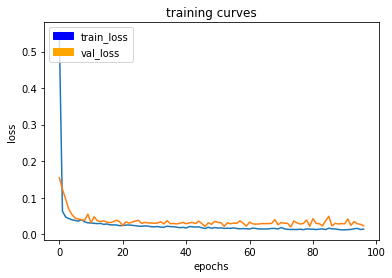

129/129 [==============================] - 50s - loss: 0.0139 - val_loss: 0.0231
Epoch 98/100
128/129 [============================>.] - ETA: 0s - loss: 0.0126

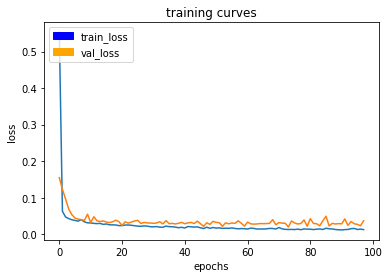

129/129 [==============================] - 50s - loss: 0.0126 - val_loss: 0.0368
Epoch 99/100
128/129 [============================>.] - ETA: 0s - loss: 0.0123

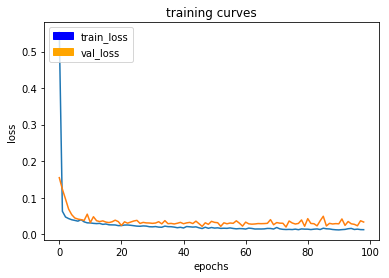

129/129 [==============================] - 51s - loss: 0.0124 - val_loss: 0.0333
Epoch 100/100
128/129 [============================>.] - ETA: 0s - loss: 0.0118

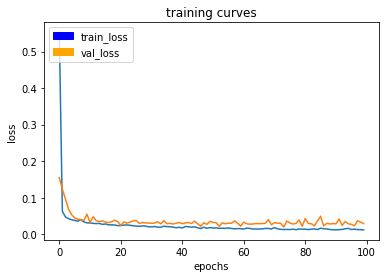

129/129 [==============================] - 49s - loss: 0.0118 - val_loss: 0.0289
TESTING NUM EPOCHS:  150
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/150
128/129 [============================>.] - ETA: 0s - loss: 0.4944

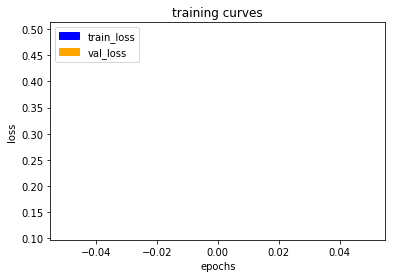

129/129 [==============================] - 51s - loss: 0.4913 - val_loss: 0.1163
Epoch 2/150
128/129 [============================>.] - ETA: 0s - loss: 0.0569

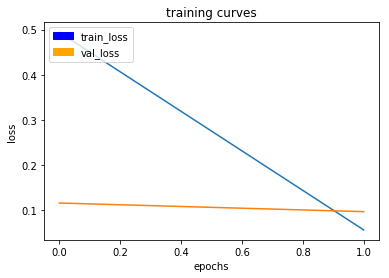

129/129 [==============================] - 50s - loss: 0.0568 - val_loss: 0.0972
Epoch 3/150
128/129 [============================>.] - ETA: 0s - loss: 0.0452

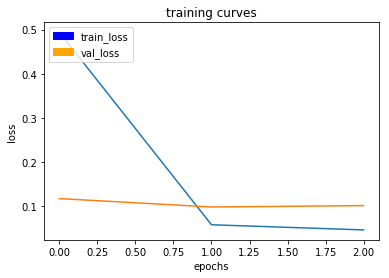

129/129 [==============================] - 49s - loss: 0.0452 - val_loss: 0.1003
Epoch 4/150
128/129 [============================>.] - ETA: 0s - loss: 0.0424

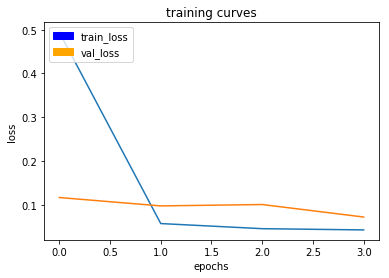

129/129 [==============================] - 49s - loss: 0.0424 - val_loss: 0.0717
Epoch 5/150
128/129 [============================>.] - ETA: 0s - loss: 0.0358

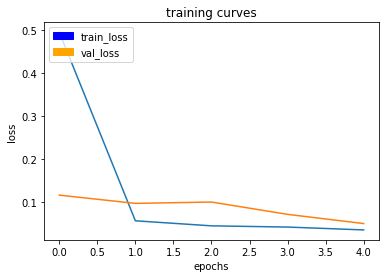

129/129 [==============================] - 49s - loss: 0.0358 - val_loss: 0.0504
Epoch 6/150
128/129 [============================>.] - ETA: 0s - loss: 0.0358

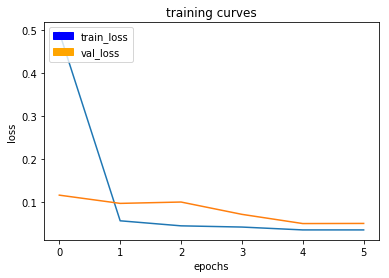

129/129 [==============================] - 49s - loss: 0.0358 - val_loss: 0.0507
Epoch 7/150
128/129 [============================>.] - ETA: 0s - loss: 0.0330

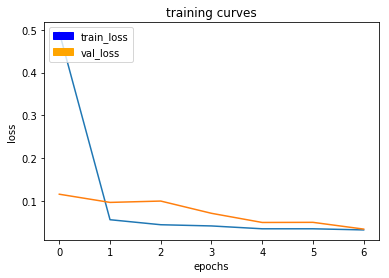

129/129 [==============================] - 50s - loss: 0.0331 - val_loss: 0.0349
Epoch 8/150
128/129 [============================>.] - ETA: 0s - loss: 0.0316

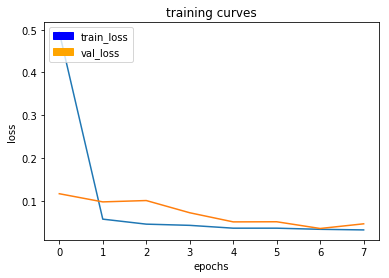

129/129 [==============================] - 49s - loss: 0.0316 - val_loss: 0.0459
Epoch 9/150
128/129 [============================>.] - ETA: 0s - loss: 0.0315

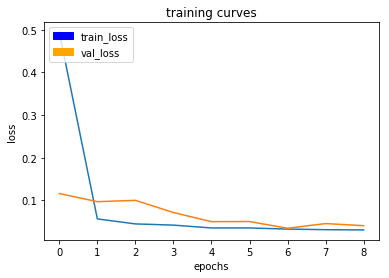

129/129 [==============================] - 49s - loss: 0.0314 - val_loss: 0.0410
Epoch 10/150
128/129 [============================>.] - ETA: 0s - loss: 0.0294

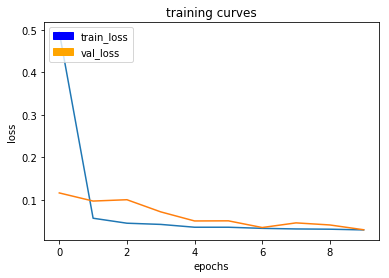

129/129 [==============================] - 49s - loss: 0.0294 - val_loss: 0.0297
Epoch 11/150
128/129 [============================>.] - ETA: 0s - loss: 0.0287

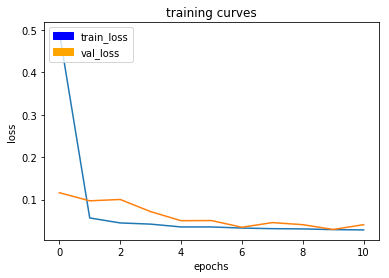

129/129 [==============================] - 49s - loss: 0.0288 - val_loss: 0.0410
Epoch 12/150
128/129 [============================>.] - ETA: 0s - loss: 0.0262

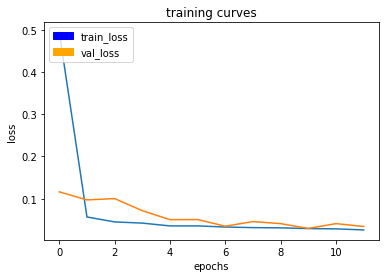

129/129 [==============================] - 49s - loss: 0.0262 - val_loss: 0.0344
Epoch 13/150
128/129 [============================>.] - ETA: 0s - loss: 0.0280

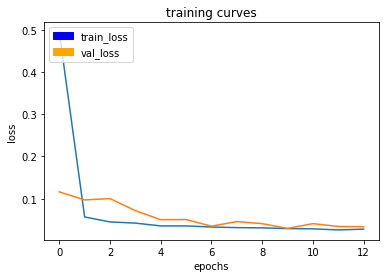

129/129 [==============================] - 49s - loss: 0.0279 - val_loss: 0.0336
Epoch 14/150
128/129 [============================>.] - ETA: 0s - loss: 0.0250

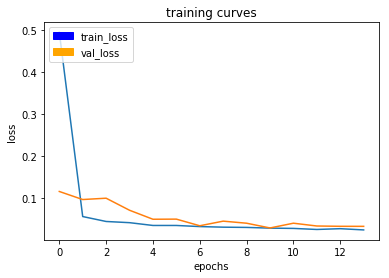

129/129 [==============================] - 49s - loss: 0.0250 - val_loss: 0.0335
Epoch 15/150
128/129 [============================>.] - ETA: 0s - loss: 0.0259

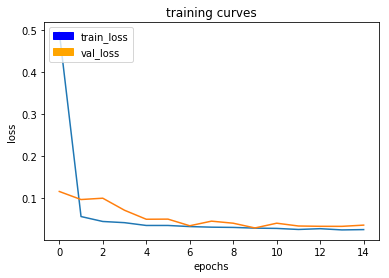

129/129 [==============================] - 49s - loss: 0.0259 - val_loss: 0.0364
Epoch 16/150
128/129 [============================>.] - ETA: 0s - loss: 0.0240

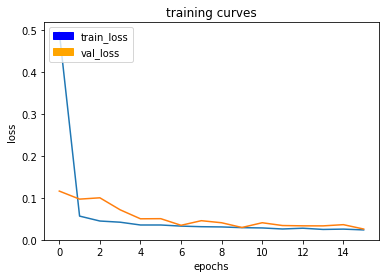

129/129 [==============================] - 49s - loss: 0.0240 - val_loss: 0.0260
Epoch 17/150
128/129 [============================>.] - ETA: 0s - loss: 0.0246

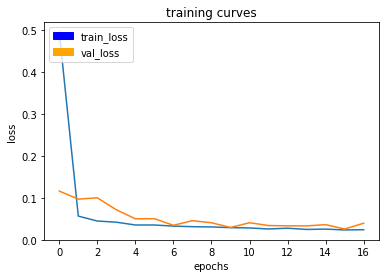

129/129 [==============================] - 49s - loss: 0.0246 - val_loss: 0.0399
Epoch 18/150
128/129 [============================>.] - ETA: 0s - loss: 0.0232

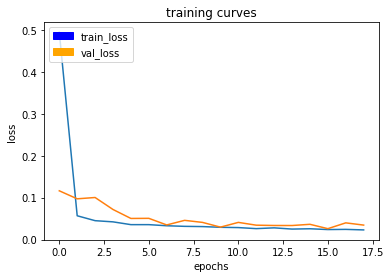

129/129 [==============================] - 49s - loss: 0.0231 - val_loss: 0.0346
Epoch 19/150
128/129 [============================>.] - ETA: 0s - loss: 0.0244

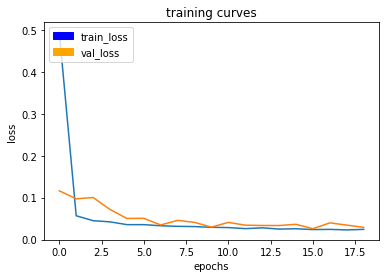

129/129 [==============================] - 49s - loss: 0.0244 - val_loss: 0.0291
Epoch 20/150
128/129 [============================>.] - ETA: 0s - loss: 0.0233

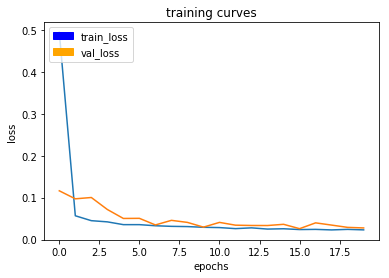

129/129 [==============================] - 49s - loss: 0.0232 - val_loss: 0.0278
Epoch 21/150
128/129 [============================>.] - ETA: 0s - loss: 0.0213

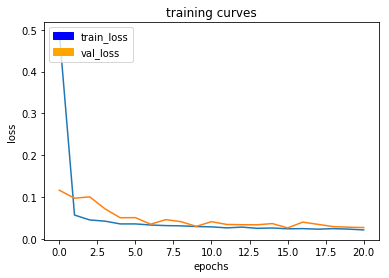

129/129 [==============================] - 50s - loss: 0.0213 - val_loss: 0.0269
Epoch 22/150
128/129 [============================>.] - ETA: 0s - loss: 0.0223

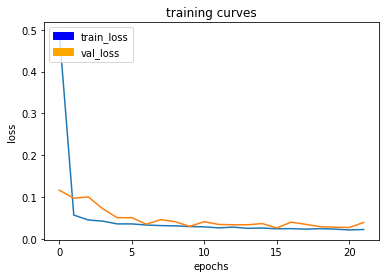

129/129 [==============================] - 49s - loss: 0.0222 - val_loss: 0.0391
Epoch 23/150
128/129 [============================>.] - ETA: 0s - loss: 0.0216

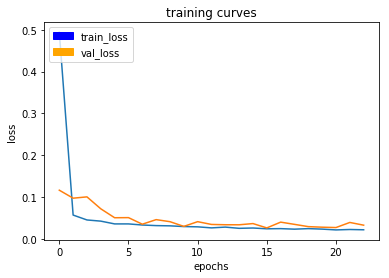

129/129 [==============================] - 49s - loss: 0.0216 - val_loss: 0.0326
Epoch 24/150
128/129 [============================>.] - ETA: 0s - loss: 0.0214

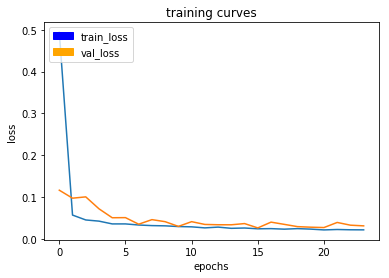

129/129 [==============================] - 49s - loss: 0.0214 - val_loss: 0.0310
Epoch 25/150
128/129 [============================>.] - ETA: 0s - loss: 0.0207

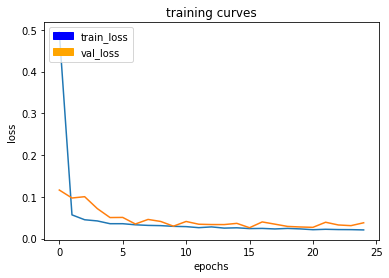

129/129 [==============================] - 49s - loss: 0.0207 - val_loss: 0.0379
Epoch 26/150
128/129 [============================>.] - ETA: 0s - loss: 0.0218

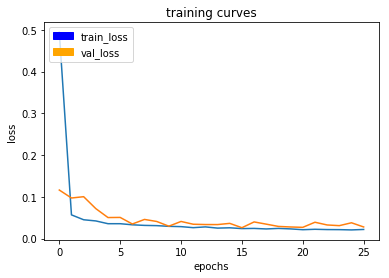

129/129 [==============================] - 49s - loss: 0.0218 - val_loss: 0.0278
Epoch 27/150
128/129 [============================>.] - ETA: 0s - loss: 0.0225

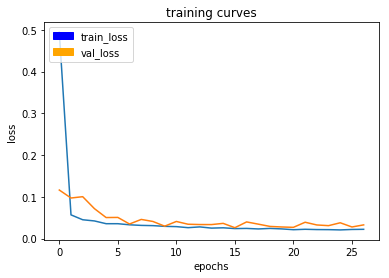

129/129 [==============================] - 49s - loss: 0.0224 - val_loss: 0.0328
Epoch 28/150
128/129 [============================>.] - ETA: 0s - loss: 0.0196

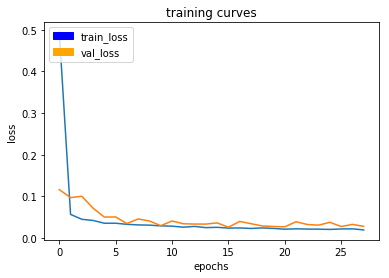

129/129 [==============================] - 49s - loss: 0.0195 - val_loss: 0.0282
Epoch 29/150
128/129 [============================>.] - ETA: 0s - loss: 0.0195

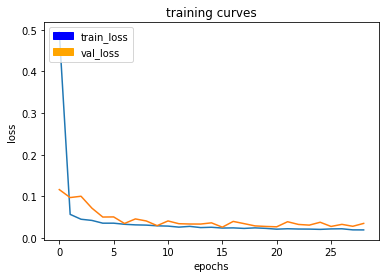

129/129 [==============================] - 49s - loss: 0.0195 - val_loss: 0.0351
Epoch 30/150
128/129 [============================>.] - ETA: 0s - loss: 0.0209

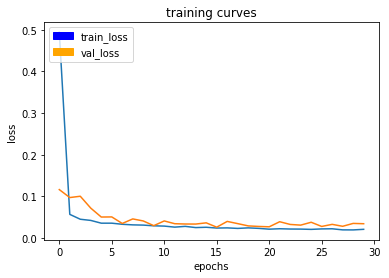

129/129 [==============================] - 49s - loss: 0.0209 - val_loss: 0.0343
Epoch 31/150
128/129 [============================>.] - ETA: 0s - loss: 0.0184

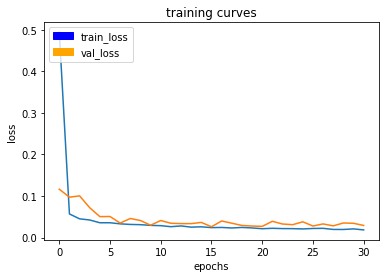

129/129 [==============================] - 49s - loss: 0.0184 - val_loss: 0.0291
Epoch 32/150
128/129 [============================>.] - ETA: 0s - loss: 0.0182

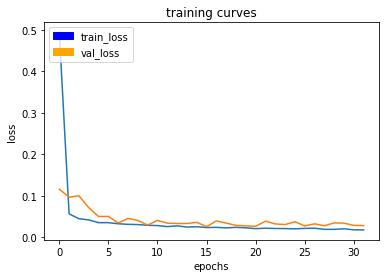

129/129 [==============================] - 49s - loss: 0.0181 - val_loss: 0.0285
Epoch 33/150
128/129 [============================>.] - ETA: 0s - loss: 0.0211

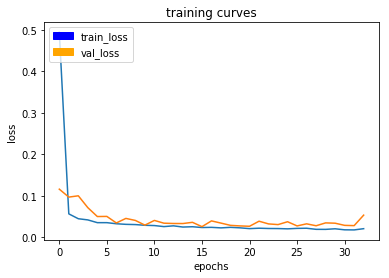

129/129 [==============================] - 49s - loss: 0.0212 - val_loss: 0.0537
Epoch 34/150
128/129 [============================>.] - ETA: 0s - loss: 0.0195

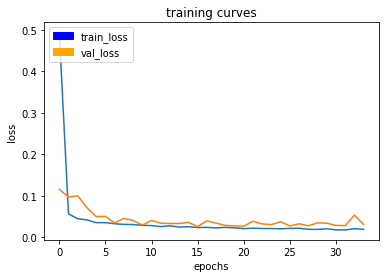

129/129 [==============================] - 49s - loss: 0.0195 - val_loss: 0.0312
Epoch 35/150
128/129 [============================>.] - ETA: 0s - loss: 0.0194

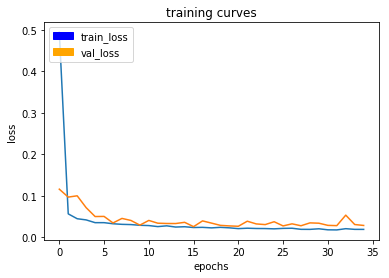

129/129 [==============================] - 49s - loss: 0.0194 - val_loss: 0.0289
Epoch 36/150
128/129 [============================>.] - ETA: 0s - loss: 0.0184

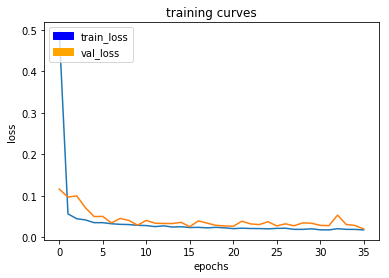

129/129 [==============================] - 49s - loss: 0.0184 - val_loss: 0.0207
Epoch 37/150
128/129 [============================>.] - ETA: 0s - loss: 0.0179

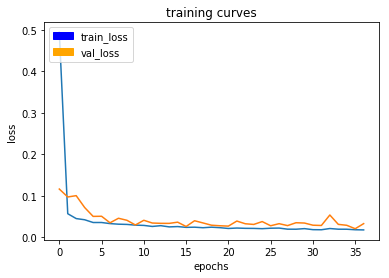

129/129 [==============================] - 49s - loss: 0.0178 - val_loss: 0.0329
Epoch 38/150
128/129 [============================>.] - ETA: 0s - loss: 0.0174

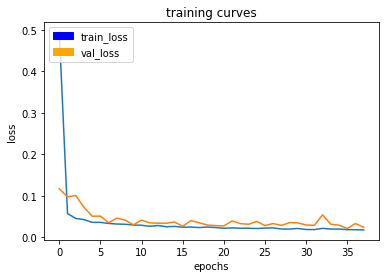

129/129 [==============================] - 49s - loss: 0.0174 - val_loss: 0.0236
Epoch 39/150
128/129 [============================>.] - ETA: 0s - loss: 0.0171

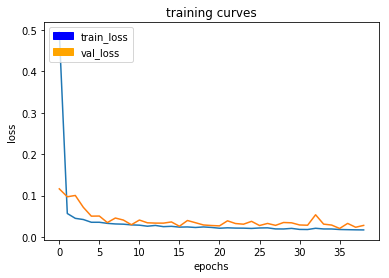

129/129 [==============================] - 49s - loss: 0.0172 - val_loss: 0.0281
Epoch 40/150
128/129 [============================>.] - ETA: 0s - loss: 0.0174

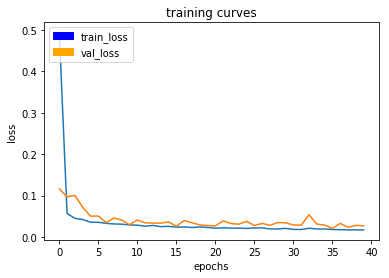

129/129 [==============================] - 49s - loss: 0.0173 - val_loss: 0.0270
Epoch 41/150
128/129 [============================>.] - ETA: 0s - loss: 0.0159

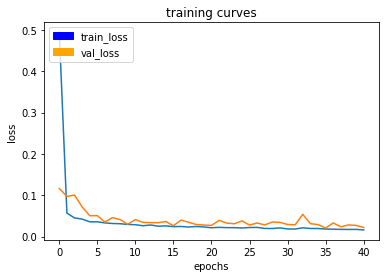

129/129 [==============================] - 49s - loss: 0.0160 - val_loss: 0.0219
Epoch 42/150
128/129 [============================>.] - ETA: 0s - loss: 0.0161

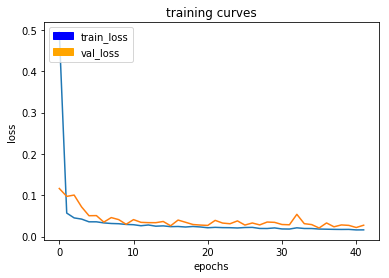

129/129 [==============================] - 49s - loss: 0.0161 - val_loss: 0.0274
Epoch 43/150
128/129 [============================>.] - ETA: 0s - loss: 0.0151

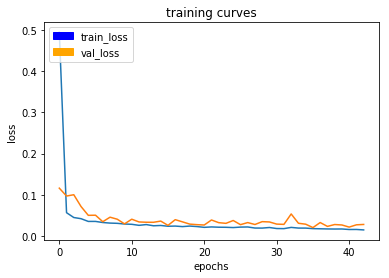

129/129 [==============================] - 50s - loss: 0.0151 - val_loss: 0.0283
Epoch 44/150
128/129 [============================>.] - ETA: 0s - loss: 0.0189

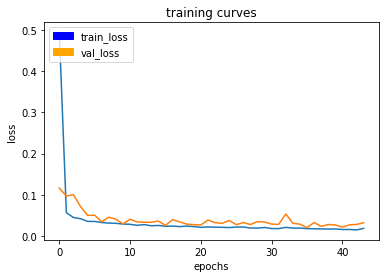

129/129 [==============================] - 49s - loss: 0.0189 - val_loss: 0.0324
Epoch 45/150
128/129 [============================>.] - ETA: 0s - loss: 0.0170

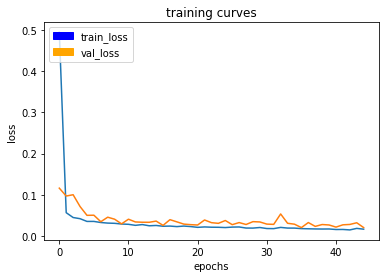

129/129 [==============================] - 49s - loss: 0.0170 - val_loss: 0.0207
Epoch 46/150
128/129 [============================>.] - ETA: 0s - loss: 0.0154

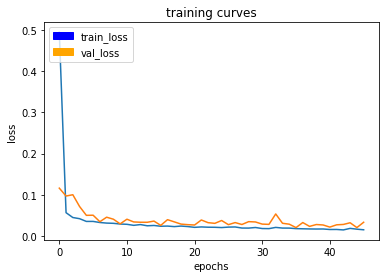

129/129 [==============================] - 49s - loss: 0.0154 - val_loss: 0.0336
Epoch 47/150
128/129 [============================>.] - ETA: 0s - loss: 0.0166

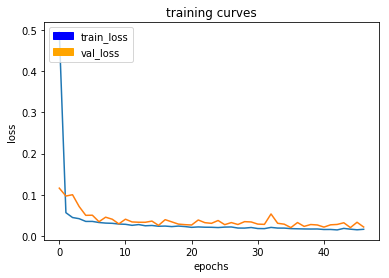

129/129 [==============================] - 49s - loss: 0.0166 - val_loss: 0.0221
Epoch 48/150
128/129 [============================>.] - ETA: 0s - loss: 0.0182

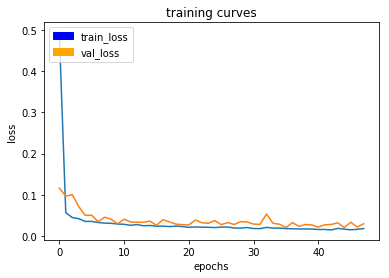

129/129 [==============================] - 49s - loss: 0.0182 - val_loss: 0.0300
Epoch 49/150
128/129 [============================>.] - ETA: 0s - loss: 0.0156

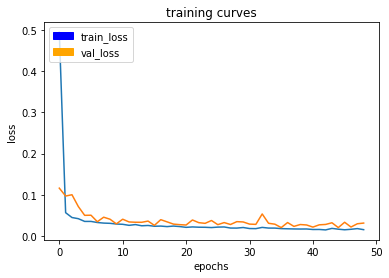

129/129 [==============================] - 49s - loss: 0.0156 - val_loss: 0.0316
Epoch 50/150
128/129 [============================>.] - ETA: 0s - loss: 0.0166

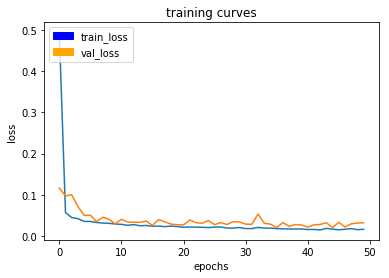

129/129 [==============================] - 49s - loss: 0.0166 - val_loss: 0.0325
Epoch 51/150
128/129 [============================>.] - ETA: 0s - loss: 0.0152

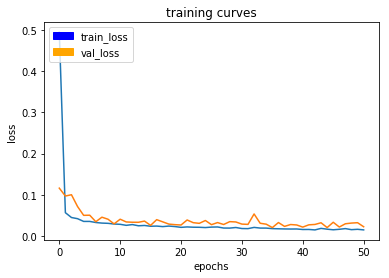

129/129 [==============================] - 49s - loss: 0.0152 - val_loss: 0.0227
Epoch 52/150
128/129 [============================>.] - ETA: 0s - loss: 0.0151

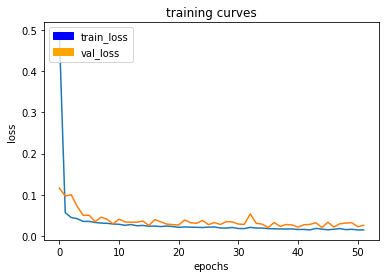

129/129 [==============================] - 49s - loss: 0.0151 - val_loss: 0.0263
Epoch 53/150
128/129 [============================>.] - ETA: 0s - loss: 0.0166

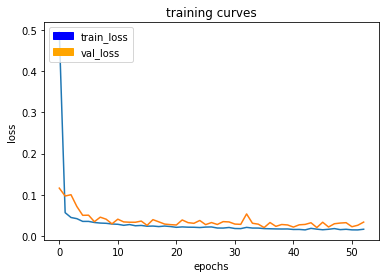

129/129 [==============================] - 49s - loss: 0.0166 - val_loss: 0.0339
Epoch 54/150
128/129 [============================>.] - ETA: 0s - loss: 0.0151

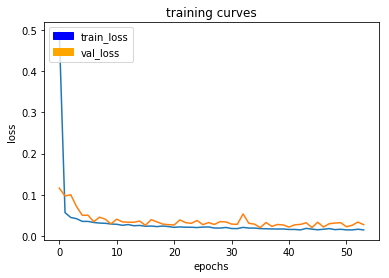

129/129 [==============================] - 49s - loss: 0.0151 - val_loss: 0.0277
Epoch 55/150
128/129 [============================>.] - ETA: 0s - loss: 0.0152

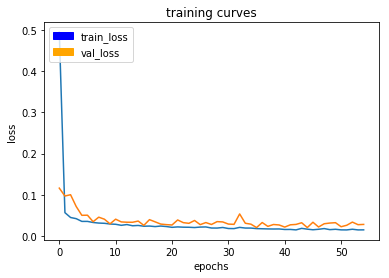

129/129 [==============================] - 49s - loss: 0.0152 - val_loss: 0.0283
Epoch 56/150
128/129 [============================>.] - ETA: 0s - loss: 0.0141

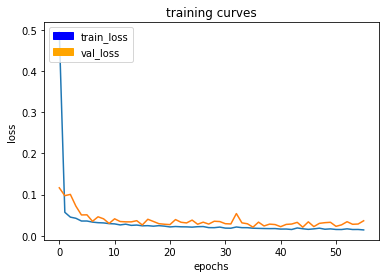

129/129 [==============================] - 49s - loss: 0.0141 - val_loss: 0.0362
Epoch 57/150
128/129 [============================>.] - ETA: 0s - loss: 0.0148

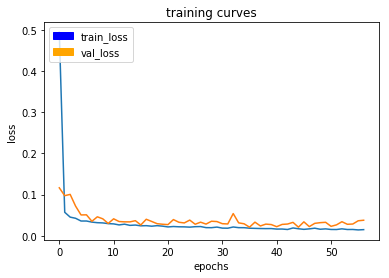

129/129 [==============================] - 49s - loss: 0.0148 - val_loss: 0.0375
Epoch 58/150
128/129 [============================>.] - ETA: 0s - loss: 0.0143

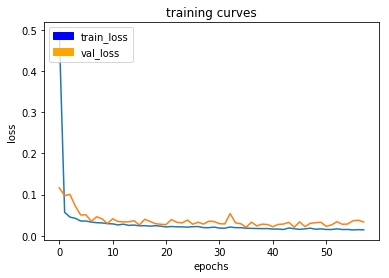

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0331
Epoch 59/150
128/129 [============================>.] - ETA: 0s - loss: 0.0145

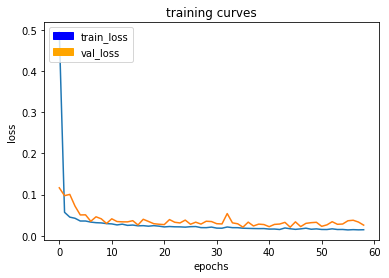

129/129 [==============================] - 49s - loss: 0.0144 - val_loss: 0.0256
Epoch 60/150
128/129 [============================>.] - ETA: 0s - loss: 0.0180

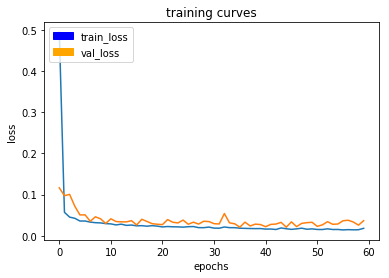

129/129 [==============================] - 49s - loss: 0.0180 - val_loss: 0.0364
Epoch 61/150
128/129 [============================>.] - ETA: 0s - loss: 0.0162

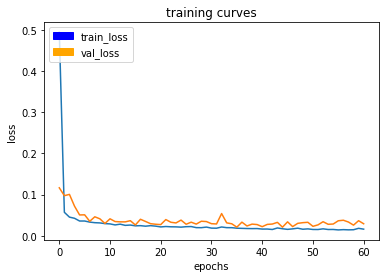

129/129 [==============================] - 49s - loss: 0.0162 - val_loss: 0.0290
Epoch 62/150
128/129 [============================>.] - ETA: 0s - loss: 0.0150

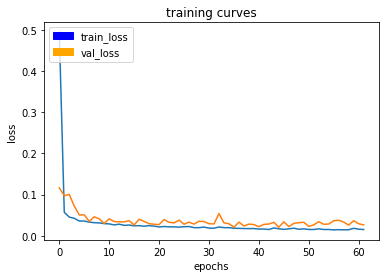

129/129 [==============================] - 49s - loss: 0.0150 - val_loss: 0.0262
Epoch 63/150
128/129 [============================>.] - ETA: 0s - loss: 0.0143

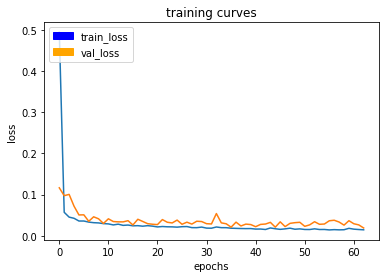

129/129 [==============================] - 49s - loss: 0.0142 - val_loss: 0.0187
Epoch 64/150
128/129 [============================>.] - ETA: 0s - loss: 0.0137

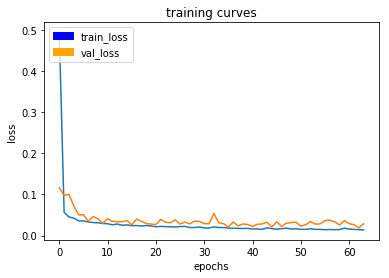

129/129 [==============================] - 49s - loss: 0.0137 - val_loss: 0.0285
Epoch 65/150
128/129 [============================>.] - ETA: 0s - loss: 0.0160

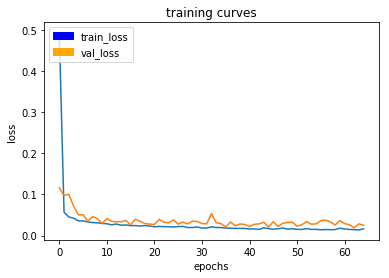

129/129 [==============================] - 49s - loss: 0.0163 - val_loss: 0.0248
Epoch 66/150
128/129 [============================>.] - ETA: 0s - loss: 0.0144

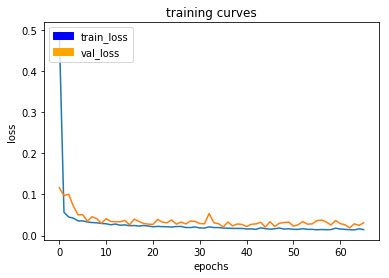

129/129 [==============================] - 49s - loss: 0.0144 - val_loss: 0.0309
Epoch 67/150
128/129 [============================>.] - ETA: 0s - loss: 0.0137

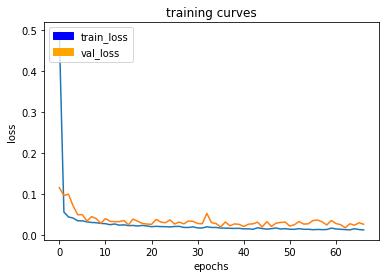

129/129 [==============================] - 49s - loss: 0.0137 - val_loss: 0.0273
Epoch 68/150
128/129 [============================>.] - ETA: 0s - loss: 0.0143

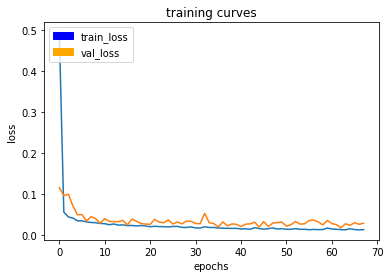

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0299
Epoch 69/150
128/129 [============================>.] - ETA: 0s - loss: 0.0155

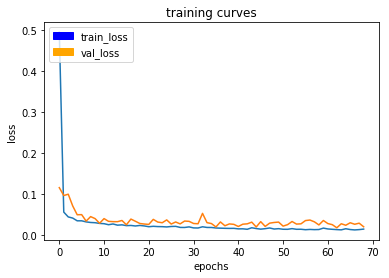

129/129 [==============================] - 49s - loss: 0.0154 - val_loss: 0.0212
Epoch 70/150
128/129 [============================>.] - ETA: 0s - loss: 0.0148

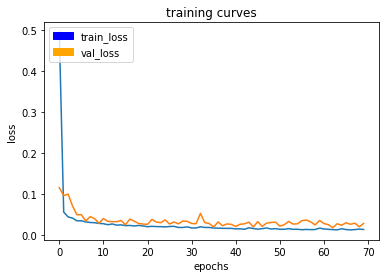

129/129 [==============================] - 49s - loss: 0.0148 - val_loss: 0.0292
Epoch 71/150
128/129 [============================>.] - ETA: 0s - loss: 0.0147

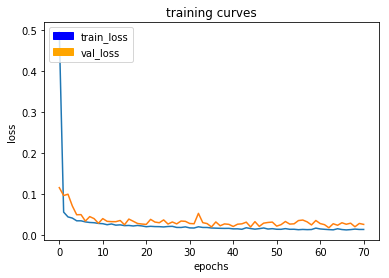

129/129 [==============================] - 49s - loss: 0.0147 - val_loss: 0.0269
Epoch 72/150
128/129 [============================>.] - ETA: 0s - loss: 0.0128

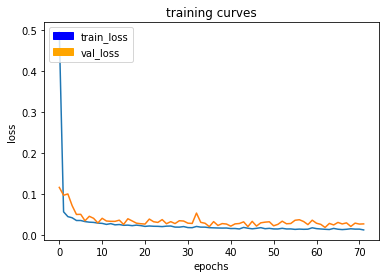

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0274
Epoch 73/150
128/129 [============================>.] - ETA: 0s - loss: 0.0134

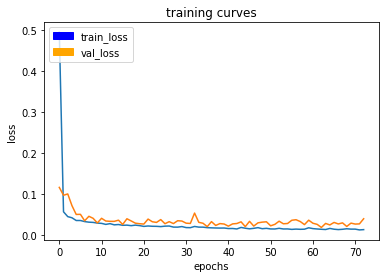

129/129 [==============================] - 49s - loss: 0.0134 - val_loss: 0.0399
Epoch 74/150
128/129 [============================>.] - ETA: 0s - loss: 0.0146

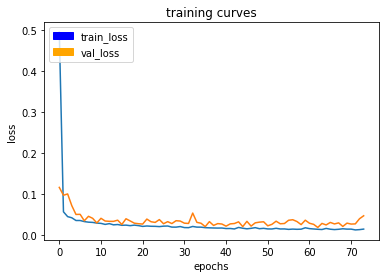

129/129 [==============================] - 49s - loss: 0.0147 - val_loss: 0.0471
Epoch 75/150
128/129 [============================>.] - ETA: 0s - loss: 0.0145

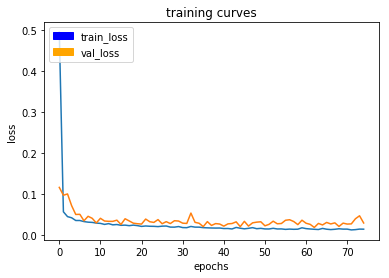

129/129 [==============================] - 49s - loss: 0.0145 - val_loss: 0.0296
Epoch 76/150
128/129 [============================>.] - ETA: 0s - loss: 0.0139

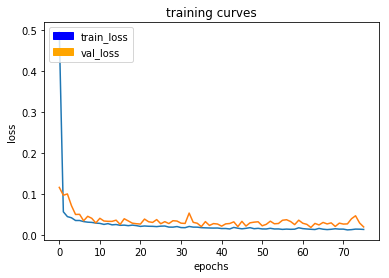

129/129 [==============================] - 50s - loss: 0.0139 - val_loss: 0.0199
Epoch 77/150
128/129 [============================>.] - ETA: 0s - loss: 0.0151

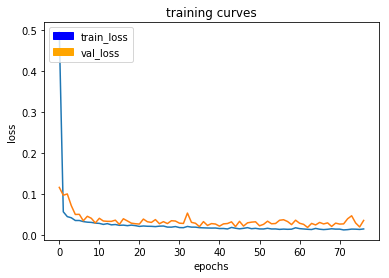

129/129 [==============================] - 49s - loss: 0.0151 - val_loss: 0.0358
Epoch 78/150
128/129 [============================>.] - ETA: 0s - loss: 0.0128

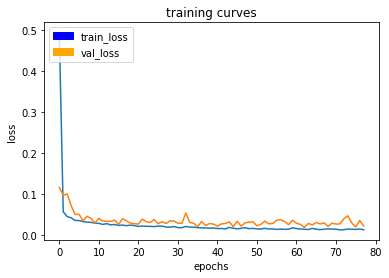

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0224
Epoch 79/150
128/129 [============================>.] - ETA: 0s - loss: 0.0128

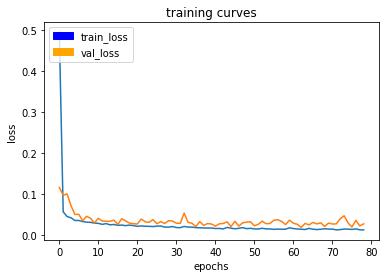

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0274
Epoch 80/150
128/129 [============================>.] - ETA: 0s - loss: 0.0126

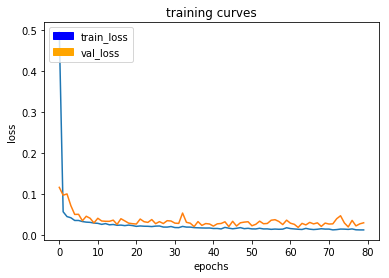

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0300
Epoch 81/150
128/129 [============================>.] - ETA: 0s - loss: 0.0129

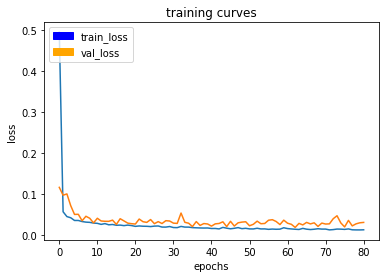

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0309
Epoch 82/150
128/129 [============================>.] - ETA: 0s - loss: 0.0129

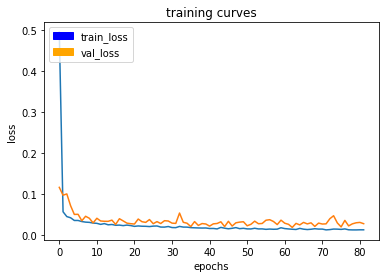

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0278
Epoch 83/150
128/129 [============================>.] - ETA: 0s - loss: 0.0132

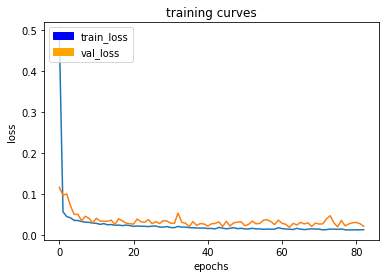

129/129 [==============================] - 49s - loss: 0.0132 - val_loss: 0.0215
Epoch 84/150
128/129 [============================>.] - ETA: 0s - loss: 0.0147

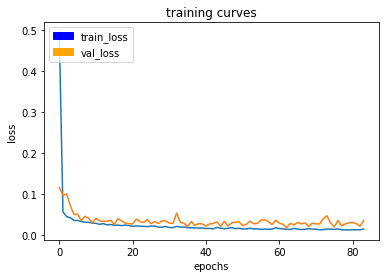

129/129 [==============================] - 49s - loss: 0.0147 - val_loss: 0.0355
Epoch 85/150
128/129 [============================>.] - ETA: 0s - loss: 0.0129

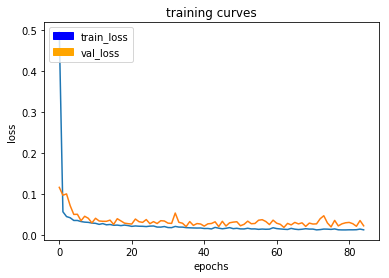

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0226
Epoch 86/150
128/129 [============================>.] - ETA: 0s - loss: 0.0123

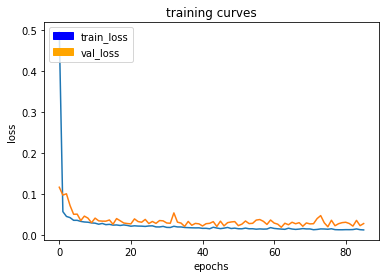

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0277
Epoch 87/150
128/129 [============================>.] - ETA: 0s - loss: 0.0120

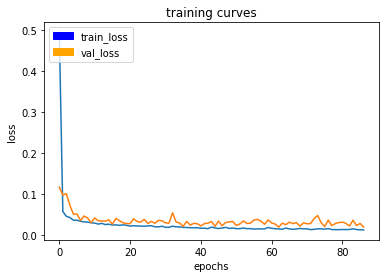

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0190
Epoch 88/150
128/129 [============================>.] - ETA: 0s - loss: 0.0120

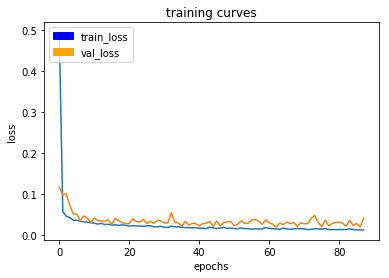

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0409
Epoch 89/150
128/129 [============================>.] - ETA: 0s - loss: 0.0162

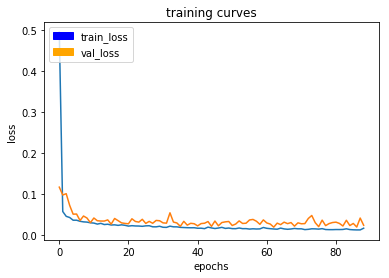

129/129 [==============================] - 49s - loss: 0.0162 - val_loss: 0.0233
Epoch 90/150
128/129 [============================>.] - ETA: 0s - loss: 0.0127

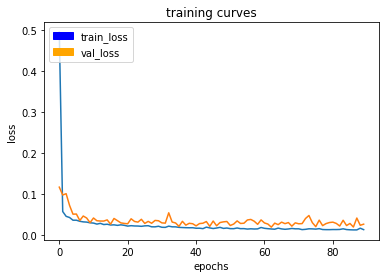

129/129 [==============================] - 49s - loss: 0.0127 - val_loss: 0.0260
Epoch 91/150
128/129 [============================>.] - ETA: 0s - loss: 0.0128

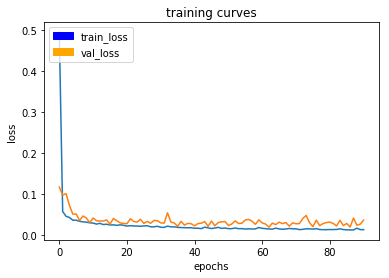

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0359
Epoch 92/150
128/129 [============================>.] - ETA: 0s - loss: 0.0126

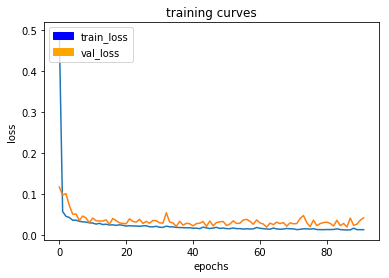

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0413
Epoch 93/150
128/129 [============================>.] - ETA: 0s - loss: 0.0123

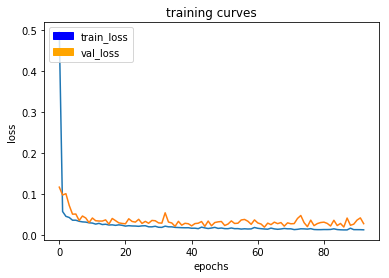

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0272
Epoch 94/150
128/129 [============================>.] - ETA: 0s - loss: 0.0125

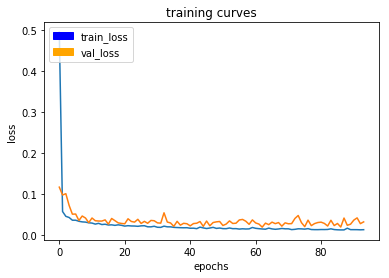

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0316
Epoch 95/150
128/129 [============================>.] - ETA: 0s - loss: 0.0120

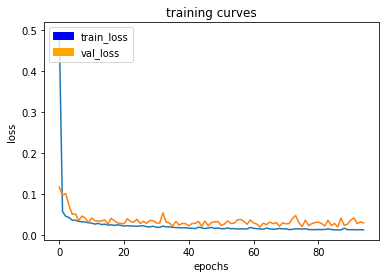

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0290
Epoch 96/150
128/129 [============================>.] - ETA: 0s - loss: 0.0125

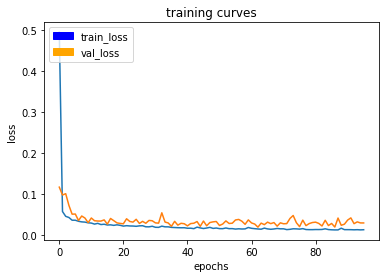

129/129 [==============================] - 49s - loss: 0.0125 - val_loss: 0.0290
Epoch 97/150
128/129 [============================>.] - ETA: 0s - loss: 0.0120

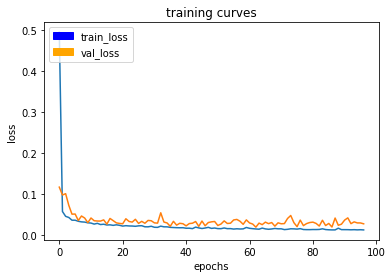

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0268
Epoch 98/150
128/129 [============================>.] - ETA: 0s - loss: 0.0113

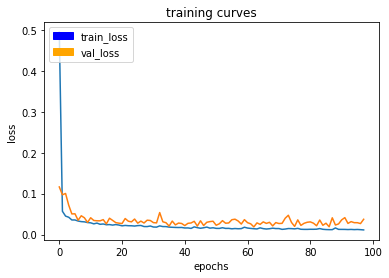

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0373
Epoch 99/150
128/129 [============================>.] - ETA: 0s - loss: 0.0114

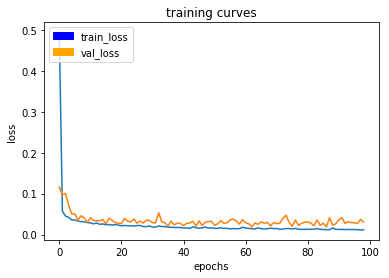

129/129 [==============================] - 49s - loss: 0.0114 - val_loss: 0.0305
Epoch 100/150
128/129 [============================>.] - ETA: 0s - loss: 0.0114

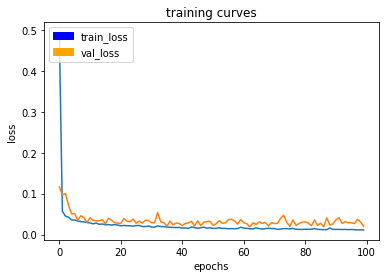

129/129 [==============================] - 49s - loss: 0.0114 - val_loss: 0.0199
Epoch 101/150
128/129 [============================>.] - ETA: 0s - loss: 0.0136

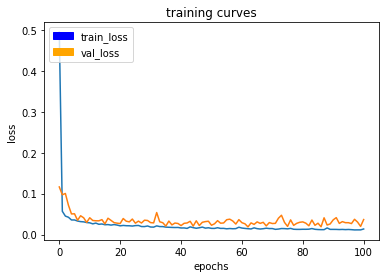

129/129 [==============================] - 49s - loss: 0.0137 - val_loss: 0.0366
Epoch 102/150
128/129 [============================>.] - ETA: 0s - loss: 0.0117

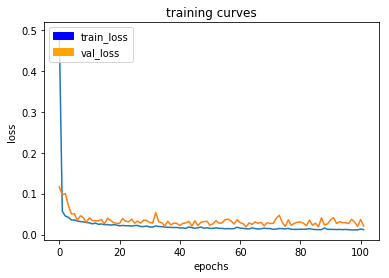

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0209
Epoch 103/150
128/129 [============================>.] - ETA: 0s - loss: 0.0140

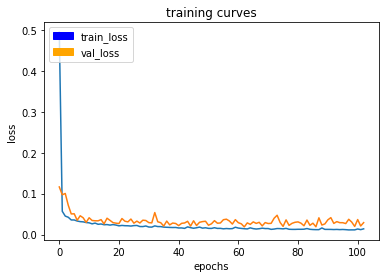

129/129 [==============================] - 49s - loss: 0.0140 - val_loss: 0.0291
Epoch 104/150
128/129 [============================>.] - ETA: 0s - loss: 0.0131

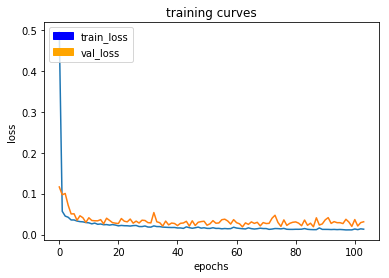

129/129 [==============================] - 49s - loss: 0.0131 - val_loss: 0.0312
Epoch 105/150
128/129 [============================>.] - ETA: 0s - loss: 0.0124

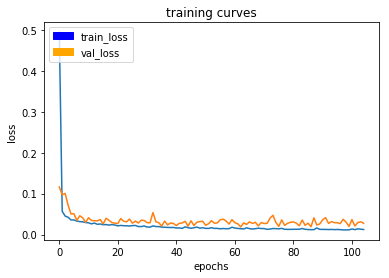

129/129 [==============================] - 49s - loss: 0.0124 - val_loss: 0.0275
Epoch 106/150
128/129 [============================>.] - ETA: 0s - loss: 0.0115

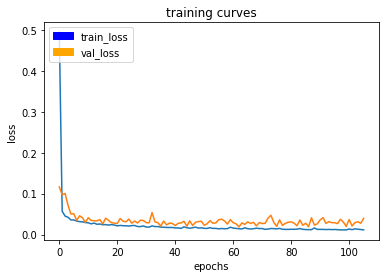

129/129 [==============================] - 49s - loss: 0.0115 - val_loss: 0.0396
Epoch 107/150
128/129 [============================>.] - ETA: 0s - loss: 0.0116

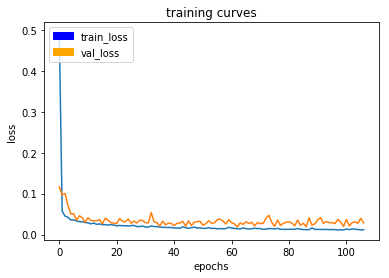

129/129 [==============================] - 49s - loss: 0.0116 - val_loss: 0.0286
Epoch 108/150
128/129 [============================>.] - ETA: 0s - loss: 0.0112

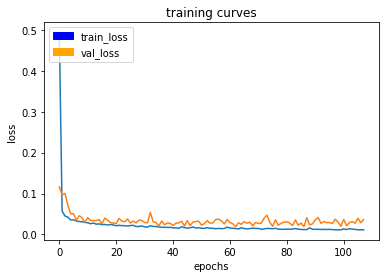

129/129 [==============================] - 49s - loss: 0.0112 - val_loss: 0.0362
Epoch 109/150
128/129 [============================>.] - ETA: 0s - loss: 0.0122

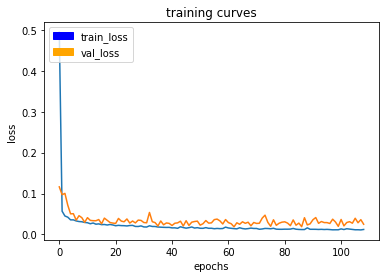

129/129 [==============================] - 49s - loss: 0.0122 - val_loss: 0.0249
Epoch 110/150
128/129 [============================>.] - ETA: 0s - loss: 0.0114

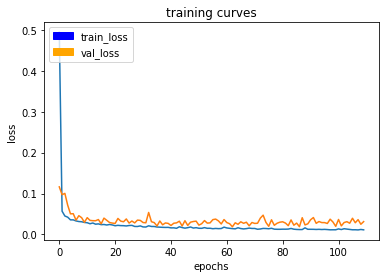

129/129 [==============================] - 49s - loss: 0.0114 - val_loss: 0.0314
Epoch 111/150
128/129 [============================>.] - ETA: 0s - loss: 0.0118

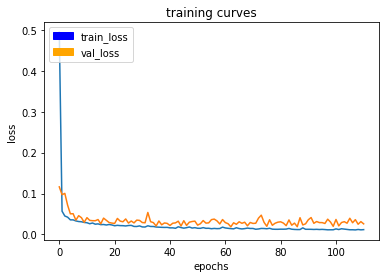

129/129 [==============================] - 49s - loss: 0.0118 - val_loss: 0.0259
Epoch 112/150
128/129 [============================>.] - ETA: 0s - loss: 0.0115

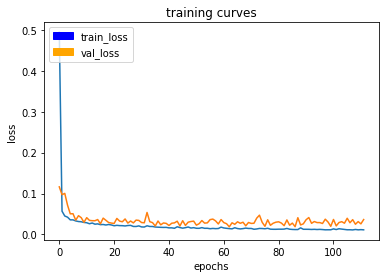

129/129 [==============================] - 49s - loss: 0.0115 - val_loss: 0.0364
Epoch 113/150
128/129 [============================>.] - ETA: 0s - loss: 0.0117

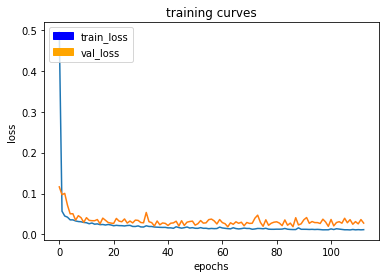

129/129 [==============================] - 49s - loss: 0.0117 - val_loss: 0.0278
Epoch 114/150
128/129 [============================>.] - ETA: 0s - loss: 0.0143

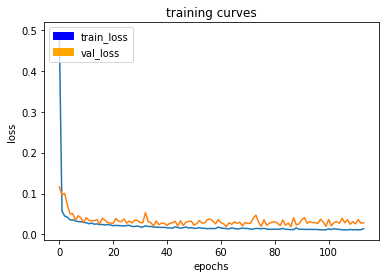

129/129 [==============================] - 49s - loss: 0.0142 - val_loss: 0.0285
Epoch 115/150
128/129 [============================>.] - ETA: 0s - loss: 0.0123

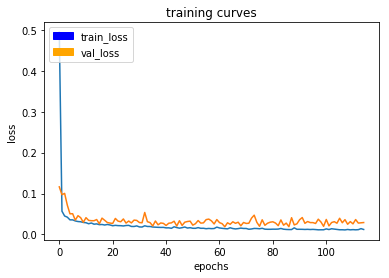

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0291
Epoch 116/150
128/129 [============================>.] - ETA: 0s - loss: 0.0115

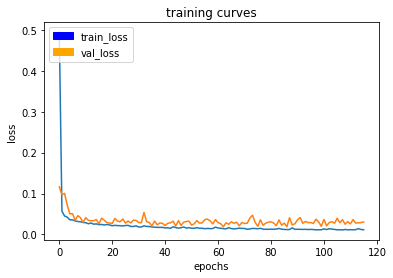

129/129 [==============================] - 49s - loss: 0.0115 - val_loss: 0.0305
Epoch 117/150
128/129 [============================>.] - ETA: 0s - loss: 0.0106

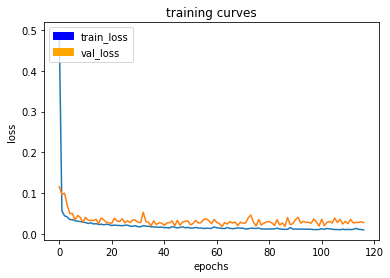

129/129 [==============================] - 49s - loss: 0.0106 - val_loss: 0.0284
Epoch 118/150
128/129 [============================>.] - ETA: 0s - loss: 0.0108

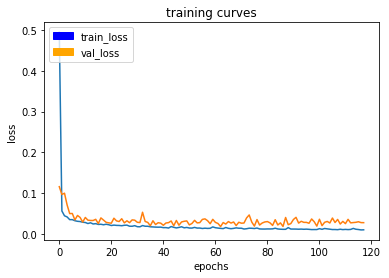

129/129 [==============================] - 49s - loss: 0.0108 - val_loss: 0.0283
Epoch 119/150
128/129 [============================>.] - ETA: 0s - loss: 0.0104

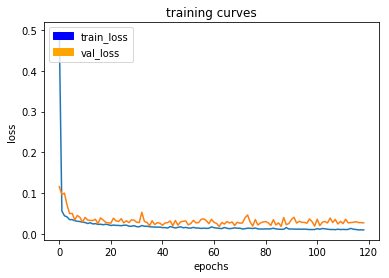

129/129 [==============================] - 49s - loss: 0.0104 - val_loss: 0.0278
Epoch 120/150
128/129 [============================>.] - ETA: 0s - loss: 0.0102

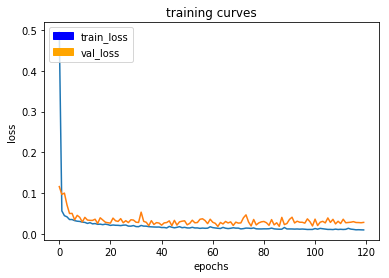

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0287
Epoch 121/150
128/129 [============================>.] - ETA: 0s - loss: 0.0103

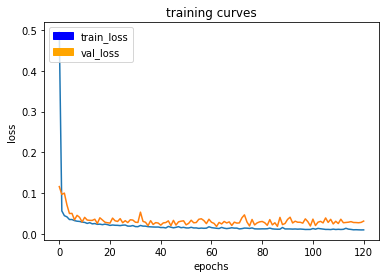

129/129 [==============================] - 49s - loss: 0.0103 - val_loss: 0.0319
Epoch 122/150
128/129 [============================>.] - ETA: 0s - loss: 0.0117

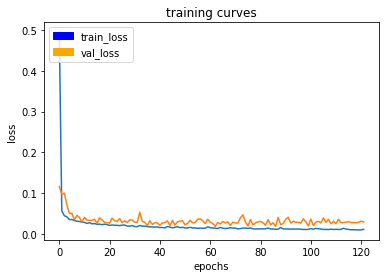

129/129 [==============================] - 49s - loss: 0.0117 - val_loss: 0.0297
Epoch 123/150
128/129 [============================>.] - ETA: 0s - loss: 0.0112

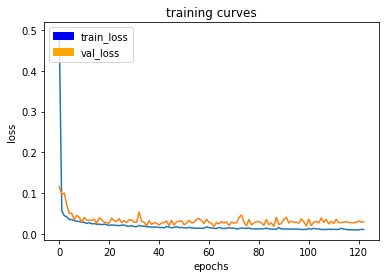

129/129 [==============================] - 49s - loss: 0.0112 - val_loss: 0.0298
Epoch 124/150
128/129 [============================>.] - ETA: 0s - loss: 0.0118

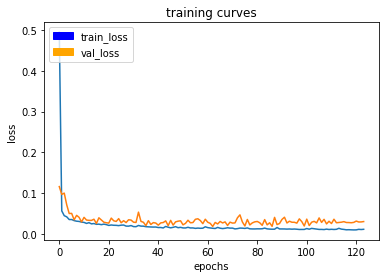

129/129 [==============================] - 49s - loss: 0.0117 - val_loss: 0.0307
Epoch 125/150
128/129 [============================>.] - ETA: 0s - loss: 0.0121

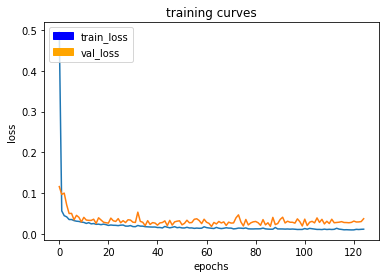

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0377
Epoch 126/150
128/129 [============================>.] - ETA: 0s - loss: 0.0135

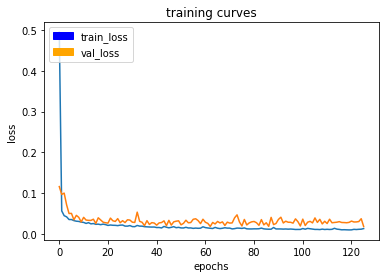

129/129 [==============================] - 49s - loss: 0.0135 - val_loss: 0.0185
Epoch 127/150
128/129 [============================>.] - ETA: 0s - loss: 0.0110

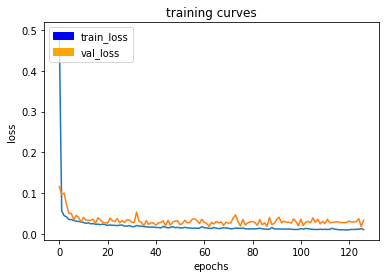

129/129 [==============================] - 49s - loss: 0.0110 - val_loss: 0.0342
Epoch 128/150
128/129 [============================>.] - ETA: 0s - loss: 0.0105

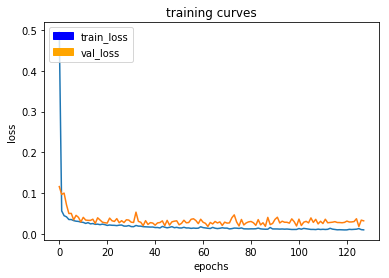

129/129 [==============================] - 49s - loss: 0.0105 - val_loss: 0.0325
Epoch 129/150
128/129 [============================>.] - ETA: 0s - loss: 0.0119

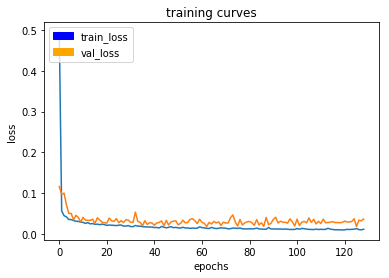

129/129 [==============================] - 49s - loss: 0.0119 - val_loss: 0.0368
Epoch 130/150
128/129 [============================>.] - ETA: 0s - loss: 0.0161

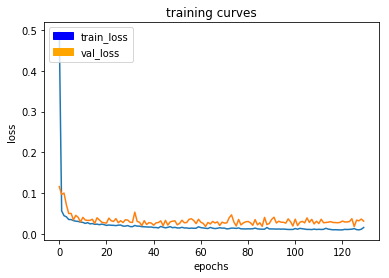

129/129 [==============================] - 49s - loss: 0.0161 - val_loss: 0.0318
Epoch 131/150
128/129 [============================>.] - ETA: 0s - loss: 0.0121

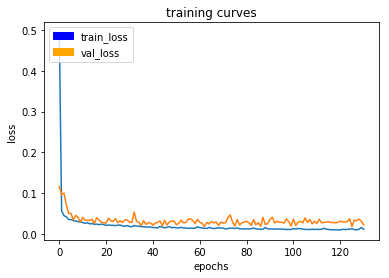

129/129 [==============================] - 49s - loss: 0.0122 - val_loss: 0.0226
Epoch 132/150
128/129 [============================>.] - ETA: 0s - loss: 0.0110

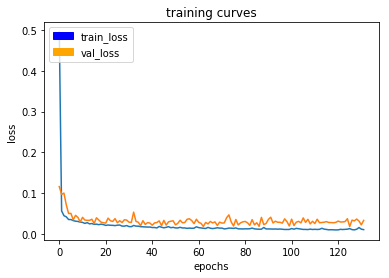

129/129 [==============================] - 49s - loss: 0.0110 - val_loss: 0.0336
Epoch 133/150
128/129 [============================>.] - ETA: 0s - loss: 0.0107

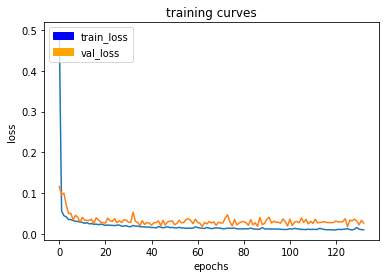

129/129 [==============================] - 49s - loss: 0.0107 - val_loss: 0.0271
Epoch 134/150
128/129 [============================>.] - ETA: 0s - loss: 0.0103

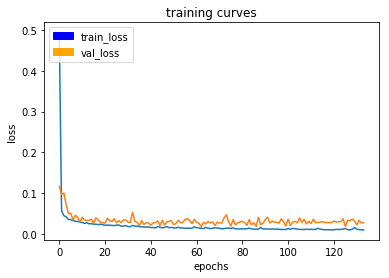

129/129 [==============================] - 49s - loss: 0.0103 - val_loss: 0.0279
Epoch 135/150
128/129 [============================>.] - ETA: 0s - loss: 0.0112

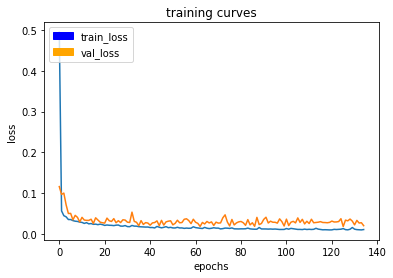

129/129 [==============================] - 49s - loss: 0.0111 - val_loss: 0.0206
Epoch 136/150
128/129 [============================>.] - ETA: 0s - loss: 0.0106

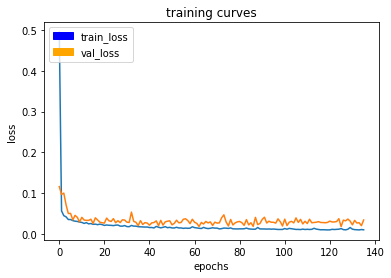

129/129 [==============================] - 49s - loss: 0.0106 - val_loss: 0.0345
Epoch 137/150
128/129 [============================>.] - ETA: 0s - loss: 0.0101

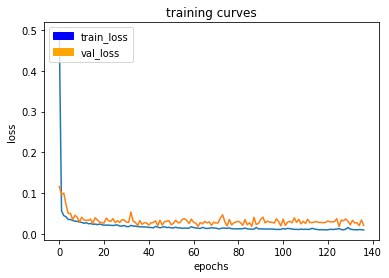

129/129 [==============================] - 49s - loss: 0.0101 - val_loss: 0.0216
Epoch 138/150
128/129 [============================>.] - ETA: 0s - loss: 0.0100

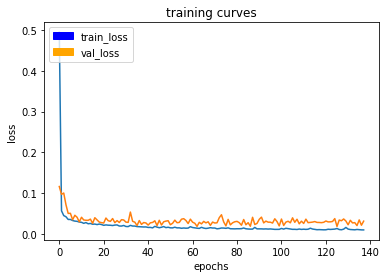

129/129 [==============================] - 49s - loss: 0.0100 - val_loss: 0.0315
Epoch 139/150
128/129 [============================>.] - ETA: 0s - loss: 0.0103

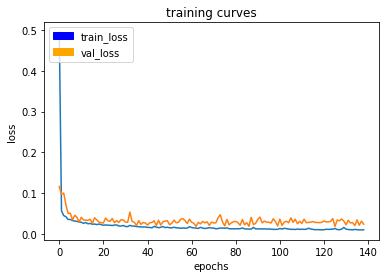

129/129 [==============================] - 49s - loss: 0.0103 - val_loss: 0.0240
Epoch 140/150
128/129 [============================>.] - ETA: 0s - loss: 0.0113

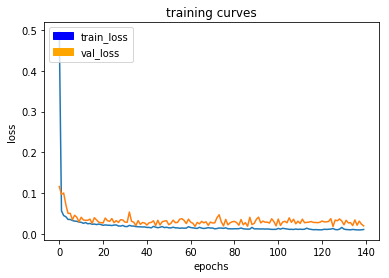

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0199
Epoch 141/150
128/129 [============================>.] - ETA: 0s - loss: 0.0100

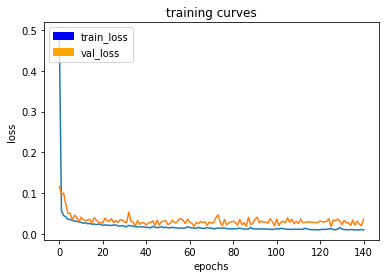

129/129 [==============================] - 49s - loss: 0.0100 - val_loss: 0.0362
Epoch 142/150
128/129 [============================>.] - ETA: 0s - loss: 0.0137

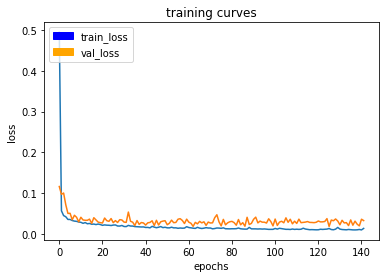

129/129 [==============================] - 49s - loss: 0.0137 - val_loss: 0.0329
Epoch 143/150
128/129 [============================>.] - ETA: 0s - loss: 0.0139

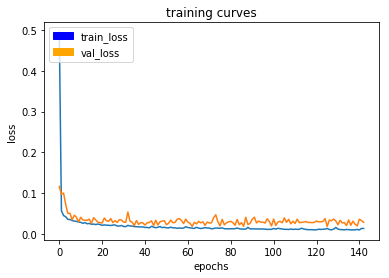

129/129 [==============================] - 49s - loss: 0.0139 - val_loss: 0.0288
Epoch 144/150
128/129 [============================>.] - ETA: 0s - loss: 0.0135

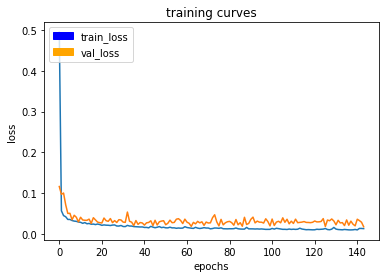

129/129 [==============================] - 49s - loss: 0.0134 - val_loss: 0.0178
Epoch 145/150
128/129 [============================>.] - ETA: 0s - loss: 0.0112

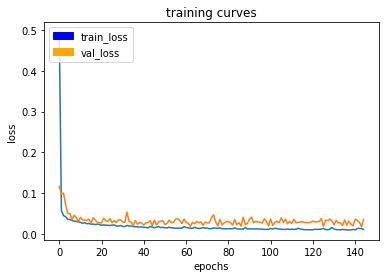

129/129 [==============================] - 49s - loss: 0.0112 - val_loss: 0.0359
Epoch 146/150
128/129 [============================>.] - ETA: 0s - loss: 0.0107

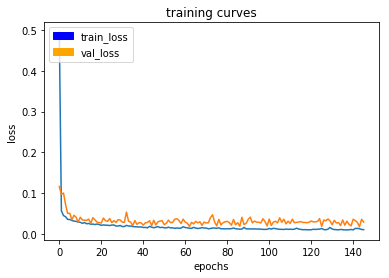

129/129 [==============================] - 49s - loss: 0.0107 - val_loss: 0.0291
Epoch 147/150
128/129 [============================>.] - ETA: 0s - loss: 0.0100

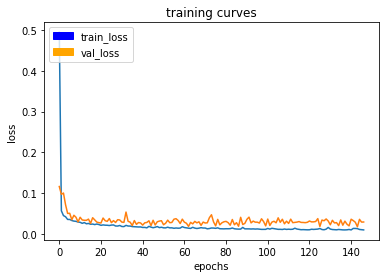

129/129 [==============================] - 49s - loss: 0.0100 - val_loss: 0.0294
Epoch 148/150
128/129 [============================>.] - ETA: 0s - loss: 0.0102

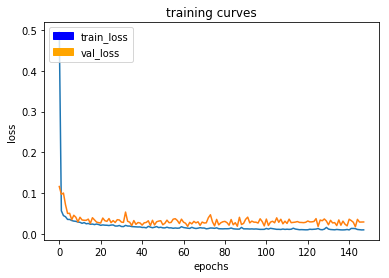

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0295
Epoch 149/150
128/129 [============================>.] - ETA: 0s - loss: 0.0097

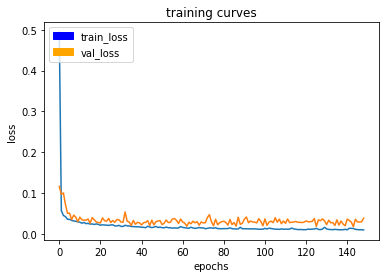

129/129 [==============================] - 49s - loss: 0.0097 - val_loss: 0.0384
Epoch 150/150
128/129 [============================>.] - ETA: 0s - loss: 0.0098

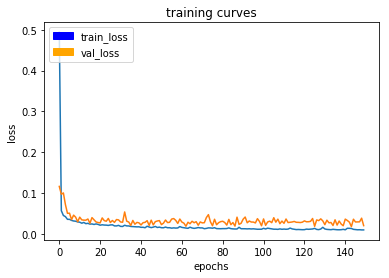

129/129 [==============================] - 49s - loss: 0.0098 - val_loss: 0.0202
TESTING NUM EPOCHS:  200
num images :  4131
num masks :  4131
num images :  1184
num masks :  1184
Epoch 1/200
128/129 [============================>.] - ETA: 0s - loss: 0.4917

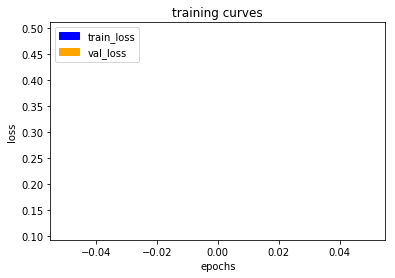

129/129 [==============================] - 51s - loss: 0.4884 - val_loss: 0.1121
Epoch 2/200
128/129 [============================>.] - ETA: 0s - loss: 0.0592

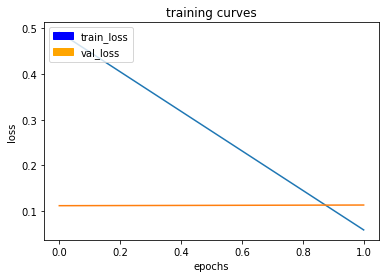

129/129 [==============================] - 50s - loss: 0.0591 - val_loss: 0.1135
Epoch 3/200
128/129 [============================>.] - ETA: 0s - loss: 0.0475

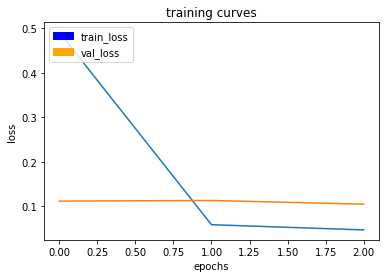

129/129 [==============================] - 49s - loss: 0.0474 - val_loss: 0.1052
Epoch 4/200
128/129 [============================>.] - ETA: 0s - loss: 0.0416

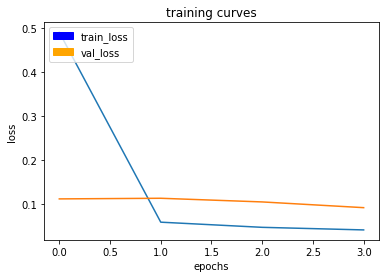

129/129 [==============================] - 50s - loss: 0.0415 - val_loss: 0.0921
Epoch 5/200
128/129 [============================>.] - ETA: 0s - loss: 0.0383

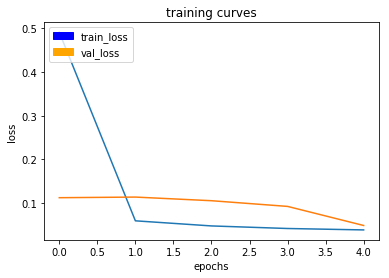

129/129 [==============================] - 49s - loss: 0.0382 - val_loss: 0.0484
Epoch 6/200
128/129 [============================>.] - ETA: 0s - loss: 0.0355

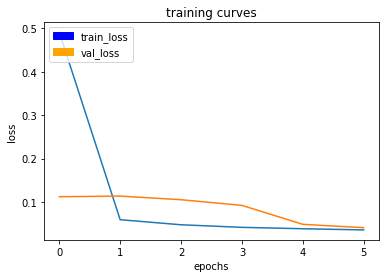

129/129 [==============================] - 49s - loss: 0.0355 - val_loss: 0.0407
Epoch 7/200
128/129 [============================>.] - ETA: 0s - loss: 0.0336

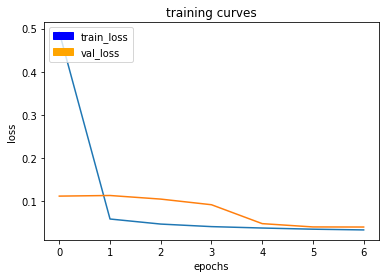

129/129 [==============================] - 50s - loss: 0.0338 - val_loss: 0.0405
Epoch 8/200
128/129 [============================>.] - ETA: 0s - loss: 0.0323

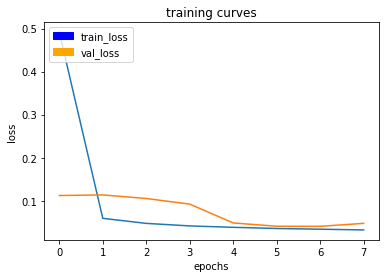

129/129 [==============================] - 49s - loss: 0.0322 - val_loss: 0.0475
Epoch 9/200
128/129 [============================>.] - ETA: 0s - loss: 0.0313

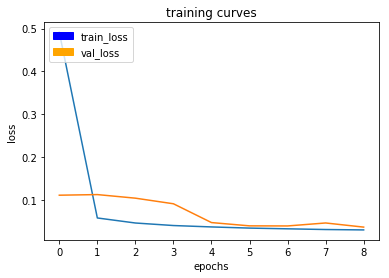

129/129 [==============================] - 49s - loss: 0.0313 - val_loss: 0.0378
Epoch 10/200
128/129 [============================>.] - ETA: 0s - loss: 0.0299

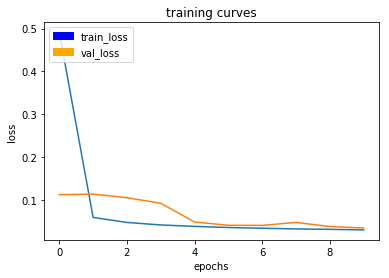

129/129 [==============================] - 50s - loss: 0.0299 - val_loss: 0.0344
Epoch 11/200
128/129 [============================>.] - ETA: 0s - loss: 0.0280

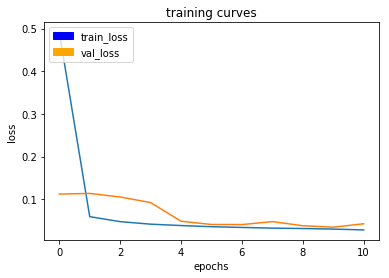

129/129 [==============================] - 50s - loss: 0.0280 - val_loss: 0.0424
Epoch 12/200
128/129 [============================>.] - ETA: 0s - loss: 0.0279

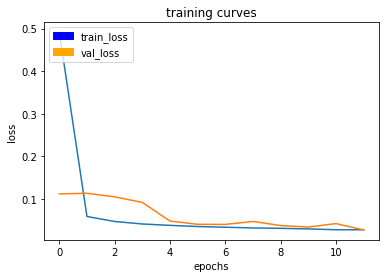

129/129 [==============================] - 50s - loss: 0.0279 - val_loss: 0.0276
Epoch 13/200
128/129 [============================>.] - ETA: 0s - loss: 0.0271

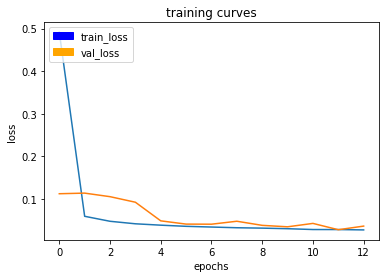

129/129 [==============================] - 50s - loss: 0.0271 - val_loss: 0.0361
Epoch 14/200
128/129 [============================>.] - ETA: 0s - loss: 0.0265

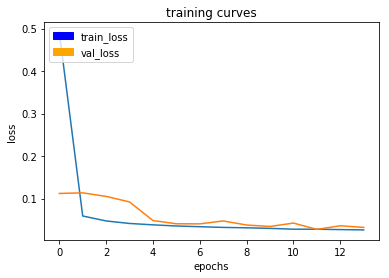

129/129 [==============================] - 50s - loss: 0.0264 - val_loss: 0.0323
Epoch 15/200
128/129 [============================>.] - ETA: 0s - loss: 0.0269

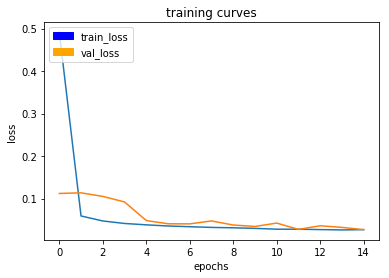

129/129 [==============================] - 49s - loss: 0.0268 - val_loss: 0.0270
Epoch 16/200
128/129 [============================>.] - ETA: 0s - loss: 0.0260

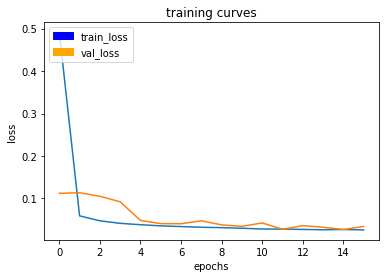

129/129 [==============================] - 50s - loss: 0.0260 - val_loss: 0.0340
Epoch 17/200
128/129 [============================>.] - ETA: 0s - loss: 0.0244

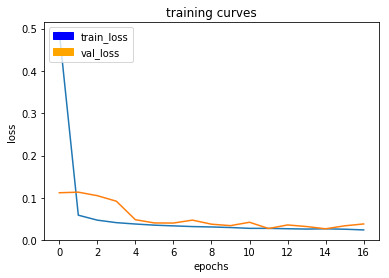

129/129 [==============================] - 50s - loss: 0.0243 - val_loss: 0.0384
Epoch 18/200
128/129 [============================>.] - ETA: 0s - loss: 0.0240

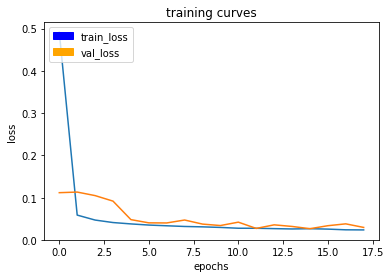

129/129 [==============================] - 50s - loss: 0.0240 - val_loss: 0.0299
Epoch 19/200
128/129 [============================>.] - ETA: 0s - loss: 0.0236

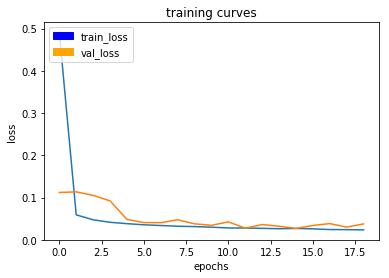

129/129 [==============================] - 50s - loss: 0.0235 - val_loss: 0.0378
Epoch 20/200
128/129 [============================>.] - ETA: 0s - loss: 0.0246

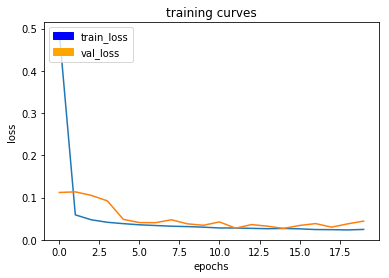

129/129 [==============================] - 50s - loss: 0.0246 - val_loss: 0.0443
Epoch 21/200
128/129 [============================>.] - ETA: 0s - loss: 0.0218

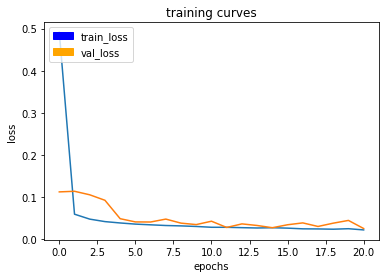

129/129 [==============================] - 49s - loss: 0.0217 - val_loss: 0.0251
Epoch 22/200
128/129 [============================>.] - ETA: 0s - loss: 0.0343

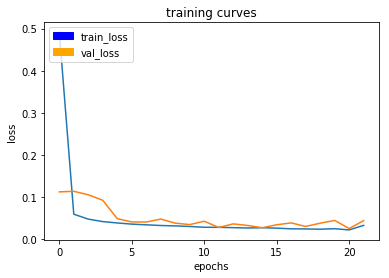

129/129 [==============================] - 49s - loss: 0.0343 - val_loss: 0.0438
Epoch 23/200
128/129 [============================>.] - ETA: 0s - loss: 0.0249

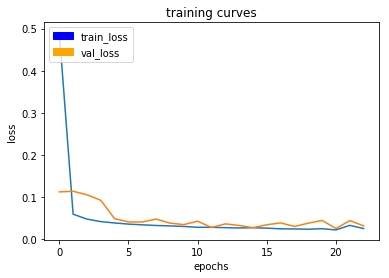

129/129 [==============================] - 50s - loss: 0.0249 - val_loss: 0.0314
Epoch 24/200
128/129 [============================>.] - ETA: 0s - loss: 0.0231

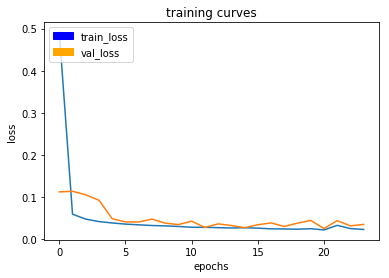

129/129 [==============================] - 49s - loss: 0.0231 - val_loss: 0.0348
Epoch 25/200
128/129 [============================>.] - ETA: 0s - loss: 0.0220

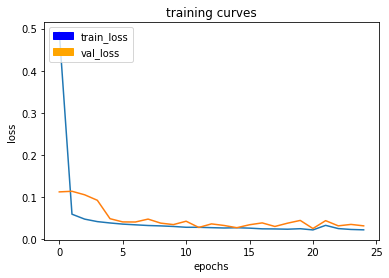

129/129 [==============================] - 49s - loss: 0.0219 - val_loss: 0.0314
Epoch 26/200
128/129 [============================>.] - ETA: 0s - loss: 0.0200

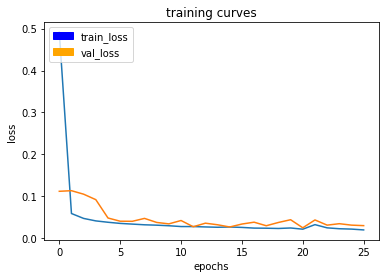

129/129 [==============================] - 50s - loss: 0.0200 - val_loss: 0.0302
Epoch 27/200
128/129 [============================>.] - ETA: 0s - loss: 0.0218

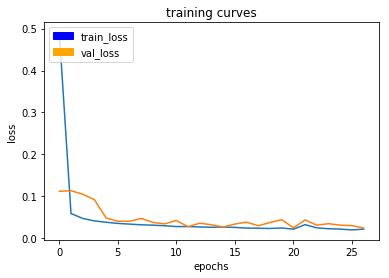

129/129 [==============================] - 49s - loss: 0.0218 - val_loss: 0.0244
Epoch 28/200
128/129 [============================>.] - ETA: 0s - loss: 0.0204

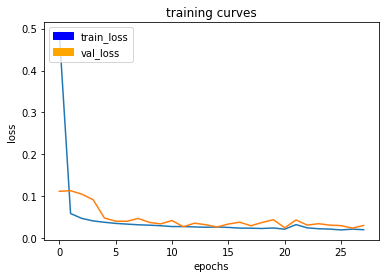

129/129 [==============================] - 50s - loss: 0.0204 - val_loss: 0.0306
Epoch 29/200
128/129 [============================>.] - ETA: 0s - loss: 0.0190

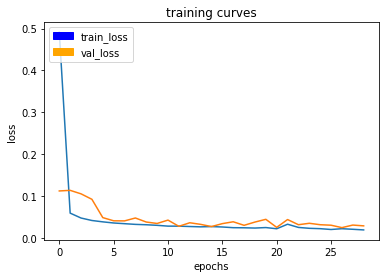

129/129 [==============================] - 49s - loss: 0.0190 - val_loss: 0.0287
Epoch 30/200
128/129 [============================>.] - ETA: 0s - loss: 0.0206

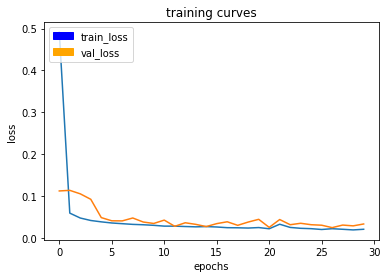

129/129 [==============================] - 49s - loss: 0.0205 - val_loss: 0.0332
Epoch 31/200
128/129 [============================>.] - ETA: 0s - loss: 0.0194

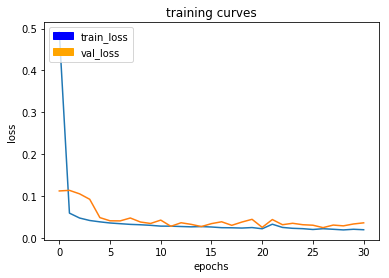

129/129 [==============================] - 49s - loss: 0.0194 - val_loss: 0.0359
Epoch 32/200
128/129 [============================>.] - ETA: 0s - loss: 0.0249

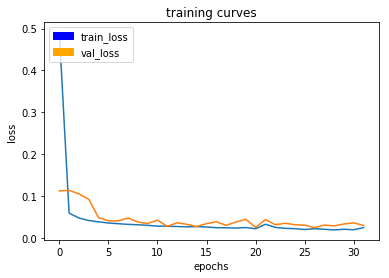

129/129 [==============================] - 52s - loss: 0.0249 - val_loss: 0.0295
Epoch 33/200
128/129 [============================>.] - ETA: 0s - loss: 0.0213

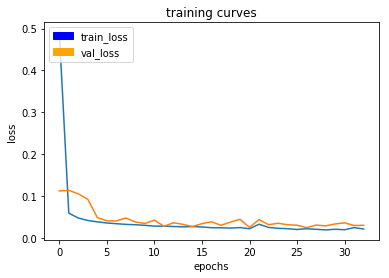

129/129 [==============================] - 52s - loss: 0.0213 - val_loss: 0.0300
Epoch 34/200
128/129 [============================>.] - ETA: 0s - loss: 0.0198

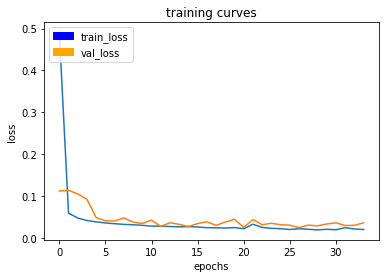

129/129 [==============================] - 49s - loss: 0.0198 - val_loss: 0.0359
Epoch 35/200
128/129 [============================>.] - ETA: 0s - loss: 0.0191

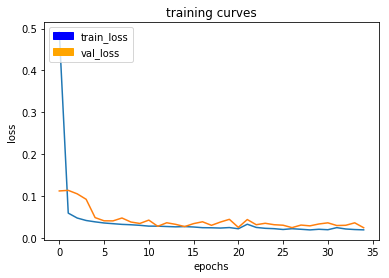

129/129 [==============================] - 49s - loss: 0.0191 - val_loss: 0.0242
Epoch 36/200
128/129 [============================>.] - ETA: 0s - loss: 0.0182

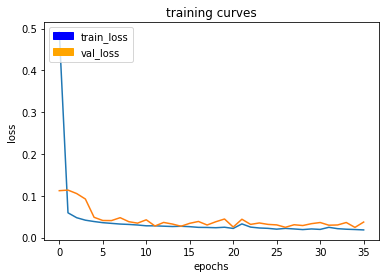

129/129 [==============================] - 49s - loss: 0.0182 - val_loss: 0.0370
Epoch 37/200
128/129 [============================>.] - ETA: 0s - loss: 0.0194

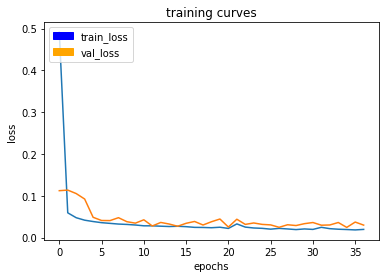

129/129 [==============================] - 49s - loss: 0.0194 - val_loss: 0.0297
Epoch 38/200
128/129 [============================>.] - ETA: 0s - loss: 0.0174

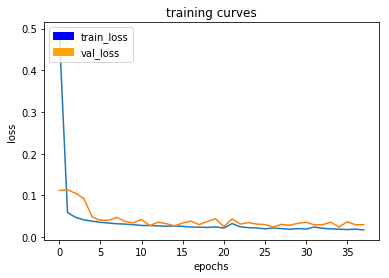

129/129 [==============================] - 49s - loss: 0.0174 - val_loss: 0.0300
Epoch 39/200
128/129 [============================>.] - ETA: 0s - loss: 0.0173

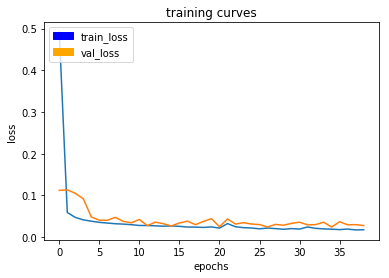

129/129 [==============================] - 49s - loss: 0.0177 - val_loss: 0.0279
Epoch 40/200
128/129 [============================>.] - ETA: 0s - loss: 0.0178

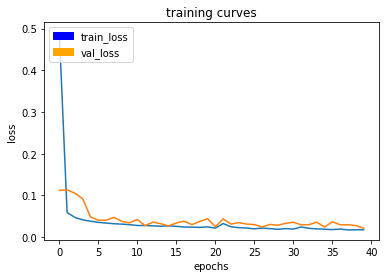

129/129 [==============================] - 49s - loss: 0.0178 - val_loss: 0.0217
Epoch 41/200
128/129 [============================>.] - ETA: 0s - loss: 0.0175

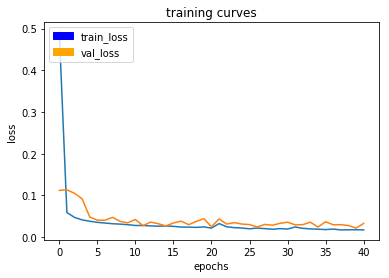

129/129 [==============================] - 49s - loss: 0.0176 - val_loss: 0.0329
Epoch 42/200
128/129 [============================>.] - ETA: 0s - loss: 0.0171

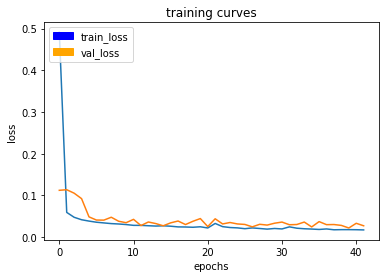

129/129 [==============================] - 49s - loss: 0.0171 - val_loss: 0.0270
Epoch 43/200
128/129 [============================>.] - ETA: 0s - loss: 0.0176

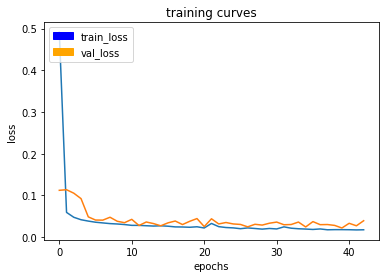

129/129 [==============================] - 49s - loss: 0.0176 - val_loss: 0.0391
Epoch 44/200
128/129 [============================>.] - ETA: 0s - loss: 0.0167

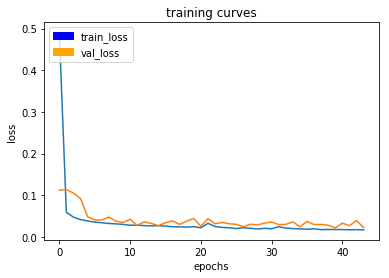

129/129 [==============================] - 49s - loss: 0.0168 - val_loss: 0.0223
Epoch 45/200
128/129 [============================>.] - ETA: 0s - loss: 0.0177

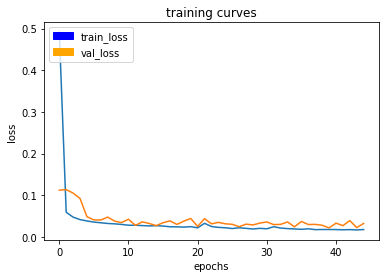

129/129 [==============================] - 49s - loss: 0.0177 - val_loss: 0.0322
Epoch 46/200
128/129 [============================>.] - ETA: 0s - loss: 0.0182

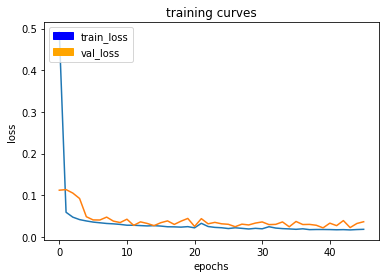

129/129 [==============================] - 49s - loss: 0.0182 - val_loss: 0.0364
Epoch 47/200
128/129 [============================>.] - ETA: 0s - loss: 0.0167

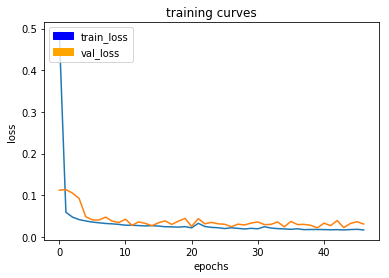

129/129 [==============================] - 50s - loss: 0.0167 - val_loss: 0.0308
Epoch 48/200
128/129 [============================>.] - ETA: 0s - loss: 0.0155

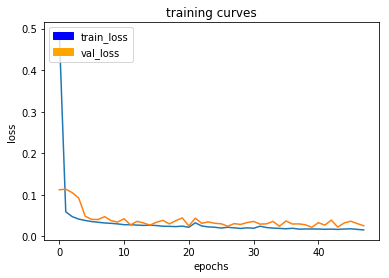

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0255
Epoch 49/200
128/129 [============================>.] - ETA: 0s - loss: 0.0170

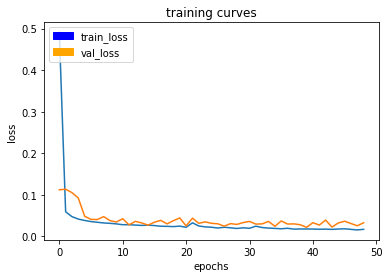

129/129 [==============================] - 49s - loss: 0.0170 - val_loss: 0.0327
Epoch 50/200
128/129 [============================>.] - ETA: 0s - loss: 0.0164

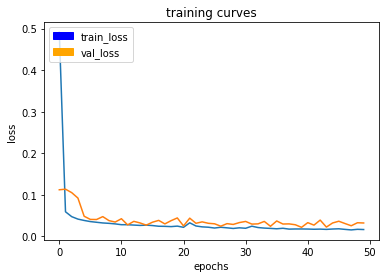

129/129 [==============================] - 49s - loss: 0.0164 - val_loss: 0.0321
Epoch 51/200
128/129 [============================>.] - ETA: 0s - loss: 0.0147

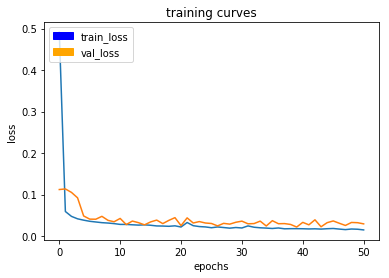

129/129 [==============================] - 49s - loss: 0.0147 - val_loss: 0.0293
Epoch 52/200
128/129 [============================>.] - ETA: 0s - loss: 0.0175

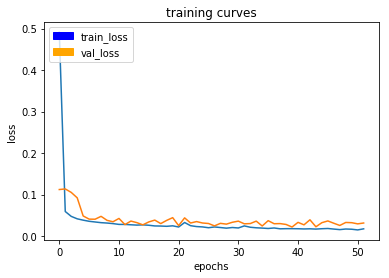

129/129 [==============================] - 49s - loss: 0.0174 - val_loss: 0.0314
Epoch 53/200
128/129 [============================>.] - ETA: 0s - loss: 0.0164

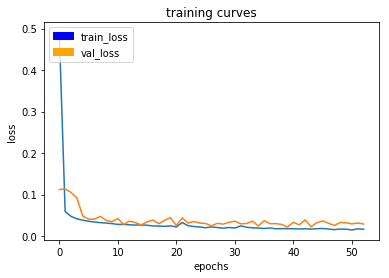

129/129 [==============================] - 49s - loss: 0.0164 - val_loss: 0.0289
Epoch 54/200
128/129 [============================>.] - ETA: 0s - loss: 0.0152

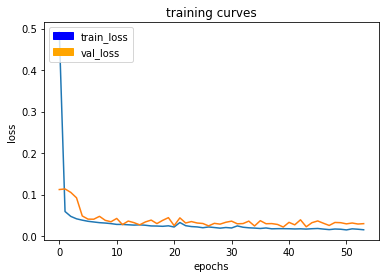

129/129 [==============================] - 49s - loss: 0.0152 - val_loss: 0.0298
Epoch 55/200
128/129 [============================>.] - ETA: 0s - loss: 0.0146

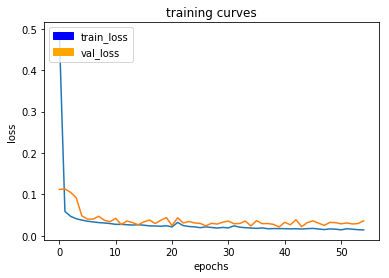

129/129 [==============================] - 49s - loss: 0.0145 - val_loss: 0.0366
Epoch 56/200
128/129 [============================>.] - ETA: 0s - loss: 0.0155

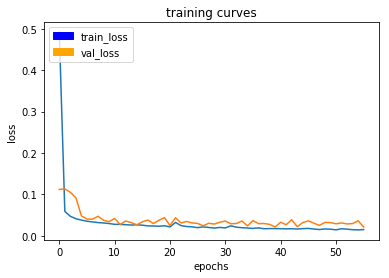

129/129 [==============================] - 51s - loss: 0.0155 - val_loss: 0.0216
Epoch 57/200
128/129 [============================>.] - ETA: 0s - loss: 0.0149

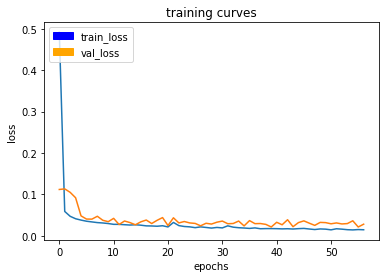

129/129 [==============================] - 49s - loss: 0.0149 - val_loss: 0.0284
Epoch 58/200
128/129 [============================>.] - ETA: 0s - loss: 0.0159

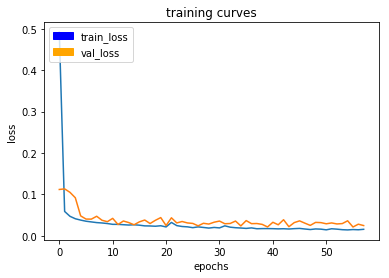

129/129 [==============================] - 49s - loss: 0.0162 - val_loss: 0.0250
Epoch 59/200
128/129 [============================>.] - ETA: 0s - loss: 0.0166

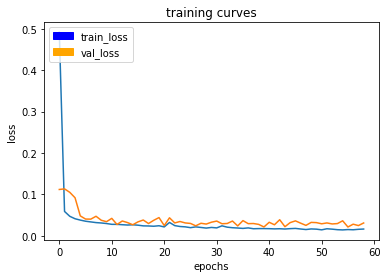

129/129 [==============================] - 49s - loss: 0.0166 - val_loss: 0.0313
Epoch 60/200
128/129 [============================>.] - ETA: 0s - loss: 0.0148

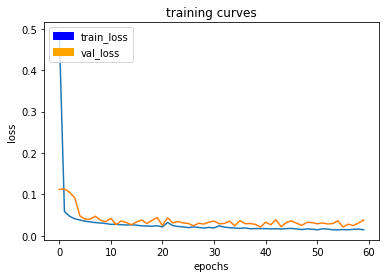

129/129 [==============================] - 49s - loss: 0.0148 - val_loss: 0.0384
Epoch 61/200
128/129 [============================>.] - ETA: 0s - loss: 0.0138

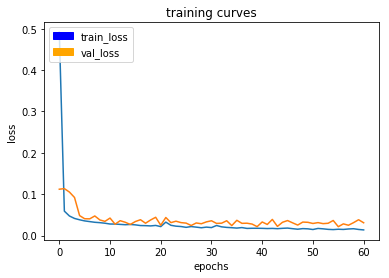

129/129 [==============================] - 49s - loss: 0.0138 - val_loss: 0.0310
Epoch 62/200
128/129 [============================>.] - ETA: 0s - loss: 0.0167

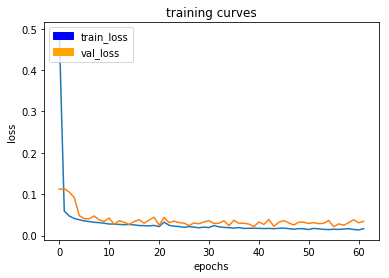

129/129 [==============================] - 49s - loss: 0.0167 - val_loss: 0.0346
Epoch 63/200
128/129 [============================>.] - ETA: 0s - loss: 0.0158

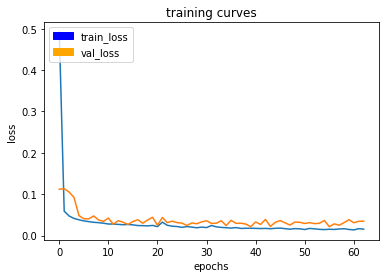

129/129 [==============================] - 49s - loss: 0.0158 - val_loss: 0.0348
Epoch 64/200
128/129 [============================>.] - ETA: 0s - loss: 0.0300

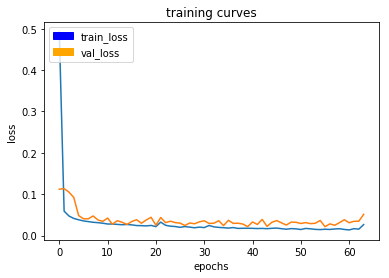

129/129 [==============================] - 50s - loss: 0.0299 - val_loss: 0.0513
Epoch 65/200
128/129 [============================>.] - ETA: 0s - loss: 0.0219

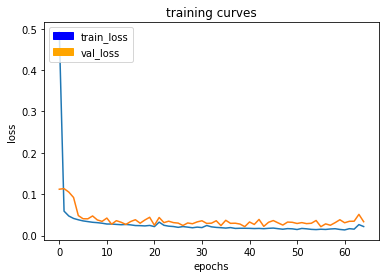

129/129 [==============================] - 49s - loss: 0.0218 - val_loss: 0.0336
Epoch 66/200
128/129 [============================>.] - ETA: 0s - loss: 0.0190

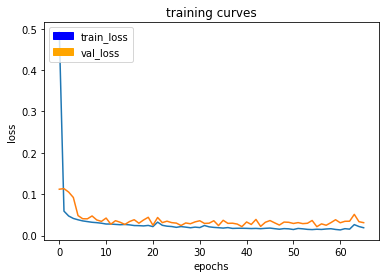

129/129 [==============================] - 49s - loss: 0.0190 - val_loss: 0.0313
Epoch 67/200
128/129 [============================>.] - ETA: 0s - loss: 0.0166

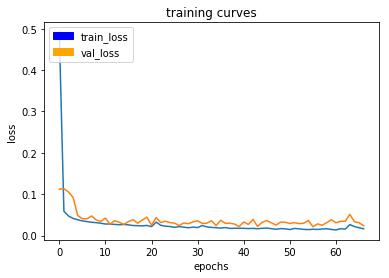

129/129 [==============================] - 49s - loss: 0.0166 - val_loss: 0.0237
Epoch 68/200
128/129 [============================>.] - ETA: 0s - loss: 0.0159

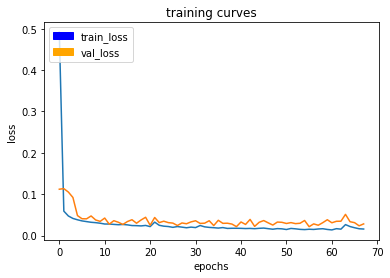

129/129 [==============================] - 49s - loss: 0.0159 - val_loss: 0.0283
Epoch 69/200
128/129 [============================>.] - ETA: 0s - loss: 0.0158

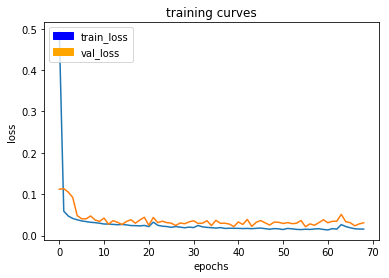

129/129 [==============================] - 49s - loss: 0.0158 - val_loss: 0.0309
Epoch 70/200
128/129 [============================>.] - ETA: 0s - loss: 0.0155

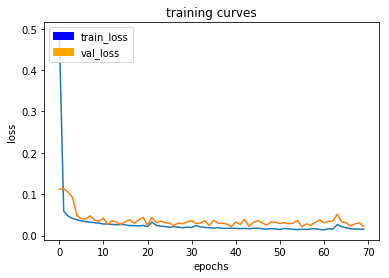

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0225
Epoch 71/200
128/129 [============================>.] - ETA: 0s - loss: 0.0140

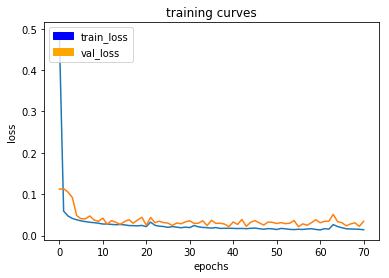

129/129 [==============================] - 49s - loss: 0.0140 - val_loss: 0.0346
Epoch 72/200
128/129 [============================>.] - ETA: 0s - loss: 0.0155

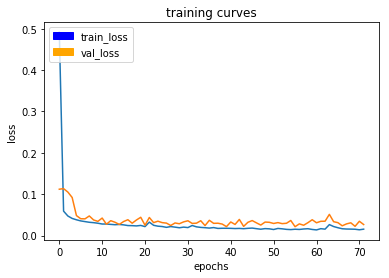

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0268
Epoch 73/200
128/129 [============================>.] - ETA: 0s - loss: 0.0141

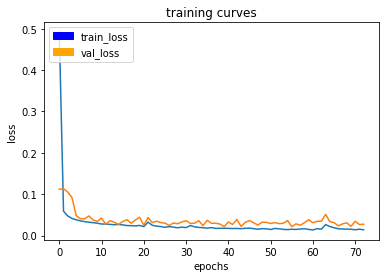

129/129 [==============================] - 49s - loss: 0.0141 - val_loss: 0.0276
Epoch 74/200
128/129 [============================>.] - ETA: 0s - loss: 0.0143

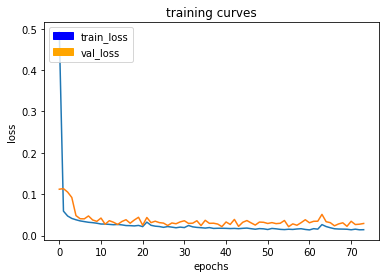

129/129 [==============================] - 49s - loss: 0.0143 - val_loss: 0.0293
Epoch 75/200
128/129 [============================>.] - ETA: 0s - loss: 0.0142

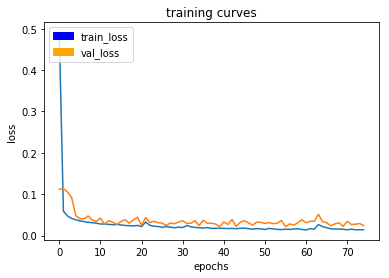

129/129 [==============================] - 49s - loss: 0.0142 - val_loss: 0.0242
Epoch 76/200
128/129 [============================>.] - ETA: 0s - loss: 0.0136

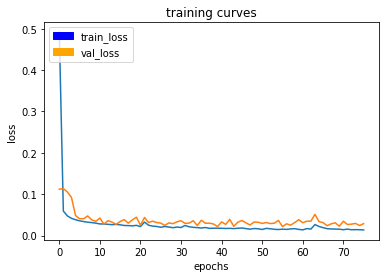

129/129 [==============================] - 49s - loss: 0.0136 - val_loss: 0.0288
Epoch 77/200
128/129 [============================>.] - ETA: 0s - loss: 0.0134

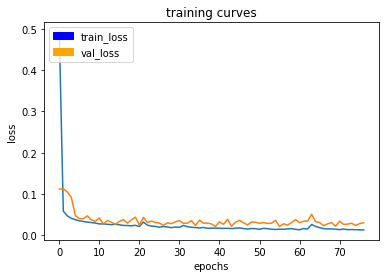

129/129 [==============================] - 49s - loss: 0.0134 - val_loss: 0.0308
Epoch 78/200
128/129 [============================>.] - ETA: 0s - loss: 0.0133

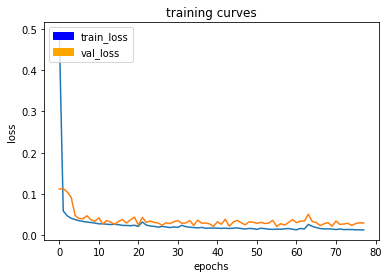

129/129 [==============================] - 49s - loss: 0.0133 - val_loss: 0.0299
Epoch 79/200
128/129 [============================>.] - ETA: 0s - loss: 0.0146

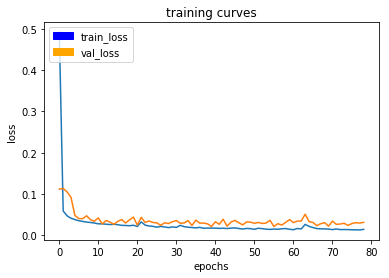

129/129 [==============================] - 49s - loss: 0.0146 - val_loss: 0.0316
Epoch 80/200
128/129 [============================>.] - ETA: 0s - loss: 0.0134

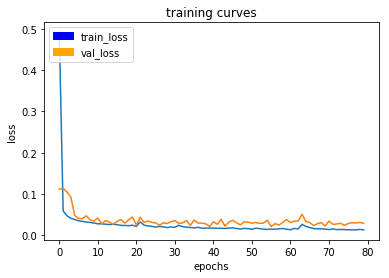

129/129 [==============================] - 49s - loss: 0.0134 - val_loss: 0.0294
Epoch 81/200
128/129 [============================>.] - ETA: 0s - loss: 0.0141

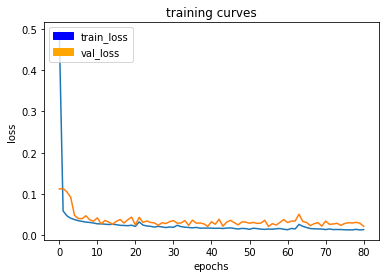

129/129 [==============================] - 49s - loss: 0.0141 - val_loss: 0.0220
Epoch 82/200
128/129 [============================>.] - ETA: 0s - loss: 0.0274

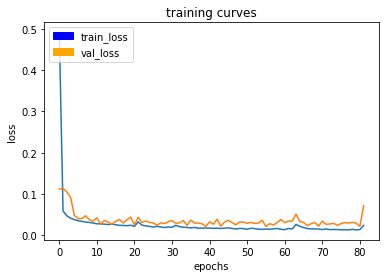

129/129 [==============================] - 49s - loss: 0.0275 - val_loss: 0.0716
Epoch 83/200
128/129 [============================>.] - ETA: 0s - loss: 0.0232

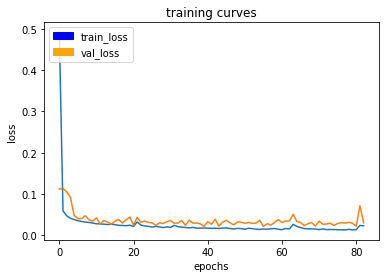

129/129 [==============================] - 49s - loss: 0.0231 - val_loss: 0.0306
Epoch 84/200
128/129 [============================>.] - ETA: 0s - loss: 0.0175

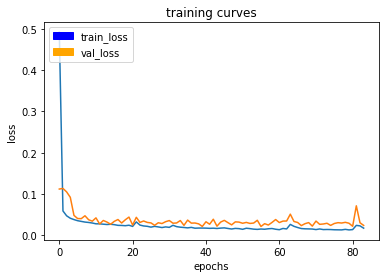

129/129 [==============================] - 49s - loss: 0.0175 - val_loss: 0.0241
Epoch 85/200
128/129 [============================>.] - ETA: 0s - loss: 0.0158

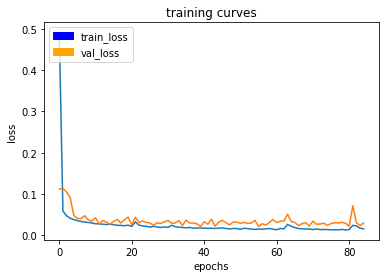

129/129 [==============================] - 49s - loss: 0.0158 - val_loss: 0.0295
Epoch 86/200
128/129 [============================>.] - ETA: 0s - loss: 0.0146

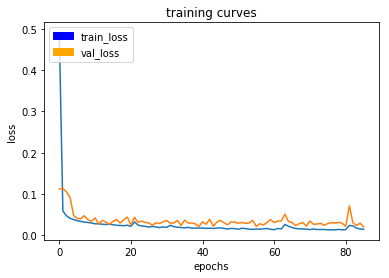

129/129 [==============================] - 49s - loss: 0.0146 - val_loss: 0.0205
Epoch 87/200
128/129 [============================>.] - ETA: 0s - loss: 0.0145

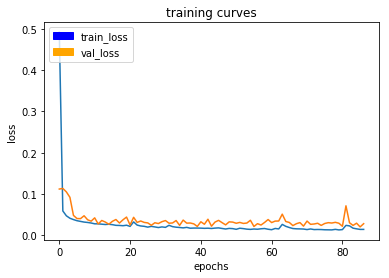

129/129 [==============================] - 49s - loss: 0.0145 - val_loss: 0.0283
Epoch 88/200
128/129 [============================>.] - ETA: 0s - loss: 0.0132

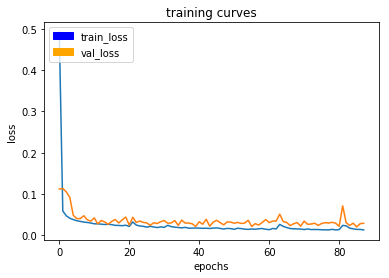

129/129 [==============================] - 49s - loss: 0.0132 - val_loss: 0.0293
Epoch 89/200
128/129 [============================>.] - ETA: 0s - loss: 0.0132

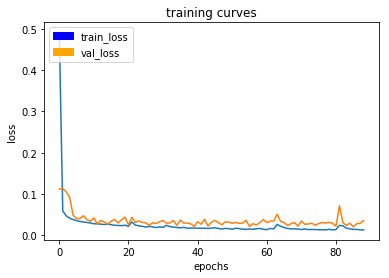

129/129 [==============================] - 49s - loss: 0.0132 - val_loss: 0.0358
Epoch 90/200
128/129 [============================>.] - ETA: 0s - loss: 0.0134

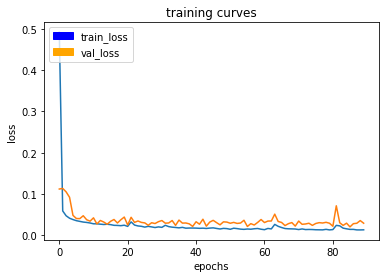

129/129 [==============================] - 49s - loss: 0.0134 - val_loss: 0.0294
Epoch 91/200
128/129 [============================>.] - ETA: 0s - loss: 0.0123

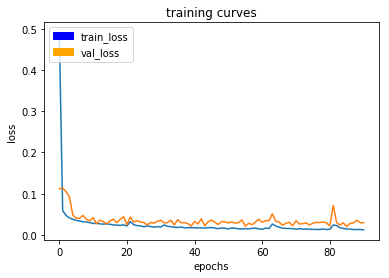

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0301
Epoch 92/200
128/129 [============================>.] - ETA: 0s - loss: 0.0132

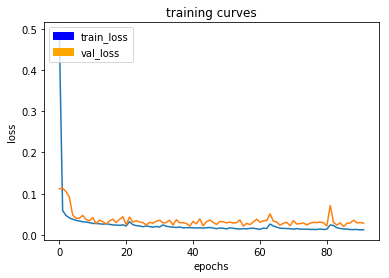

129/129 [==============================] - 49s - loss: 0.0132 - val_loss: 0.0289
Epoch 93/200
128/129 [============================>.] - ETA: 0s - loss: 0.0126

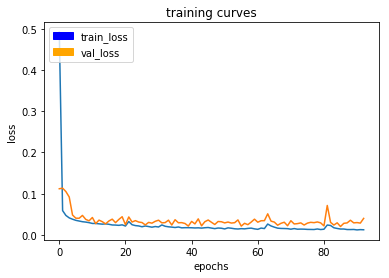

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0402
Epoch 94/200
128/129 [============================>.] - ETA: 0s - loss: 0.0132

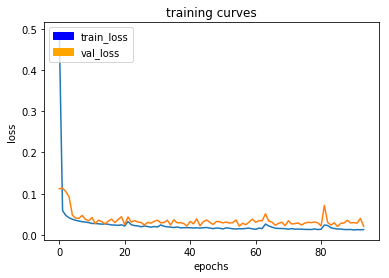

129/129 [==============================] - 49s - loss: 0.0132 - val_loss: 0.0213
Epoch 95/200
128/129 [============================>.] - ETA: 0s - loss: 0.0124

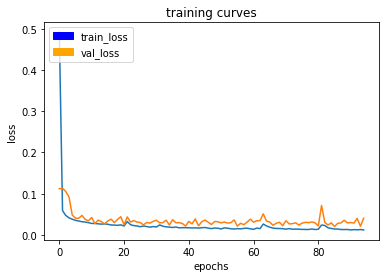

129/129 [==============================] - 49s - loss: 0.0124 - val_loss: 0.0407
Epoch 96/200
128/129 [============================>.] - ETA: 0s - loss: 0.0124

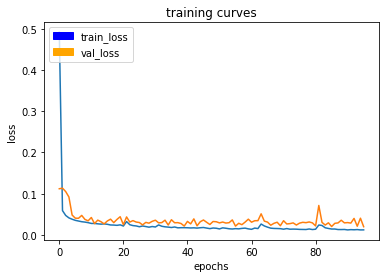

129/129 [==============================] - 49s - loss: 0.0124 - val_loss: 0.0201
Epoch 97/200
128/129 [============================>.] - ETA: 0s - loss: 0.0126

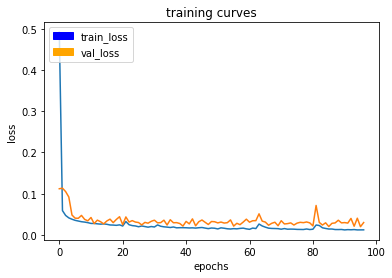

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0302
Epoch 98/200
128/129 [============================>.] - ETA: 0s - loss: 0.0126

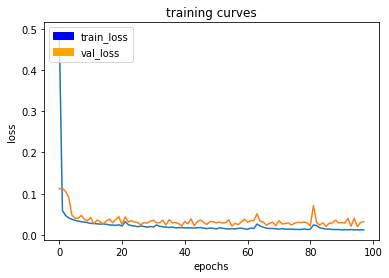

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0323
Epoch 99/200
128/129 [============================>.] - ETA: 0s - loss: 0.0137

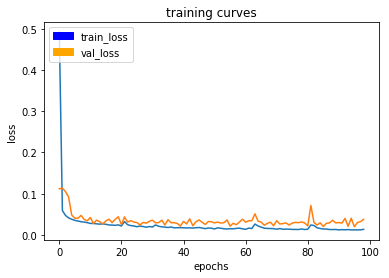

129/129 [==============================] - 49s - loss: 0.0137 - val_loss: 0.0379
Epoch 100/200
128/129 [============================>.] - ETA: 0s - loss: 0.0139

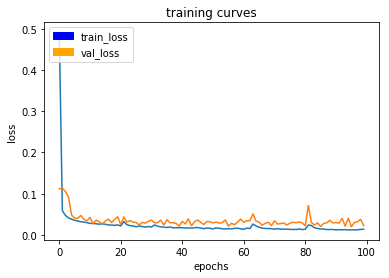

129/129 [==============================] - 49s - loss: 0.0139 - val_loss: 0.0228
Epoch 101/200
128/129 [============================>.] - ETA: 0s - loss: 0.0122

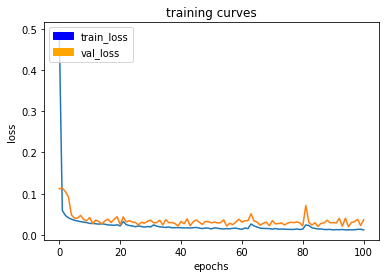

129/129 [==============================] - 49s - loss: 0.0122 - val_loss: 0.0369
Epoch 102/200
128/129 [============================>.] - ETA: 0s - loss: 0.0123

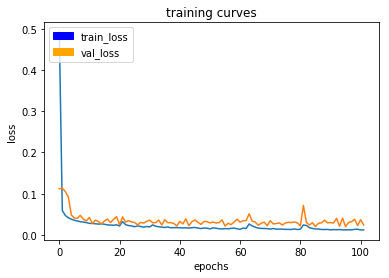

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0243
Epoch 103/200
128/129 [============================>.] - ETA: 0s - loss: 0.0128

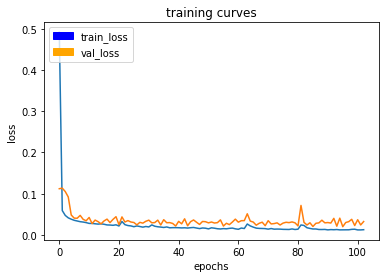

129/129 [==============================] - 50s - loss: 0.0128 - val_loss: 0.0326
Epoch 104/200
128/129 [============================>.] - ETA: 0s - loss: 0.0155

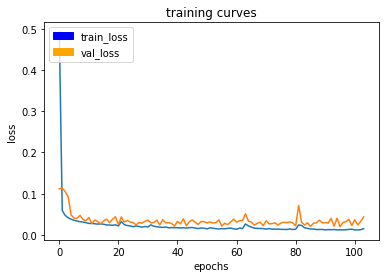

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0440
Epoch 105/200
128/129 [============================>.] - ETA: 0s - loss: 0.0154

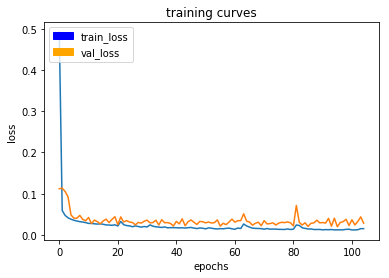

129/129 [==============================] - 49s - loss: 0.0154 - val_loss: 0.0284
Epoch 106/200
128/129 [============================>.] - ETA: 0s - loss: 0.0128

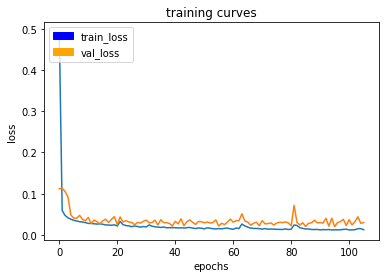

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0300
Epoch 107/200
128/129 [============================>.] - ETA: 0s - loss: 0.0120

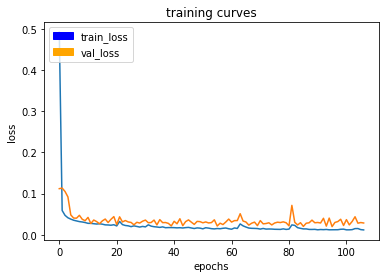

129/129 [==============================] - 49s - loss: 0.0120 - val_loss: 0.0288
Epoch 108/200
128/129 [============================>.] - ETA: 0s - loss: 0.0119

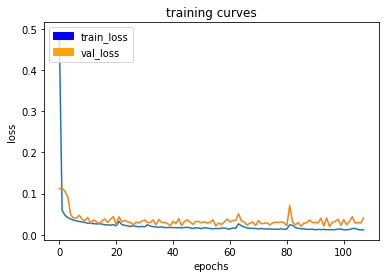

129/129 [==============================] - 49s - loss: 0.0119 - val_loss: 0.0412
Epoch 109/200
128/129 [============================>.] - ETA: 0s - loss: 0.0129

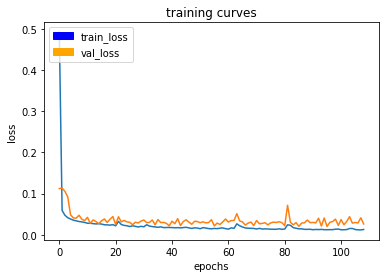

129/129 [==============================] - 49s - loss: 0.0131 - val_loss: 0.0263
Epoch 110/200
128/129 [============================>.] - ETA: 0s - loss: 0.0129

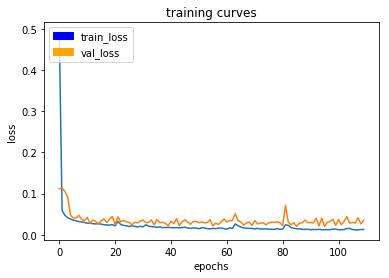

129/129 [==============================] - 49s - loss: 0.0129 - val_loss: 0.0353
Epoch 111/200
128/129 [============================>.] - ETA: 0s - loss: 0.0130

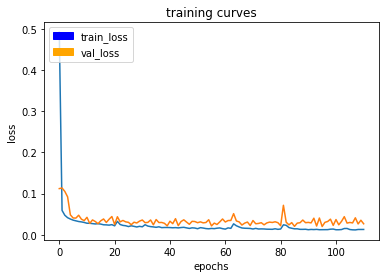

129/129 [==============================] - 49s - loss: 0.0130 - val_loss: 0.0267
Epoch 112/200
128/129 [============================>.] - ETA: 0s - loss: 0.0116

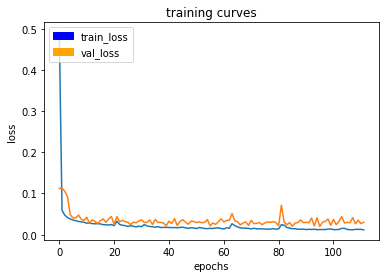

129/129 [==============================] - 49s - loss: 0.0116 - val_loss: 0.0303
Epoch 113/200
128/129 [============================>.] - ETA: 0s - loss: 0.0114

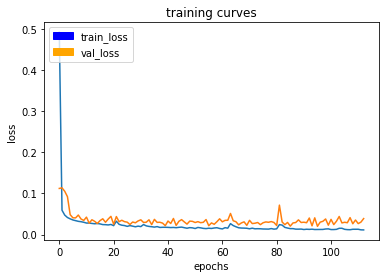

129/129 [==============================] - 49s - loss: 0.0114 - val_loss: 0.0389
Epoch 114/200
128/129 [============================>.] - ETA: 0s - loss: 0.0113

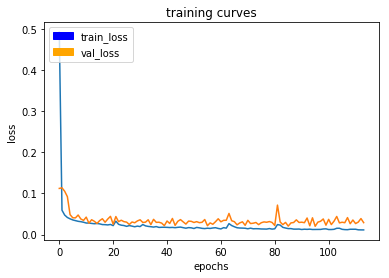

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0290
Epoch 115/200
128/129 [============================>.] - ETA: 0s - loss: 0.0118

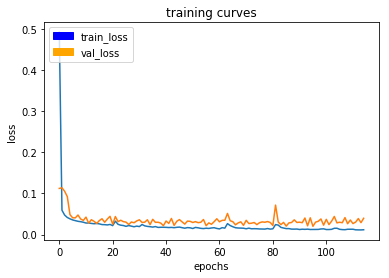

129/129 [==============================] - 49s - loss: 0.0118 - val_loss: 0.0395
Epoch 116/200
128/129 [============================>.] - ETA: 0s - loss: 0.0128

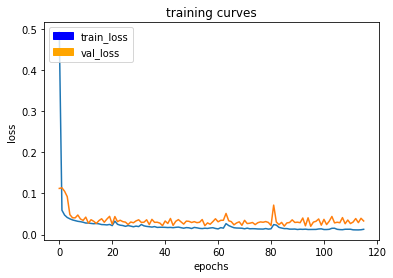

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0330
Epoch 117/200
128/129 [============================>.] - ETA: 0s - loss: 0.0126

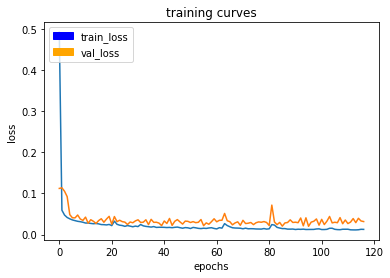

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0316
Epoch 118/200
128/129 [============================>.] - ETA: 0s - loss: 0.0123

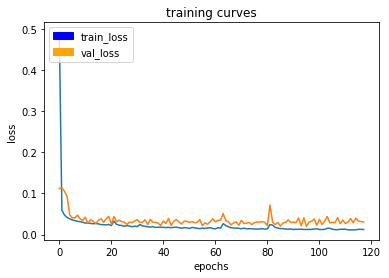

129/129 [==============================] - 49s - loss: 0.0123 - val_loss: 0.0307
Epoch 119/200
128/129 [============================>.] - ETA: 0s - loss: 0.0113

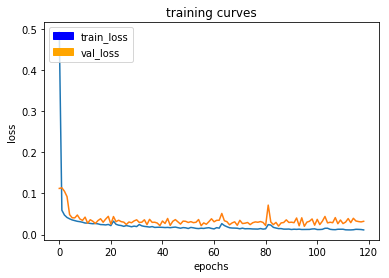

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0322
Epoch 120/200
128/129 [============================>.] - ETA: 0s - loss: 0.0135

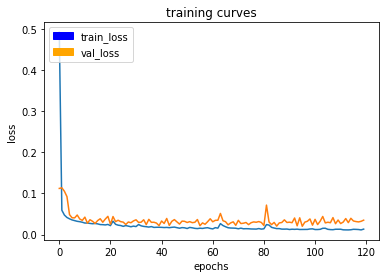

129/129 [==============================] - 49s - loss: 0.0136 - val_loss: 0.0350
Epoch 121/200
128/129 [============================>.] - ETA: 0s - loss: 0.0138

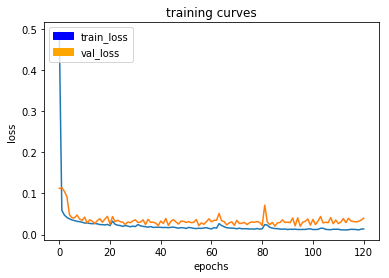

129/129 [==============================] - 49s - loss: 0.0138 - val_loss: 0.0398
Epoch 122/200
128/129 [============================>.] - ETA: 0s - loss: 0.0119

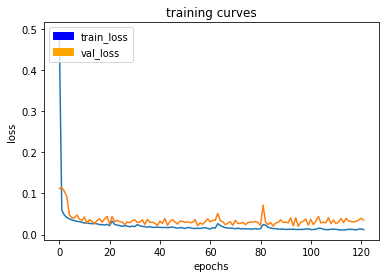

129/129 [==============================] - 49s - loss: 0.0119 - val_loss: 0.0349
Epoch 123/200
128/129 [============================>.] - ETA: 0s - loss: 0.0113

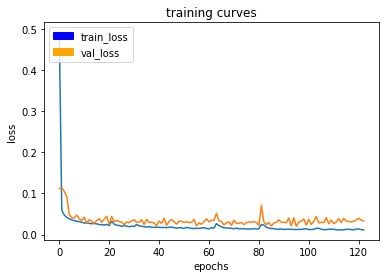

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0329
Epoch 124/200
128/129 [============================>.] - ETA: 0s - loss: 0.0113

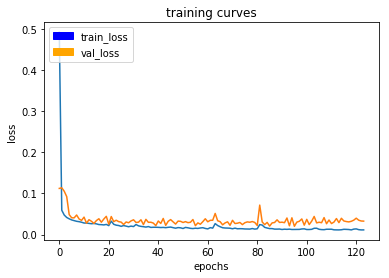

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0326
Epoch 125/200
128/129 [============================>.] - ETA: 0s - loss: 0.0115

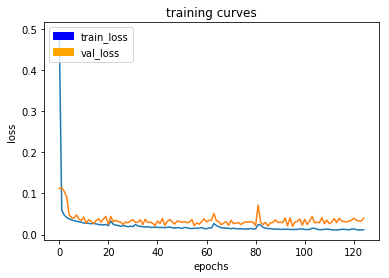

129/129 [==============================] - 49s - loss: 0.0115 - val_loss: 0.0398
Epoch 126/200
128/129 [============================>.] - ETA: 0s - loss: 0.0112

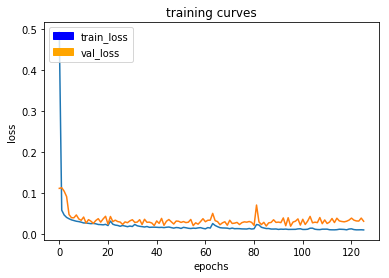

129/129 [==============================] - 49s - loss: 0.0111 - val_loss: 0.0321
Epoch 127/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

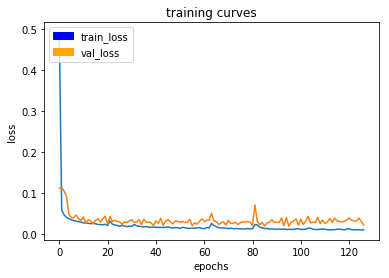

129/129 [==============================] - 49s - loss: 0.0110 - val_loss: 0.0229
Epoch 128/200
128/129 [============================>.] - ETA: 0s - loss: 0.0106

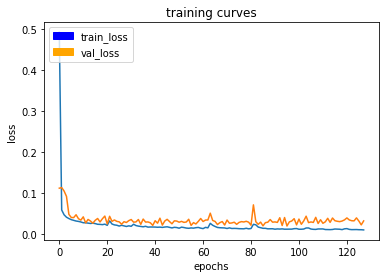

129/129 [==============================] - 49s - loss: 0.0106 - val_loss: 0.0326
Epoch 129/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

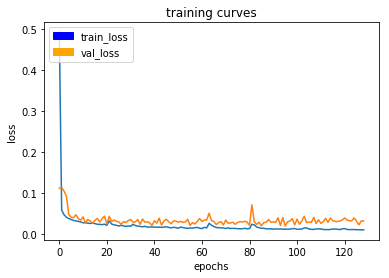

129/129 [==============================] - 49s - loss: 0.0110 - val_loss: 0.0322
Epoch 130/200
128/129 [============================>.] - ETA: 0s - loss: 0.0107

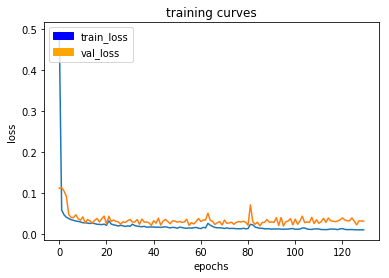

129/129 [==============================] - 49s - loss: 0.0107 - val_loss: 0.0318
Epoch 131/200
128/129 [============================>.] - ETA: 0s - loss: 0.0113

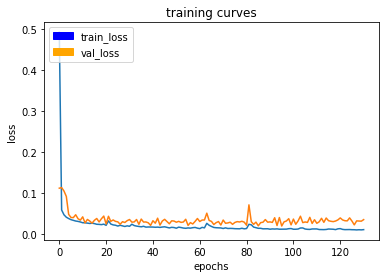

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0356
Epoch 132/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

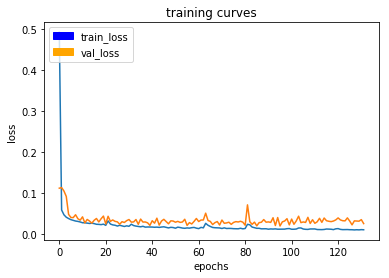

129/129 [==============================] - 49s - loss: 0.0109 - val_loss: 0.0260
Epoch 133/200
128/129 [============================>.] - ETA: 0s - loss: 0.0155

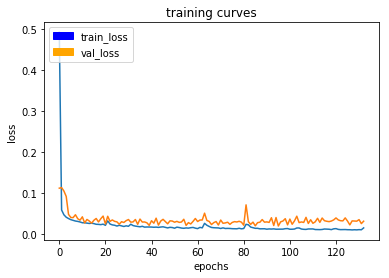

129/129 [==============================] - 49s - loss: 0.0155 - val_loss: 0.0318
Epoch 134/200
128/129 [============================>.] - ETA: 0s - loss: 0.0153

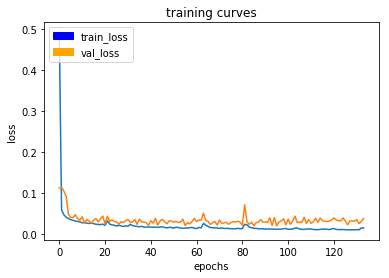

129/129 [==============================] - 49s - loss: 0.0152 - val_loss: 0.0382
Epoch 135/200
128/129 [============================>.] - ETA: 0s - loss: 0.0137

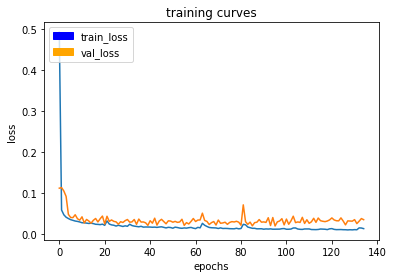

129/129 [==============================] - 49s - loss: 0.0137 - val_loss: 0.0355
Epoch 136/200
128/129 [============================>.] - ETA: 0s - loss: 0.0123

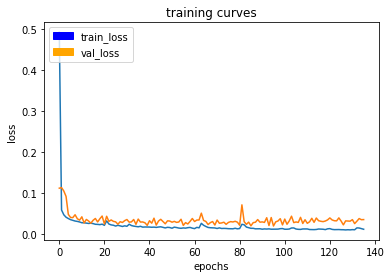

129/129 [==============================] - 49s - loss: 0.0122 - val_loss: 0.0357
Epoch 137/200
128/129 [============================>.] - ETA: 0s - loss: 0.0113

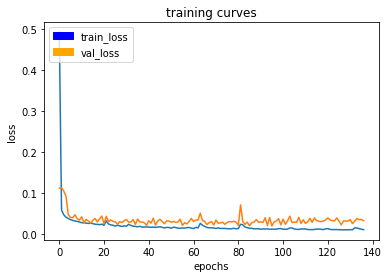

129/129 [==============================] - 49s - loss: 0.0113 - val_loss: 0.0330
Epoch 138/200
128/129 [============================>.] - ETA: 0s - loss: 0.0111

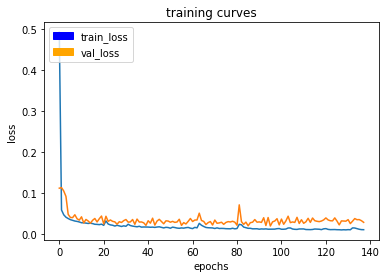

129/129 [==============================] - 49s - loss: 0.0111 - val_loss: 0.0290
Epoch 139/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

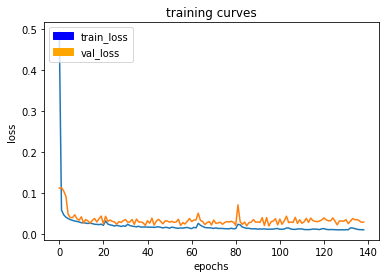

129/129 [==============================] - 49s - loss: 0.0110 - val_loss: 0.0298
Epoch 140/200
128/129 [============================>.] - ETA: 0s - loss: 0.0107

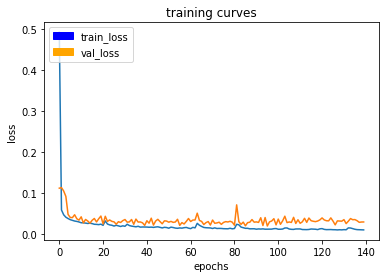

129/129 [==============================] - 49s - loss: 0.0107 - val_loss: 0.0299
Epoch 141/200
128/129 [============================>.] - ETA: 0s - loss: 0.0105

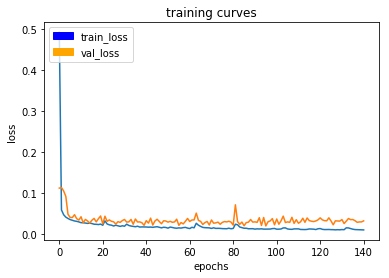

129/129 [==============================] - 49s - loss: 0.0104 - val_loss: 0.0325
Epoch 142/200
128/129 [============================>.] - ETA: 0s - loss: 0.0106

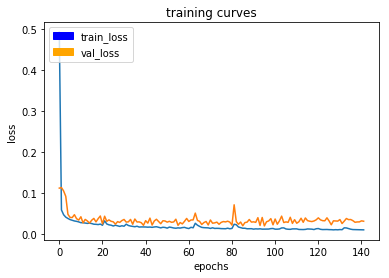

129/129 [==============================] - 49s - loss: 0.0106 - val_loss: 0.0316
Epoch 143/200
128/129 [============================>.] - ETA: 0s - loss: 0.0104

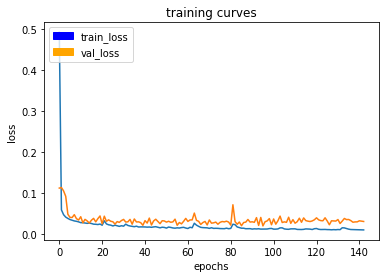

129/129 [==============================] - 49s - loss: 0.0104 - val_loss: 0.0309
Epoch 144/200
128/129 [============================>.] - ETA: 0s - loss: 0.0104

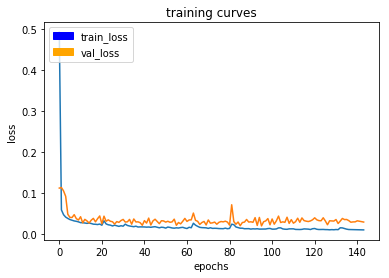

129/129 [==============================] - 49s - loss: 0.0104 - val_loss: 0.0295
Epoch 145/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

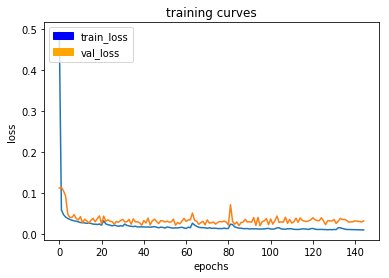

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0320
Epoch 146/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

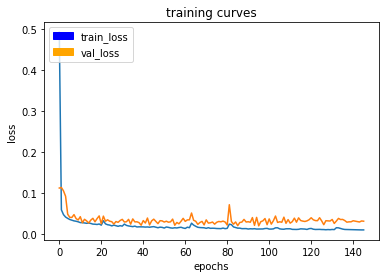

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0314
Epoch 147/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

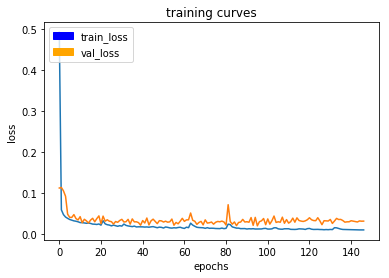

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0315
Epoch 148/200
128/129 [============================>.] - ETA: 0s - loss: 0.0103

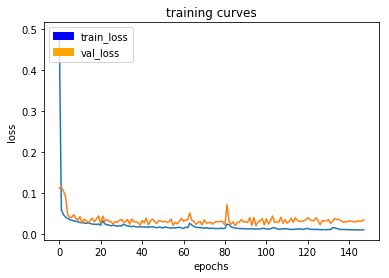

129/129 [==============================] - 49s - loss: 0.0103 - val_loss: 0.0351
Epoch 149/200
128/129 [============================>.] - ETA: 0s - loss: 0.0101

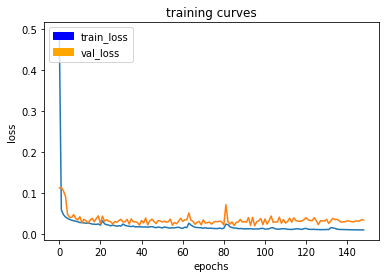

129/129 [==============================] - 49s - loss: 0.0101 - val_loss: 0.0339
Epoch 150/200
128/129 [============================>.] - ETA: 0s - loss: 0.0149

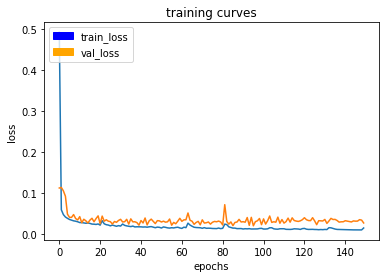

129/129 [==============================] - 49s - loss: 0.0148 - val_loss: 0.0270
Epoch 151/200
128/129 [============================>.] - ETA: 0s - loss: 0.0133

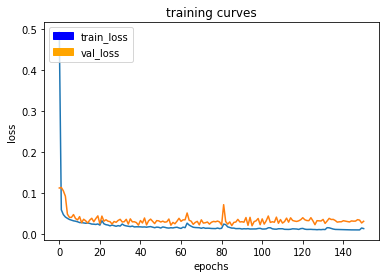

129/129 [==============================] - 49s - loss: 0.0133 - val_loss: 0.0311
Epoch 152/200
128/129 [============================>.] - ETA: 0s - loss: 0.0109

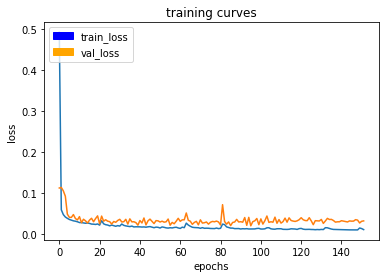

129/129 [==============================] - 49s - loss: 0.0109 - val_loss: 0.0321
Epoch 153/200
128/129 [============================>.] - ETA: 0s - loss: 0.0105

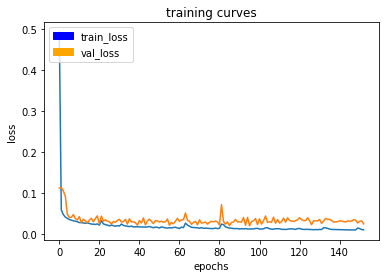

129/129 [==============================] - 49s - loss: 0.0105 - val_loss: 0.0249
Epoch 154/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

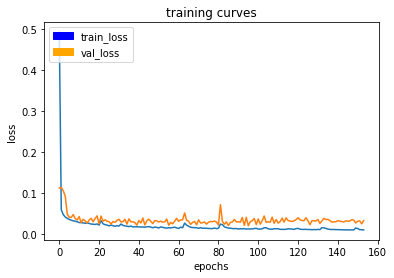

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0329
Epoch 155/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

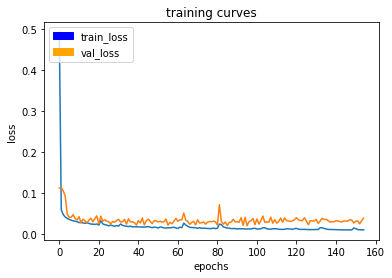

129/129 [==============================] - 49s - loss: 0.0102 - val_loss: 0.0387
Epoch 156/200
128/129 [============================>.] - ETA: 0s - loss: 0.0147

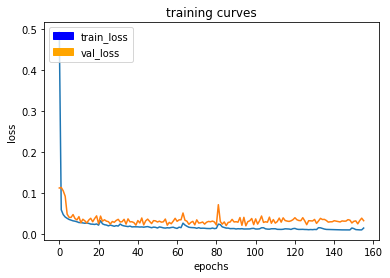

129/129 [==============================] - 49s - loss: 0.0147 - val_loss: 0.0326
Epoch 157/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

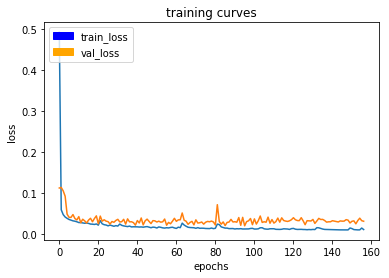

129/129 [==============================] - 49s - loss: 0.0110 - val_loss: 0.0312
Epoch 158/200
128/129 [============================>.] - ETA: 0s - loss: 0.0129

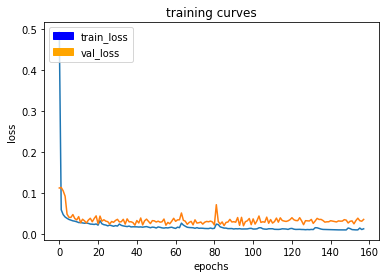

129/129 [==============================] - 49s - loss: 0.0128 - val_loss: 0.0356
Epoch 159/200
128/129 [============================>.] - ETA: 0s - loss: 0.0127

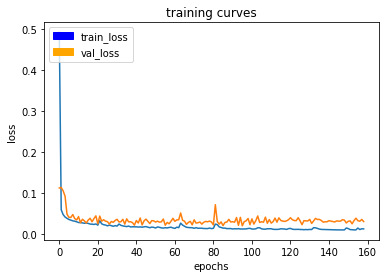

129/129 [==============================] - 49s - loss: 0.0126 - val_loss: 0.0305
Epoch 160/200
128/129 [============================>.] - ETA: 0s - loss: 0.0125

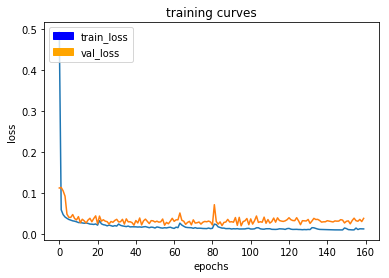

129/129 [==============================] - 49s - loss: 0.0125 - val_loss: 0.0383
Epoch 161/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

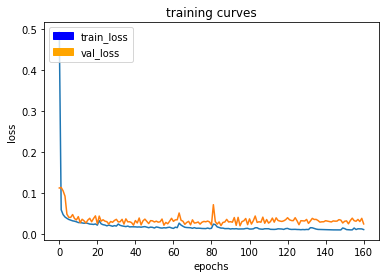

129/129 [==============================] - 99s - loss: 0.0110 - val_loss: 0.0247
Epoch 162/200
128/129 [============================>.] - ETA: 0s - loss: 0.0106

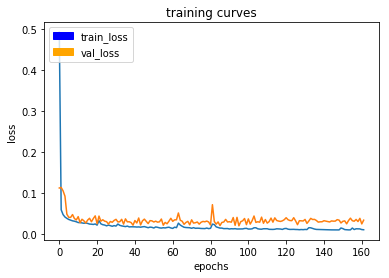

129/129 [==============================] - 102s - loss: 0.0106 - val_loss: 0.0338
Epoch 163/200
128/129 [============================>.] - ETA: 0s - loss: 0.0100

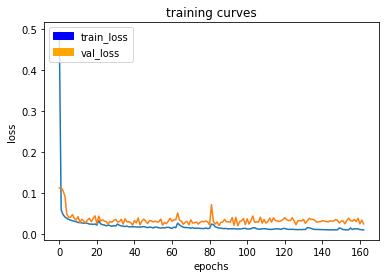

129/129 [==============================] - 66s - loss: 0.0100 - val_loss: 0.0245
Epoch 164/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

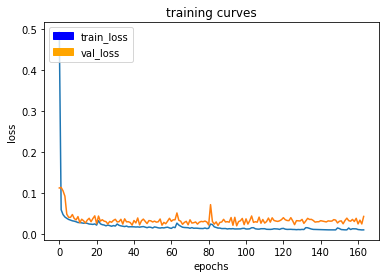

129/129 [==============================] - 50s - loss: 0.0102 - val_loss: 0.0428
Epoch 165/200
128/129 [============================>.] - ETA: 0s - loss: 0.0101

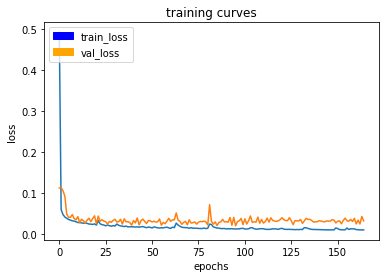

129/129 [==============================] - 49s - loss: 0.0101 - val_loss: 0.0320
Epoch 166/200
128/129 [============================>.] - ETA: 0s - loss: 0.0101

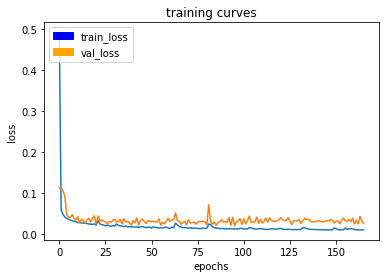

129/129 [==============================] - 50s - loss: 0.0101 - val_loss: 0.0264
Epoch 167/200
128/129 [============================>.] - ETA: 0s - loss: 0.0097

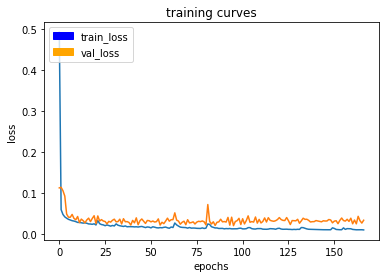

129/129 [==============================] - 50s - loss: 0.0097 - val_loss: 0.0333
Epoch 168/200
128/129 [============================>.] - ETA: 0s - loss: 0.0098

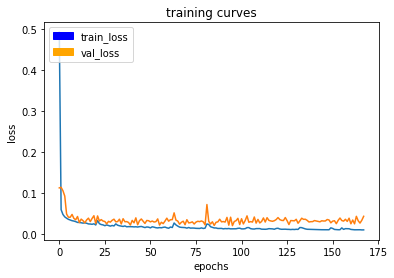

129/129 [==============================] - 50s - loss: 0.0098 - val_loss: 0.0428
Epoch 169/200
128/129 [============================>.] - ETA: 0s - loss: 0.0112

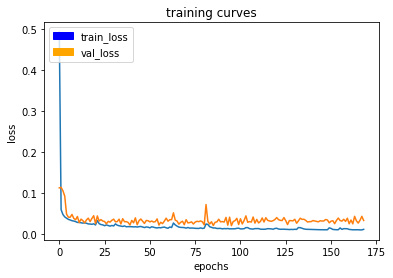

129/129 [==============================] - 50s - loss: 0.0111 - val_loss: 0.0327
Epoch 170/200
128/129 [============================>.] - ETA: 0s - loss: 0.0101

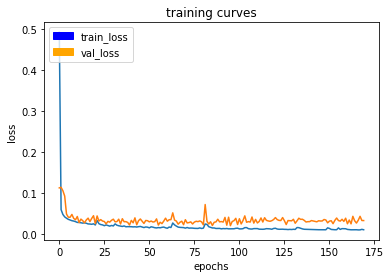

129/129 [==============================] - 50s - loss: 0.0101 - val_loss: 0.0325
Epoch 171/200
128/129 [============================>.] - ETA: 0s - loss: 0.0121

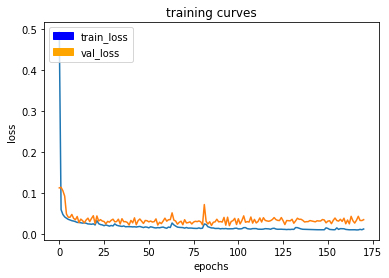

129/129 [==============================] - 50s - loss: 0.0121 - val_loss: 0.0347
Epoch 172/200
128/129 [============================>.] - ETA: 0s - loss: 0.0107

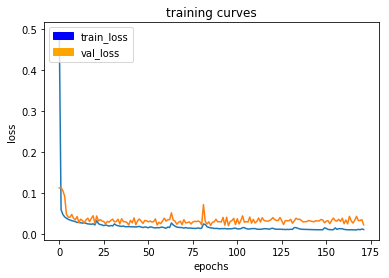

129/129 [==============================] - 50s - loss: 0.0107 - val_loss: 0.0221
Epoch 173/200
128/129 [============================>.] - ETA: 0s - loss: 0.0115

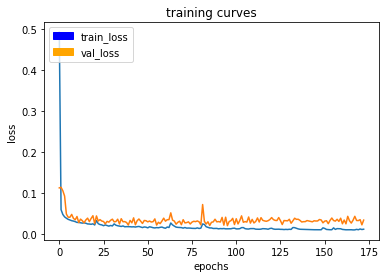

129/129 [==============================] - 50s - loss: 0.0115 - val_loss: 0.0336
Epoch 174/200
128/129 [============================>.] - ETA: 0s - loss: 0.0105

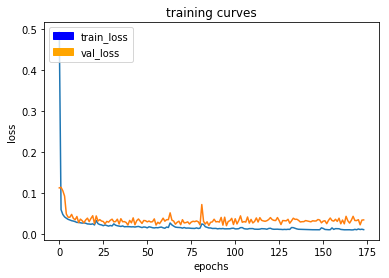

129/129 [==============================] - 50s - loss: 0.0105 - val_loss: 0.0342
Epoch 175/200
128/129 [============================>.] - ETA: 0s - loss: 0.0098

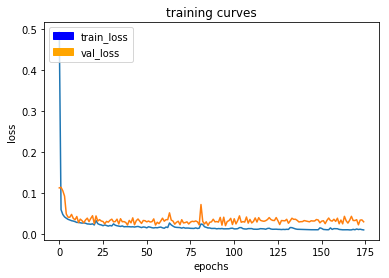

129/129 [==============================] - 50s - loss: 0.0098 - val_loss: 0.0295
Epoch 176/200
128/129 [============================>.] - ETA: 0s - loss: 0.0099

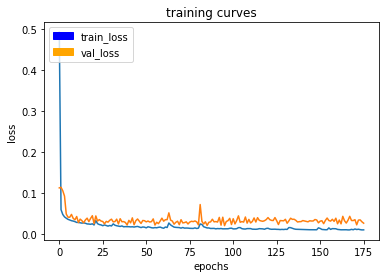

129/129 [==============================] - 50s - loss: 0.0099 - val_loss: 0.0261
Epoch 177/200
128/129 [============================>.] - ETA: 0s - loss: 0.0099

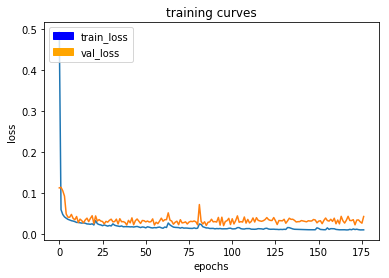

129/129 [==============================] - 50s - loss: 0.0099 - val_loss: 0.0424
Epoch 178/200
128/129 [============================>.] - ETA: 0s - loss: 0.0097

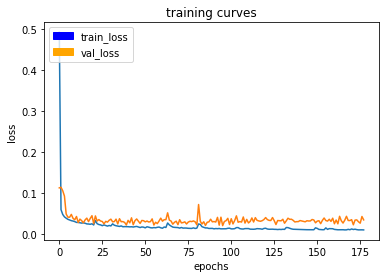

129/129 [==============================] - 50s - loss: 0.0097 - val_loss: 0.0342
Epoch 179/200
128/129 [============================>.] - ETA: 0s - loss: 0.0117

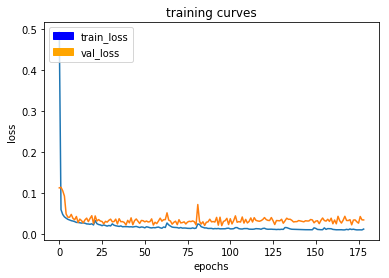

129/129 [==============================] - 50s - loss: 0.0118 - val_loss: 0.0340
Epoch 180/200
128/129 [============================>.] - ETA: 0s - loss: 0.0237

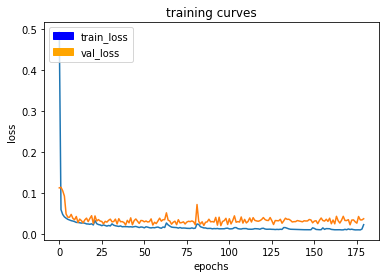

129/129 [==============================] - 50s - loss: 0.0237 - val_loss: 0.0369
Epoch 181/200
128/129 [============================>.] - ETA: 0s - loss: 0.0167

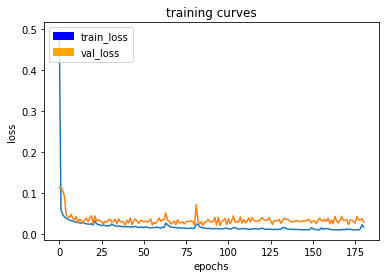

129/129 [==============================] - 50s - loss: 0.0166 - val_loss: 0.0285
Epoch 182/200
128/129 [============================>.] - ETA: 0s - loss: 0.0130

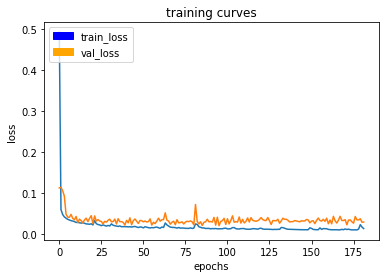

129/129 [==============================] - 50s - loss: 0.0130 - val_loss: 0.0290
Epoch 183/200
128/129 [============================>.] - ETA: 0s - loss: 0.0116

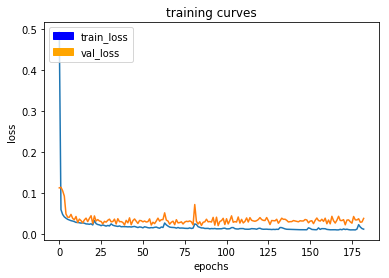

129/129 [==============================] - 50s - loss: 0.0115 - val_loss: 0.0378
Epoch 184/200
128/129 [============================>.] - ETA: 0s - loss: 0.0110

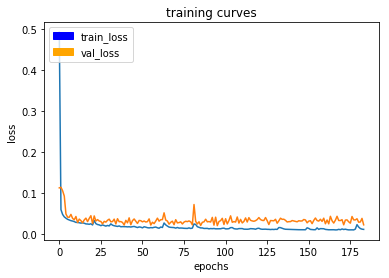

129/129 [==============================] - 50s - loss: 0.0110 - val_loss: 0.0221
Epoch 185/200
128/129 [============================>.] - ETA: 0s - loss: 0.0106

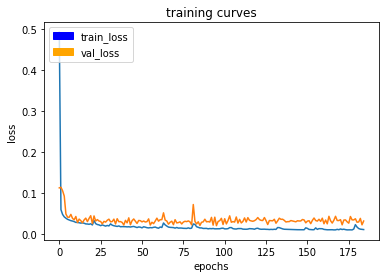

129/129 [==============================] - 50s - loss: 0.0106 - val_loss: 0.0313
Epoch 186/200
128/129 [============================>.] - ETA: 0s - loss: 0.0105

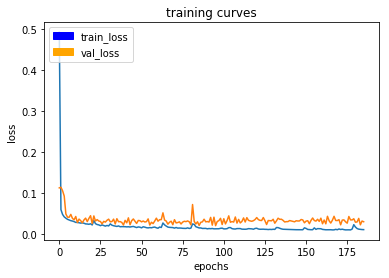

129/129 [==============================] - 50s - loss: 0.0104 - val_loss: 0.0296
Epoch 187/200
128/129 [============================>.] - ETA: 0s - loss: 0.0101

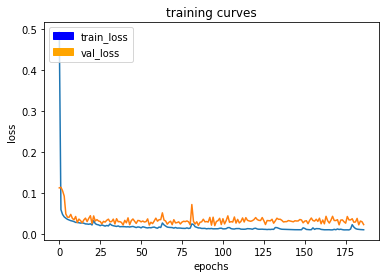

129/129 [==============================] - 50s - loss: 0.0101 - val_loss: 0.0226
Epoch 188/200
128/129 [============================>.] - ETA: 0s - loss: 0.0099

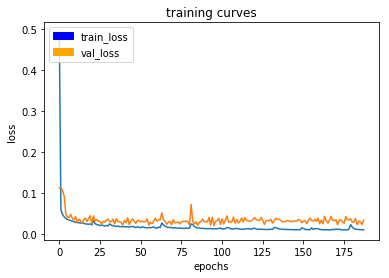

129/129 [==============================] - 50s - loss: 0.0099 - val_loss: 0.0336
Epoch 189/200
128/129 [============================>.] - ETA: 0s - loss: 0.0121

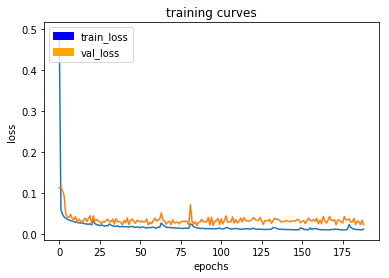

129/129 [==============================] - 50s - loss: 0.0121 - val_loss: 0.0223
Epoch 190/200
128/129 [============================>.] - ETA: 0s - loss: 0.0107

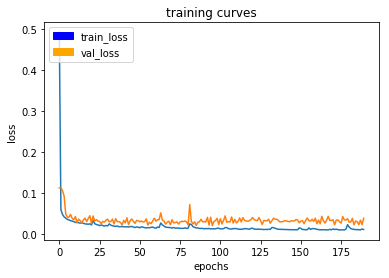

129/129 [==============================] - 50s - loss: 0.0107 - val_loss: 0.0381
Epoch 191/200
128/129 [============================>.] - ETA: 0s - loss: 0.0102

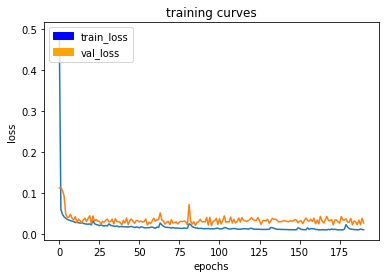

129/129 [==============================] - 50s - loss: 0.0102 - val_loss: 0.0266
Epoch 192/200
128/129 [============================>.] - ETA: 0s - loss: 0.0097

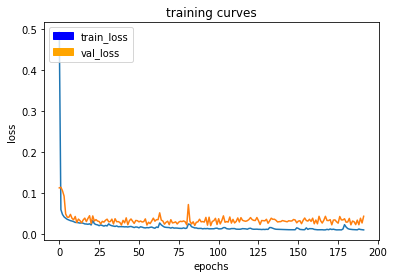

129/129 [==============================] - 50s - loss: 0.0097 - val_loss: 0.0429
Epoch 193/200
128/129 [============================>.] - ETA: 0s - loss: 0.0103

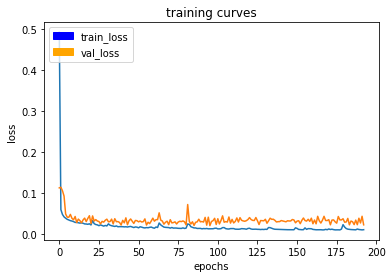

129/129 [==============================] - 50s - loss: 0.0103 - val_loss: 0.0221
Epoch 194/200
128/129 [============================>.] - ETA: 0s - loss: 0.0100

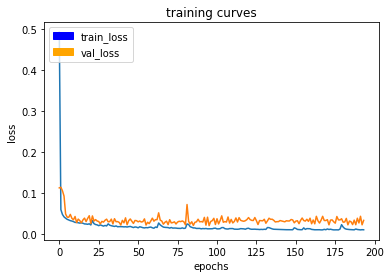

129/129 [==============================] - 50s - loss: 0.0100 - val_loss: 0.0329
Epoch 195/200
128/129 [============================>.] - ETA: 0s - loss: 0.0096

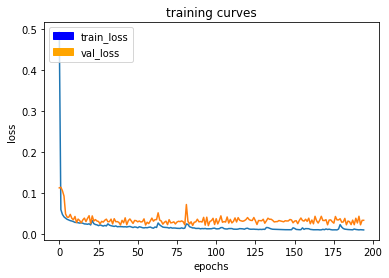

129/129 [==============================] - 50s - loss: 0.0096 - val_loss: 0.0331
Epoch 196/200
128/129 [============================>.] - ETA: 0s - loss: 0.0097

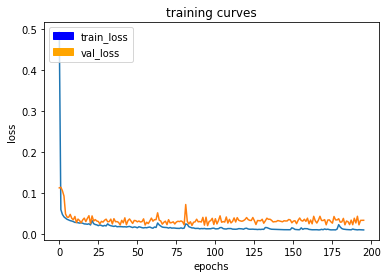

129/129 [==============================] - 50s - loss: 0.0097 - val_loss: 0.0331
Epoch 197/200
128/129 [============================>.] - ETA: 0s - loss: 0.0098

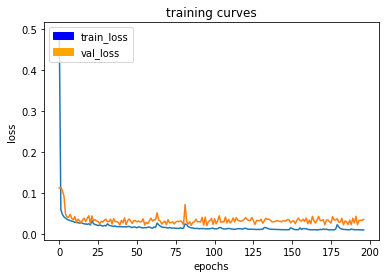

129/129 [==============================] - 50s - loss: 0.0098 - val_loss: 0.0351
Epoch 198/200
128/129 [============================>.] - ETA: 0s - loss: 0.0095

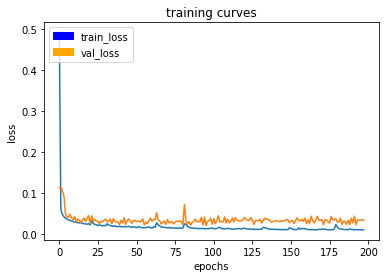

129/129 [==============================] - 50s - loss: 0.0094 - val_loss: 0.0323
Epoch 199/200
128/129 [============================>.] - ETA: 0s - loss: 0.0098

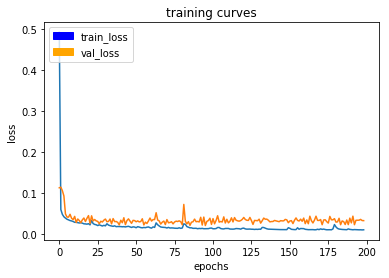

129/129 [==============================] - 50s - loss: 0.0098 - val_loss: 0.0320
Epoch 200/200
128/129 [============================>.] - ETA: 0s - loss: 0.0106

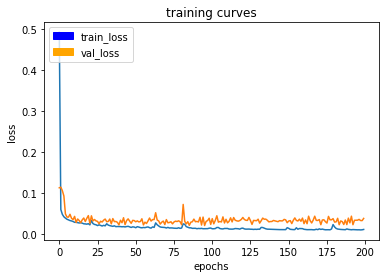

129/129 [==============================] - 50s - loss: 0.0106 - val_loss: 0.0375


In [7]:
# set up the experiment
BATCH_SIZE = 32
LEARNING_RATE = 0.001

cEpochs = [ 10, 25, 50, 100, 150, 200 ]
modelType = MODEL_FCN_SIMPLE

_epochsExperiments = []

for i in range( len( cEpochs ) ) :
    _epochs = cEpochs[i]
    print( 'TESTING NUM EPOCHS: ', _epochs )
    # create and run experiment
    _experiment = Experiment( LEARNING_RATE, BATCH_SIZE, _epochs, modelType )
    _experiment.run()
    # save it for later use
    _epochsExperiments.append( _experiment )


In [8]:
# plot the results
for i in range( len( _epochsExperiments ) ) :
    print( _epochsExperiments[i].model().getTrainHistory() )

{'loss': [0.4898832489580287, 0.0581172663978366, 0.046407875539719055, 0.04170484361371694, 0.03819787427037773, 0.03579183934548623, 0.03398722784457831, 0.032185160768293086, 0.029948136139643807, 0.029919847328453042], 'val_loss': [0.10956949116410436, 0.09818306404191095, 0.1003795918580648, 0.0927406561535758, 0.06261265131871442, 0.045635570847504844, 0.043512385741278935, 0.037882349781087926, 0.0360619462523106, 0.04512683095762859]}
{'loss': [0.48901864251921195, 0.05834762148501337, 0.045892903866179544, 0.04049547249371757, 0.036575721147388156, 0.03750982555049778, 0.033053659656973225, 0.031958957999094026, 0.030737828369706573, 0.02844867246213207, 0.028899304118897164, 0.027329404936763942, 0.02637013548789271, 0.026619302368354553, 0.02526883692527201, 0.024988400291585142, 0.023392811714766752, 0.024181978469412335, 0.02347104666901379, 0.02192270511656338, 0.02411678298548042, 0.020045282123789872, 0.023353542609512442, 0.022000899417977938, 0.021229604136441416], 'v

## Plotting the results of the experiments

In [13]:
# plotting the results and checking what goes right and wrong
# ( here I just load them from a savefile, as my computer crashed right ...
# after I finished the experiments )

EXPERIMENT_LEARNING_RATE = 'Lrate'
EXPERIMENT_BATCH_SIZE = 'Bsize'
EXPERIMENT_EPOCHS = 'Epochs'

import json
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

def loadResults( experimentId ) :
    _fname = ''
    if experimentId == EXPERIMENT_LEARNING_RATE :
        _fname = 'exp_lrate.json'
    elif experimentId == EXPERIMENT_BATCH_SIZE :
        _fname = 'exp_bsize.json'
    elif experimentId == EXPERIMENT_EPOCHS :
        _fname = 'exp_epochs.json'
    else :
        print( 'Wrong experiment requested' )
        return
    
    _fhandle = open( '_experiments/' + _fname, 'rb' )
    _expData = json.load( _fhandle )
    
    return _expData

def plotResults( experimentId, experimentData, mode = 'training' ) :
    _experiments = experimentData['experiments']
    # plot training loss
    _fig, _ax = plt.subplots()
    _modeTitle = 'TRAINING_LOSS' if mode == 'training' else 'VALIDATION_LOSS'
    _ax.set_title( _modeTitle + ': ' + experimentId )
    _handles = []
    for _experiment in _experiments :
        _hvalue = _experiment['hvalue']
        _tlosses = _experiment['loss']
        _vlosses = _experiment['val_loss']
        
        _color = tuple( [ np.random.random() for i in range( 3 ) ] )
        _patch = mpatches.Patch( color = _color, label = ( experimentId + ': ' +str( _hvalue ) ) )
        _handles.append( _patch )
        
        if mode == 'training' :
            _ax.plot( _tlosses, color = _color )
        else :
            _ax.plot( _vlosses, color = _color )
    
    plt.legend( handles = _handles )

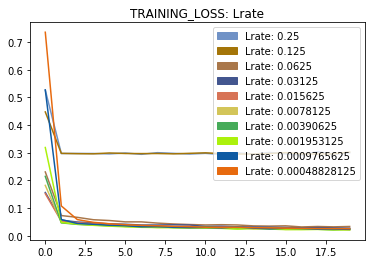

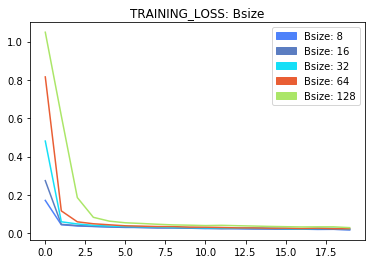

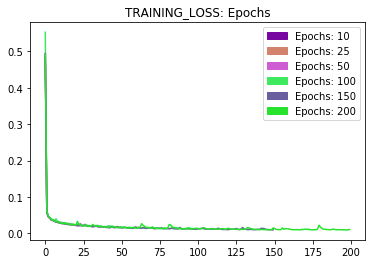

In [14]:
# training results
plotResults( EXPERIMENT_LEARNING_RATE, loadResults( EXPERIMENT_LEARNING_RATE ), mode = 'training' )
plotResults( EXPERIMENT_BATCH_SIZE, loadResults( EXPERIMENT_BATCH_SIZE ), mode = 'training' )
plotResults( EXPERIMENT_EPOCHS, loadResults( EXPERIMENT_EPOCHS ), mode = 'training' )

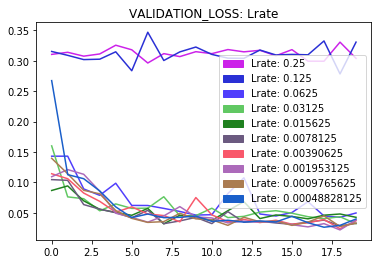

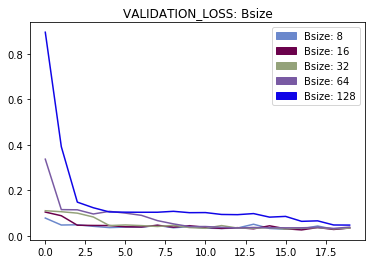

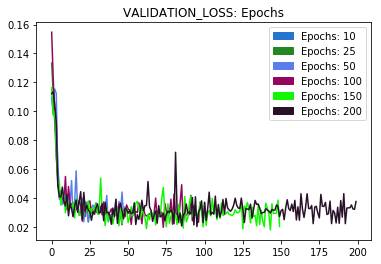

In [15]:
# validation results
# training results
plotResults( EXPERIMENT_LEARNING_RATE, loadResults( EXPERIMENT_LEARNING_RATE ), mode = 'validation' )
plotResults( EXPERIMENT_BATCH_SIZE, loadResults( EXPERIMENT_BATCH_SIZE ), mode = 'validation' )
plotResults( EXPERIMENT_EPOCHS, loadResults( EXPERIMENT_EPOCHS ), mode = 'validation' )